#  1 Data Understading & Preparation

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

from matplotlib.ticker import AutoMinorLocator
from matplotlib import gridspec

#scaling, normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
#kmeans, dbscan, hierarchical (sklearn)
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
#evaluation
from sklearn.metrics import silhouette_score
from sklearn import metrics

#distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform
# hierarchical (scipy)
from scipy.cluster.hierarchy import linkage, dendrogram
#seaborn #bokeh #altair
from sklearn.decomposition import PCA

from yellowbrick.cluster import KElbowVisualizer
from google.colab import files

!pip install pyfim
from fim import apriori

     |████████████████████████████████| 357 kB 13.9 MB/s 
  Created wheel for pyfim: filename=pyfim-6.28-cp37-cp37m-linux_x86_64.whl size=537786 sha256=7f0c078240f9aada9e12e1e542a02d2fa17a14ed48ebaebe13981e6baf197a47
  Stored in directory: /root/.cache/pip/wheels/08/9f/26/09cb4efd027e46f96e0a0f33d0a74be614d3caf89c1eeb75a8
Successfully built pyfim


In [ ]:
#caricamento del dataset
df = pd.read_csv('words_glasgow.csv')
#faccio una copia del dataset in caso di manipolazione dati
dfcopy= df.copy()

In [ ]:
#visualizzazione di alcune righe per avere un'idea dei dati
#le prime righe
df.head()

,word,length,arousal,valence,dominance,concreteness,imageability,familiarity,aoa,semsize,gender,polysemy,web_corpus_freq
0,abattoir,8,4.200,2.864,4.333,5.455,4.391,2.382,6.760,4.652,5.391,0,160074.0
1,abbey,5,3.125,5.781,4.667,5.906,5.344,3.324,5.177,5.121,3.303,0,4224864.0
2,abbreviate,10,3.273,5.250,5.235,3.286,3.177,5.121,5.543,2.667,3.971,0,140105.0
3,abdicate,8,4.194,3.767,4.419,3.367,2.516,3.971,6.233,4.679,5.167,0,124123.0
4,abdication,10,3.846,3.880,4.800,3.292,2.571,3.097,6.407,5.083,4.571,0,128143.0


In [ ]:
#le ultime righe
df.tail()

,word,length,arousal,valence,dominance,concreteness,imageability,familiarity,aoa,semsize,gender,polysemy,web_corpus_freq
4677,zeppelin,8,6.185,5.000,5.333,6.286,6.185,3.167,6.036,5.464,5.269,0,3192943.0
4678,zero,4,4.031,4.182,4.567,2.688,3.903,6.269,2.636,1.758,4.172,0,30735412.0
4679,zest,4,5.969,6.818,6.121,4.438,4.033,4.000,5.364,2.636,3.452,0,655010.0
4680,zoo,3,5.909,6.235,5.485,6.118,6.441,5.655,2.324,4.844,4.059,0,11589578.0
4681,zoology,7,4.571,5.765,5.114,4.429,3.914,4.382,5.824,4.571,3.657,0,1672374.0


In [ ]:
#visualizzazione della dimensione 
df.shape

(4682, 13)

In [ ]:
#prima ricognizione indicativa sui dati
df.describe()

,length,arousal,valence,dominance,concreteness,imageability,familiarity,aoa,semsize,gender,polysemy,web_corpus_freq
count,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4.668000e+03
mean,6.348355,4.678129,5.086797,5.044939,4.566273,4.723018,5.271335,4.143427,4.136403,4.099933,0.080948,2.988976e+07
std,2.006230,1.097163,1.594344,0.930669,1.433689,1.363110,0.921218,1.252770,1.023293,0.912293,0.272785,8.490144e+07
min,2.000000,2.057000,1.030000,1.941000,1.636000,1.737000,1.647000,1.219000,1.375000,1.000000,0.000000,1.277000e+04
25%,5.000000,3.849000,4.115000,4.529000,3.242000,3.519250,4.706000,3.114000,3.438000,3.606000,0.000000,1.671100e+06
50%,6.000000,4.571000,5.290000,5.123000,4.471000,4.677000,5.438000,4.177000,4.186500,4.121000,0.000000,5.702982e+06
75%,8.000000,5.419000,6.088000,5.600000,5.971000,6.032000,5.969000,5.152000,4.882000,4.656000,0.000000,2.232705e+07
max,16.000000,8.177000,8.647000,8.371000,6.938000,6.941000,6.939000,6.971000,6.912000,6.971000,1.000000,2.022460e+09


In [ ]:
df.describe(include=['O'])

,word
count,4682
unique,4682
top,toward
freq,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4682 entries, 0 to 4681
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   word             4682 non-null   object 
 1   length           4682 non-null   int64  
 2   arousal          4682 non-null   float64
 3   valence          4682 non-null   float64
 4   dominance        4682 non-null   float64
 5   concreteness     4682 non-null   float64
 6   imageability     4682 non-null   float64
 7   familiarity      4682 non-null   float64
 8   aoa              4682 non-null   float64
 9   semsize          4682 non-null   float64
 10  gender           4682 non-null   float64
 11  polysemy         4682 non-null   int64  
 12  web_corpus_freq  4668 non-null   float64
dtypes: float64(10), int64(2), object(1)
memory usage: 475.6+ KB


In this dataset there are 4682 unique words. Each word is examined in regards of different variables. Those variables are lenght, arousal, valence, dominance, concretness, imageability, familiarity, age of aquisition, semsize gender, polysemy and frequence in a google web corpus.`

testo in corsivo## 1.1 Data Semantics

In [ ]:
colors1 = ['#e5f5f9','#99d8c9','#2ca25f']


In [ ]:
first=df.loc[:,"familiarity":]
aoa_descr=first.describe()

print(aoa_descr.to_latex())

\begin{tabular}{lrrrrrr}
\toprule
{} &  familiarity &          aoa &      semsize &       gender &     polysemy &  web\_corpus\_freq \\
\midrule
count &  4682.000000 &  4682.000000 &  4682.000000 &  4682.000000 &  4682.000000 &     4.668000e+03 \\
mean  &     5.271335 &     4.143427 &     4.136403 &     4.099933 &     0.080948 &     2.988976e+07 \\
std   &     0.921218 &     1.252770 &     1.023293 &     0.912293 &     0.272785 &     8.490144e+07 \\
min   &     1.647000 &     1.219000 &     1.375000 &     1.000000 &     0.000000 &     1.277000e+04 \\
25\%   &     4.706000 &     3.114000 &     3.438000 &     3.606000 &     0.000000 &     1.671100e+06 \\
50\%   &     5.438000 &     4.177000 &     4.186500 &     4.121000 &     0.000000 &     5.702982e+06 \\
75\%   &     5.969000 &     5.152000 &     4.882000 &     4.656000 &     0.000000 &     2.232705e+07 \\
max   &     6.939000 &     6.971000 &     6.912000 &     6.971000 &     1.000000 &     2.022460e+09 \\
\bottomrule
\end{tabular}



testo in grassetto

#### Arousal

Brief description of the variables

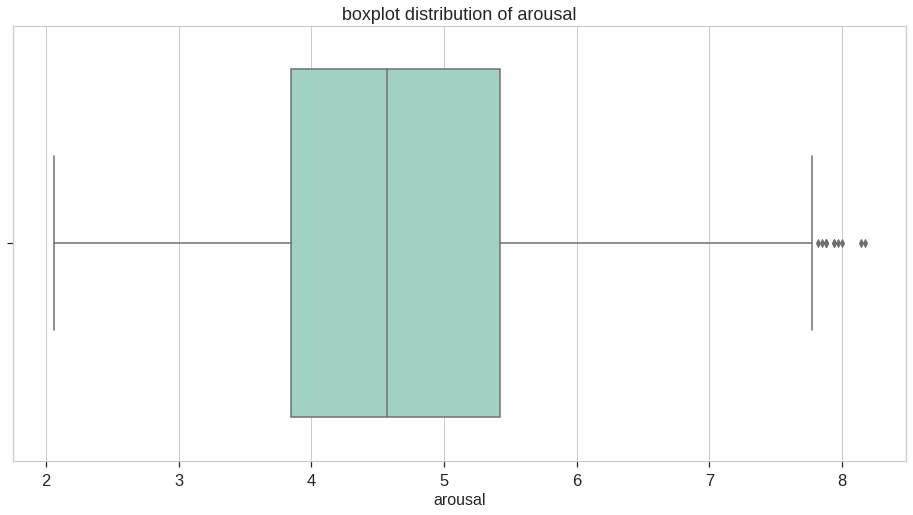

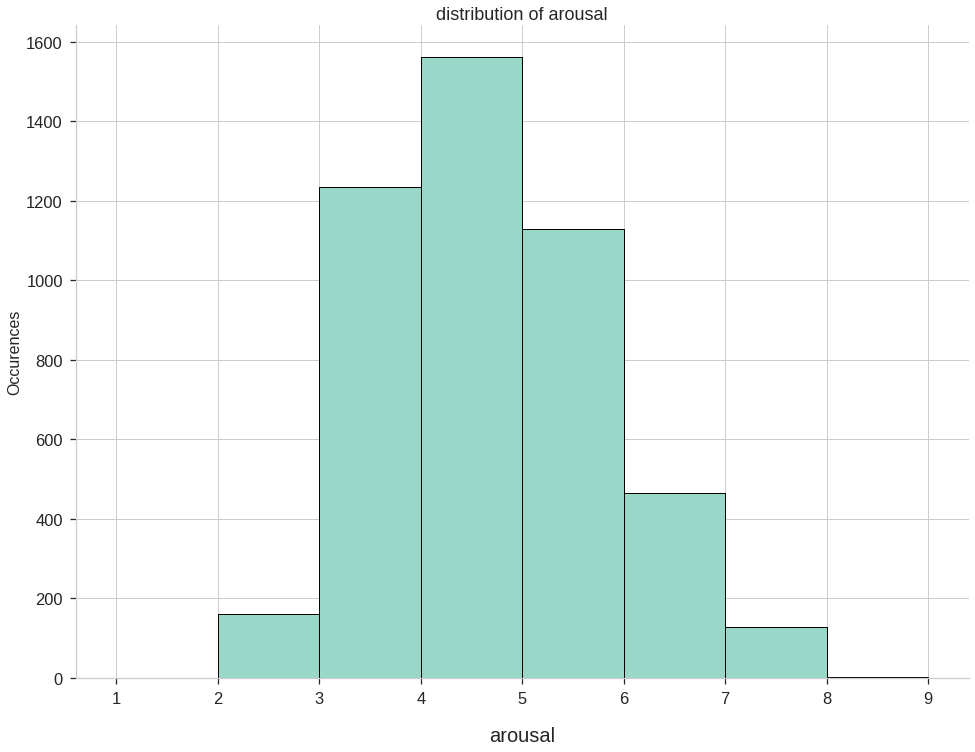

\begin{tabular}{lr}
\toprule
{} &      arousal \\
\midrule
count &  4682.000000 \\
mean  &     4.678129 \\
std   &     1.097163 \\
min   &     2.057000 \\
25\%   &     3.849000 \\
50\%   &     4.571000 \\
75\%   &     5.419000 \\
max   &     8.177000 \\
\bottomrule
\end{tabular}



In [ ]:
#NOME VARIABILE DI INTERESSE
refvar="arousal"



#calcolo frequenza assoluta per aoa
df[refvar].value_counts()

#BOXPLOT

plt.rcParams["figure.figsize"] = [16, 8]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa_boxplot = sb.boxplot( x = refvar, data=df, color = colors1[1])

#bellurie
boxplot_str="boxplot"
str1="distribution of"+" "+refvar
str2=boxplot_str+" "+str1
plt.title(str2, size = 18)
aoa_boxplot.set_xlabel(refvar, rotation = "horizontal", size = 16)



#DISTRIBUTION
plt.rcParams["figure.figsize"] = [16, 12]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa1= df[refvar].dropna(0, inplace = False)

data = aoa1
fig, ax = plt.subplots()
counts, bins, patches = ax.hist(data,color = colors1[1], bins=range(1,10),edgecolor='black')

# Set the ticks to be at the edges of the bins.
ax.set_xticks(bins)

# Label the raw counts and the percentages below the x-axis...
#bellurie
plt.title(str1, size = 18)
plt.xlabel(xlabel = refvar, fontsize = 20, labelpad=20)
plt.ylabel(ylabel = "Occurences", fontsize = 16)
sb.despine(right = True)
plt.show()

aoa_descr=df[refvar].describe()

print(aoa_descr.to_latex())

Other comments



#### Valence

Brief description of the variables

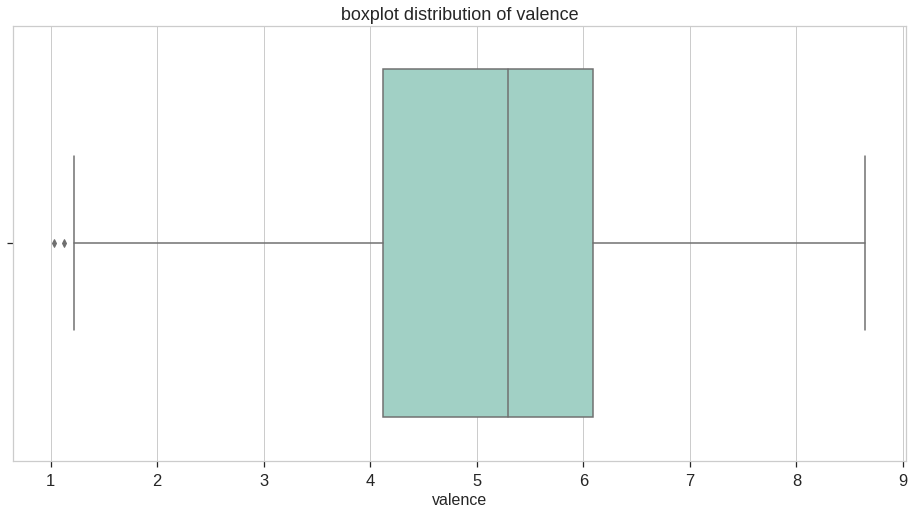

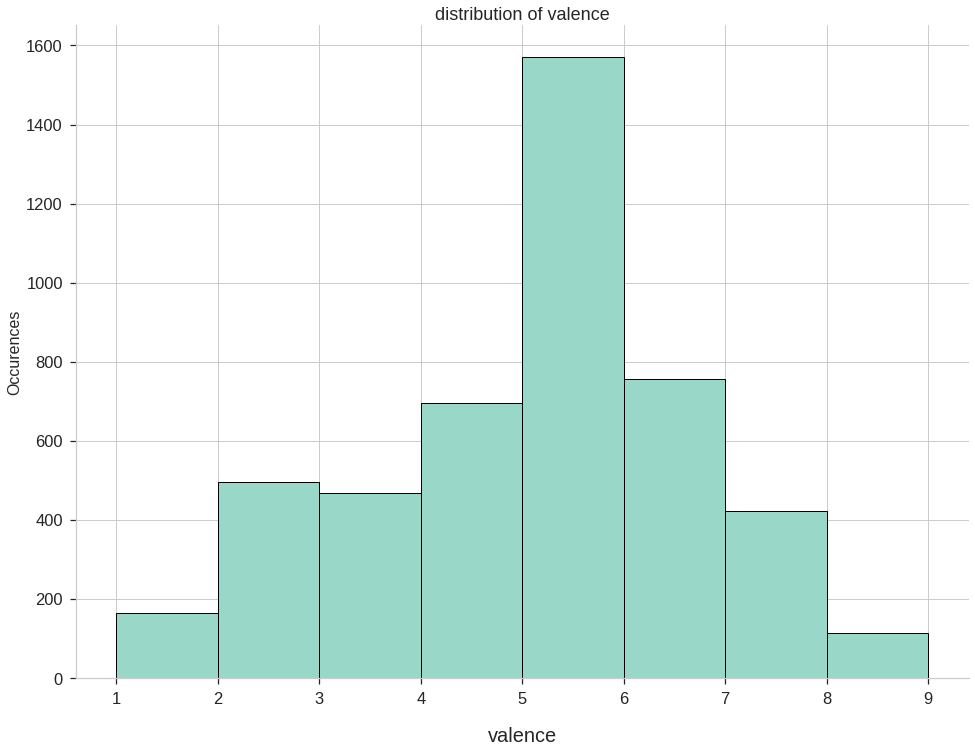

\begin{tabular}{lr}
\toprule
{} &      valence \\
\midrule
count &  4682.000000 \\
mean  &     5.086797 \\
std   &     1.594344 \\
min   &     1.030000 \\
25\%   &     4.115000 \\
50\%   &     5.290000 \\
75\%   &     6.088000 \\
max   &     8.647000 \\
\bottomrule
\end{tabular}



In [ ]:
#NOME VARIABILE DI INTERESSE
refvar="valence"



#calcolo frequenza assoluta per aoa
df[refvar].value_counts()

#BOXPLOT

plt.rcParams["figure.figsize"] = [16, 8]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa_boxplot = sb.boxplot( x = refvar, data=df, color = colors1[1])

#bellurie
boxplot_str="boxplot"
str1="distribution of"+" "+refvar
str2=boxplot_str+" "+str1
plt.title(str2, size = 18)
aoa_boxplot.set_xlabel(refvar, rotation = "horizontal", size = 16)



#DISTRIBUTION
plt.rcParams["figure.figsize"] = [16, 12]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa1= df[refvar].dropna(0, inplace = False)

data = aoa1
fig, ax = plt.subplots()
counts, bins, patches = ax.hist(data,color = colors1[1], bins=range(1,10),edgecolor='black')

# Set the ticks to be at the edges of the bins.
ax.set_xticks(bins)

# Label the raw counts and the percentages below the x-axis...
#bellurie
plt.title(str1, size = 18)
plt.xlabel(xlabel = refvar, fontsize = 20, labelpad=20)
plt.ylabel(ylabel = "Occurences", fontsize = 16)
sb.despine(right = True)
plt.show()

aoa_descr=df[refvar].describe()

print(aoa_descr.to_latex())

Other comments



#### Dominance

Brief description of the variables

In [ ]:
refvar="dominance"

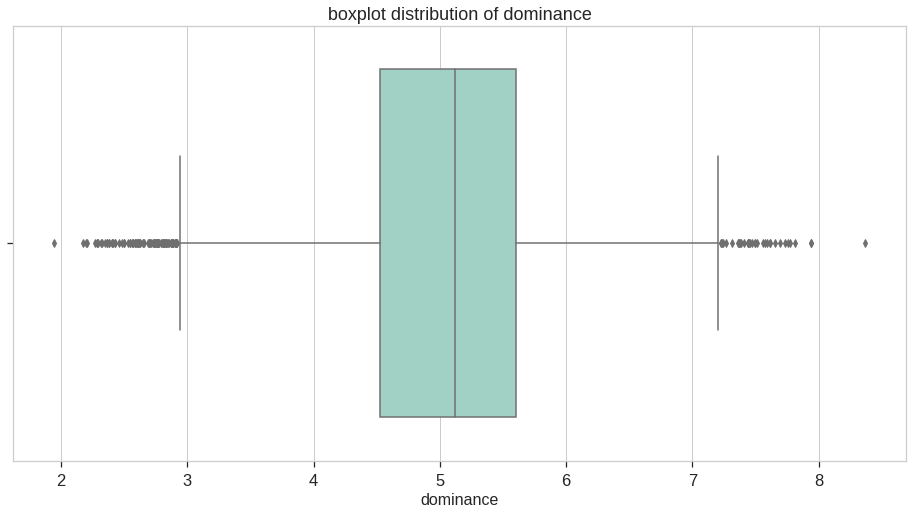

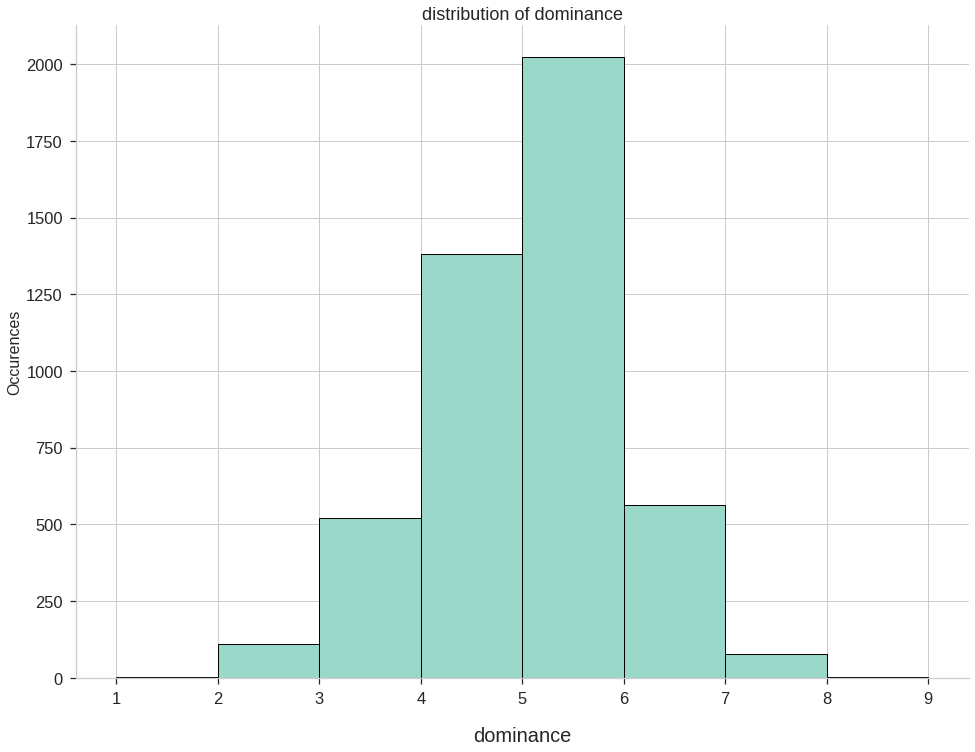

\begin{tabular}{lr}
\toprule
{} &    dominance \\
\midrule
count &  4682.000000 \\
mean  &     5.044939 \\
std   &     0.930669 \\
min   &     1.941000 \\
25\%   &     4.529000 \\
50\%   &     5.123000 \\
75\%   &     5.600000 \\
max   &     8.371000 \\
\bottomrule
\end{tabular}



In [ ]:
#calcolo frequenza assoluta per aoa
df[refvar].value_counts()

#BOXPLOT

plt.rcParams["figure.figsize"] = [16, 8]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa_boxplot = sb.boxplot( x = refvar, data=df, color = colors1[1])

#bellurie
boxplot_str="boxplot"
str1="distribution of"+" "+refvar
str2=boxplot_str+" "+str1
plt.title(str2, size = 18)
aoa_boxplot.set_xlabel(refvar, rotation = "horizontal", size = 16)



#DISTRIBUTION
plt.rcParams["figure.figsize"] = [16, 12]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa1= df[refvar].dropna(0, inplace = False)

data = aoa1
fig, ax = plt.subplots()
counts, bins, patches = ax.hist(data,color = colors1[1], bins=range(1,10),edgecolor='black')

# Set the ticks to be at the edges of the bins.
ax.set_xticks(bins)

# Label the raw counts and the percentages below the x-axis...
#bellurie
plt.title(str1, size = 18)
plt.xlabel(xlabel = refvar, fontsize = 20, labelpad=20)
plt.ylabel(ylabel = "Occurences", fontsize = 16)
sb.despine(right = True)
plt.show()

aoa_descr=df[refvar].describe()

print(aoa_descr.to_latex())

Other comments



#### Concreteness

(numerical): represents the degree to which something can be experienced by our senses. It ranges from 1, abstract words, to 7, concrete words. 

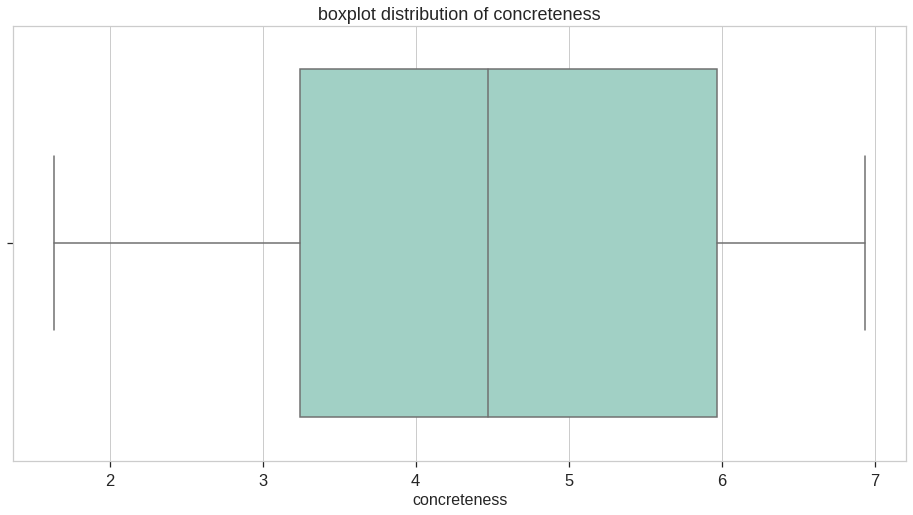

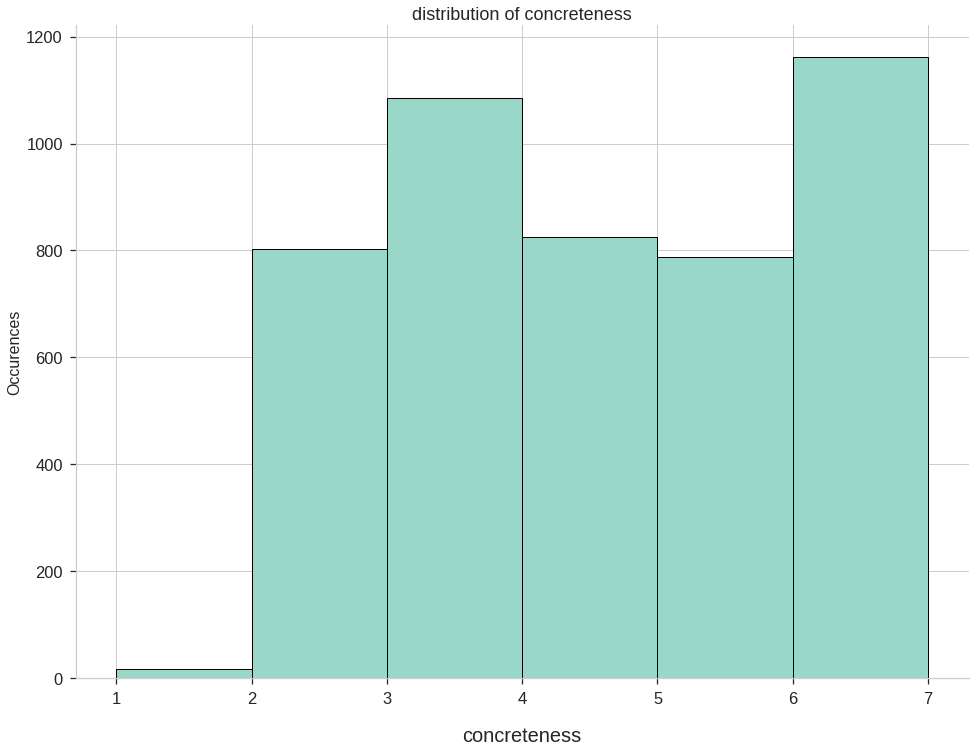

\begin{tabular}{lr}
\toprule
{} &  concreteness \\
\midrule
count &   4682.000000 \\
mean  &      4.566273 \\
std   &      1.433689 \\
min   &      1.636000 \\
25\%   &      3.242000 \\
50\%   &      4.471000 \\
75\%   &      5.971000 \\
max   &      6.938000 \\
\bottomrule
\end{tabular}



In [ ]:
#NOME VARIABILE DI INTERESSE
refvar="concreteness"



#calcolo frequenza assoluta per aoa
df[refvar].value_counts()

#BOXPLOT

plt.rcParams["figure.figsize"] = [16, 8]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa_boxplot = sb.boxplot( x = refvar, data=df, color = colors1[1])

#bellurie
boxplot_str="boxplot"
str1="distribution of"+" "+refvar
str2=boxplot_str+" "+str1
plt.title(str2, size = 18)
aoa_boxplot.set_xlabel(refvar, rotation = "horizontal", size = 16)



#DISTRIBUTION
plt.rcParams["figure.figsize"] = [16, 12]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa1= df[refvar].dropna(0, inplace = False)

data = aoa1
fig, ax = plt.subplots()
counts, bins, patches = ax.hist(data,color = colors1[1], bins=range(1,8),edgecolor='black')

# Set the ticks to be at the edges of the bins.
ax.set_xticks(bins)

# Label the raw counts and the percentages below the x-axis...
#bellurie
plt.title(str1, size = 18)
plt.xlabel(xlabel = refvar, fontsize = 20, labelpad=20)
plt.ylabel(ylabel = "Occurences", fontsize = 16)
sb.despine(right = True)
plt.show()

aoa_descr=df[refvar].describe()

print(aoa_descr.to_latex())

Other comments



#### Imageability

(numerical): measures how difficult is to generate a mental image of something. It ranges from 1, hard to imagine, to 7, easy to imagine. 

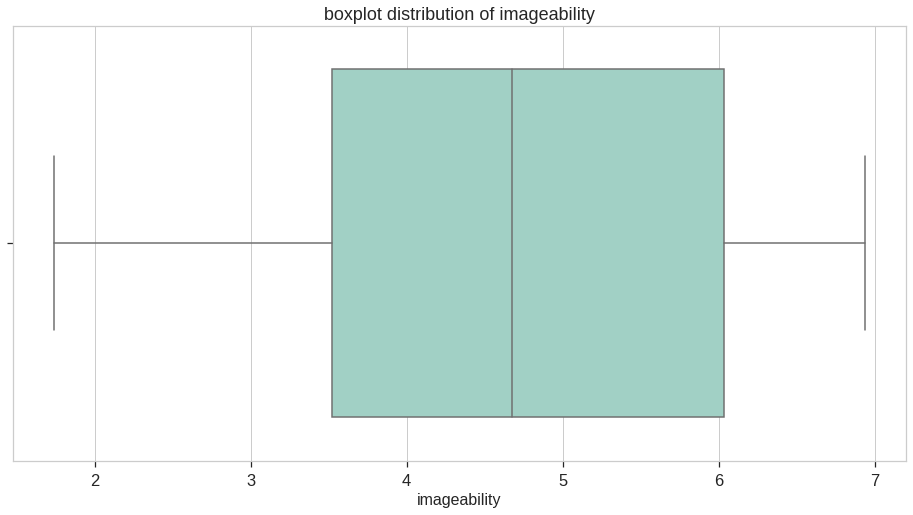

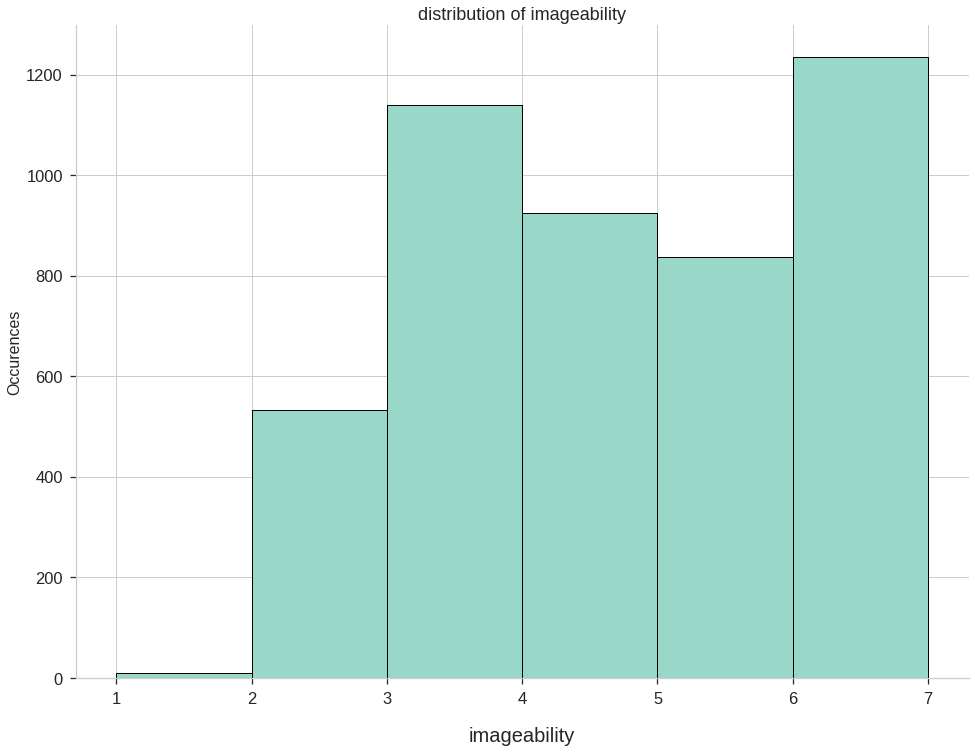

\begin{tabular}{lr}
\toprule
{} &  imageability \\
\midrule
count &   4682.000000 \\
mean  &      4.723018 \\
std   &      1.363110 \\
min   &      1.737000 \\
25\%   &      3.519250 \\
50\%   &      4.677000 \\
75\%   &      6.032000 \\
max   &      6.941000 \\
\bottomrule
\end{tabular}



In [ ]:
#NOME VARIABILE DI INTERESSE
refvar="imageability"



#calcolo frequenza assoluta per aoa
df[refvar].value_counts()

#BOXPLOT

plt.rcParams["figure.figsize"] = [16, 8]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa_boxplot = sb.boxplot( x = refvar, data=df, color = colors1[1])

#bellurie
boxplot_str="boxplot"
str1="distribution of"+" "+refvar
str2=boxplot_str+" "+str1
plt.title(str2, size = 18)
aoa_boxplot.set_xlabel(refvar, rotation = "horizontal", size = 16)



#DISTRIBUTION
plt.rcParams["figure.figsize"] = [16, 12]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa1= df[refvar].dropna(0, inplace = False)

data = aoa1
fig, ax = plt.subplots()
counts, bins, patches = ax.hist(data,color = colors1[1], bins=range(1,8),edgecolor='black')

# Set the ticks to be at the edges of the bins.
ax.set_xticks(bins)

# Label the raw counts and the percentages below the x-axis...
#bellurie
plt.title(str1, size = 18)
plt.xlabel(xlabel = refvar, fontsize = 20, labelpad=20)
plt.ylabel(ylabel = "Occurences", fontsize = 16)
sb.despine(right = True)
plt.show()

aoa_descr=df[refvar].describe()

print(aoa_descr.to_latex())

Other comments



#### Familiarity

(numerical): is a measure of a word’s subjective experience. The range is from 1 (unfamiliar) to 7 (familiar). 


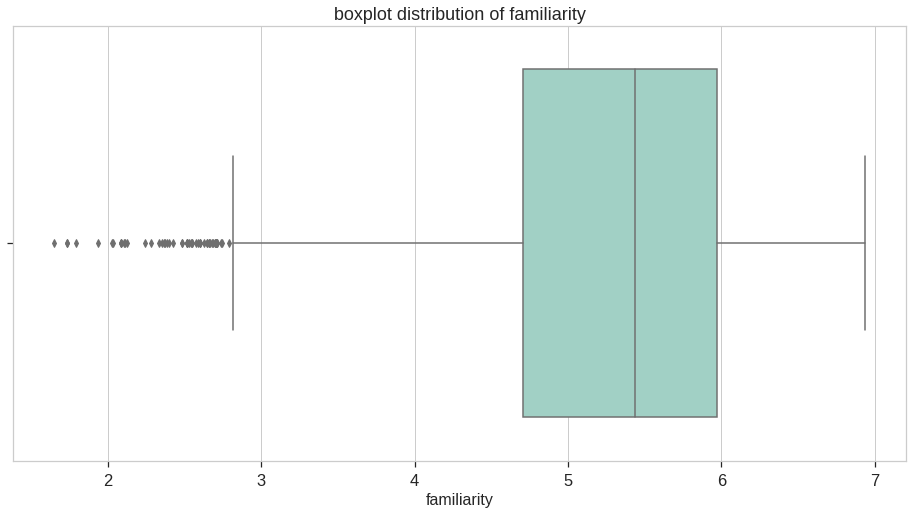

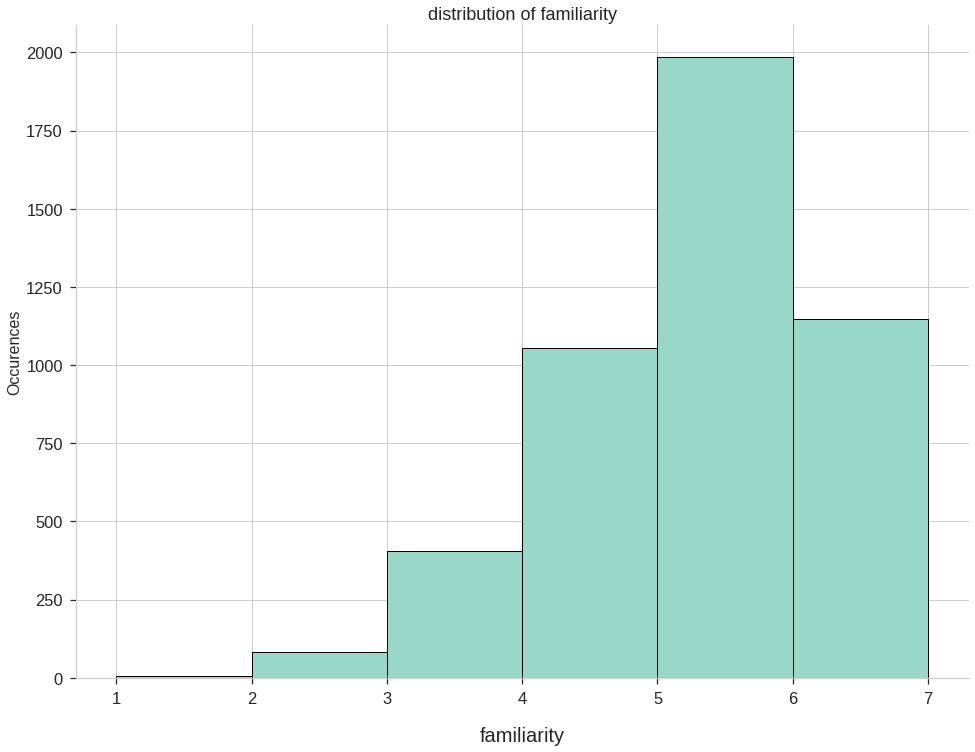

\begin{tabular}{lr}
\toprule
{} &  familiarity \\
\midrule
count &  4682.000000 \\
mean  &     5.271335 \\
std   &     0.921218 \\
min   &     1.647000 \\
25\%   &     4.706000 \\
50\%   &     5.438000 \\
75\%   &     5.969000 \\
max   &     6.939000 \\
\bottomrule
\end{tabular}



In [ ]:
#NOME VARIABILE DI INTERESSE
refvar="familiarity"



#calcolo frequenza assoluta per aoa
df[refvar].value_counts()

#BOXPLOT

plt.rcParams["figure.figsize"] = [16, 8]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa_boxplot = sb.boxplot( x = refvar, data=df, color = colors1[1])

#bellurie
boxplot_str="boxplot"
str1="distribution of"+" "+refvar
str2=boxplot_str+" "+str1
plt.title(str2, size = 18)
aoa_boxplot.set_xlabel(refvar, rotation = "horizontal", size = 16)



#DISTRIBUTION
plt.rcParams["figure.figsize"] = [16, 12]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa1= df[refvar].dropna(0, inplace = False)

data = aoa1
fig, ax = plt.subplots()
counts, bins, patches = ax.hist(data,color = colors1[1], bins=range(1,8),edgecolor='black')

# Set the ticks to be at the edges of the bins.
ax.set_xticks(bins)

# Label the raw counts and the percentages below the x-axis...
#bellurie
plt.title(str1, size = 18)
plt.xlabel(xlabel = refvar, fontsize = 20, labelpad=20)
plt.ylabel(ylabel = "Occurences", fontsize = 16)
sb.despine(right = True)
plt.show()

aoa_descr=df[refvar].describe()

print(aoa_descr.to_latex())

Other comments

#### Age of Aquisition

The variable age of aquisition (aoa) indicates the supposed age in which that person first learned that specific word. Clearly it is not easy to remember at which age a word is learned, and for that reason in this dataset this variables refears to an estimation of the age of aquisition. The scale is defined as a series of consecutive 2-year periods from the ages of 2 and 12 years, and a final period referring to 13 years and older. This shows how we have 7 different ranges, 0-2, 2-4, 4-6, 6-8, 8-10-, 10-12 and 13+.

In [ ]:
#calcolo frequenza assoluta per aoa
df["aoa"].value_counts()

5.000    45
4.000    29
3.029    24
4.657    23
5.029    22
         ..
5.278     1
6.036     1
6.633     1
5.839     1
1.871     1
Name: aoa, Length: 953, dtype: int64

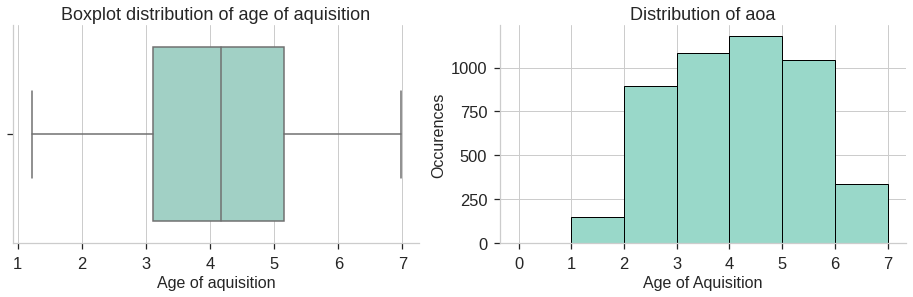

In [ ]:
#imposto lo spazio
colors1 = ['#e5f5f9','#99d8c9','#2ca25f']
plt.rcParams["figure.figsize"] = [16, 4]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})
plt.subplot(1, 2, 1)
#distribuzione e tendenze centrali: boxplot
aoa_boxplot = sb.boxplot( x = "aoa", data=df, color = colors1[1])
plt.title("Boxplot distribution of age of aquisition", size = 18)
aoa_boxplot.set_xlabel("Age of aquisition", rotation = "horizontal", size = 16)
plt.subplot(1, 2, 2)

aoa1= df["aoa"].dropna(0, inplace = False)

#imposto la legenda (da rivedere)
#lables_aoa= [0-2, 2-4, 4-6, 6-8, 8-10, 10-12, 13]
#plt.legend(title="Age of aquisition ranges", title_fontsize = 14, bbox_to_anchor=(1, 1), labels=lables_aoa )

#distribuzione e tendenze centrali: istogramma
aoa_hist = plt.hist(aoa1,  color = colors1[1],edgecolor='black',bins=range(0,8))

plt.title("Distribution of aoa", size = 18)
plt.xlabel(xlabel = "Age of Aquisition", fontsize = 16)
plt.ylabel(ylabel = "Occurences", fontsize = 16)
sb.despine(right = True)

plt.show()

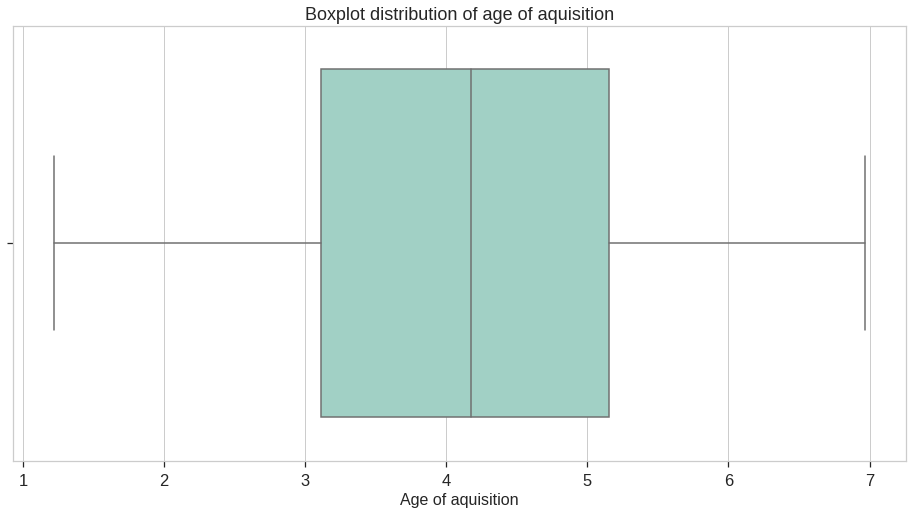

In [ ]:
colors1 = ['#e5f5f9','#99d8c9','#2ca25f']
plt.rcParams["figure.figsize"] = [16, 8]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa_boxplot = sb.boxplot( x = "aoa", data=df, color = colors1[1])
plt.title("Boxplot distribution of age of aquisition", size = 18)
aoa_boxplot.set_xlabel("Age of aquisition", rotation = "horizontal", size = 16)

plt.show()

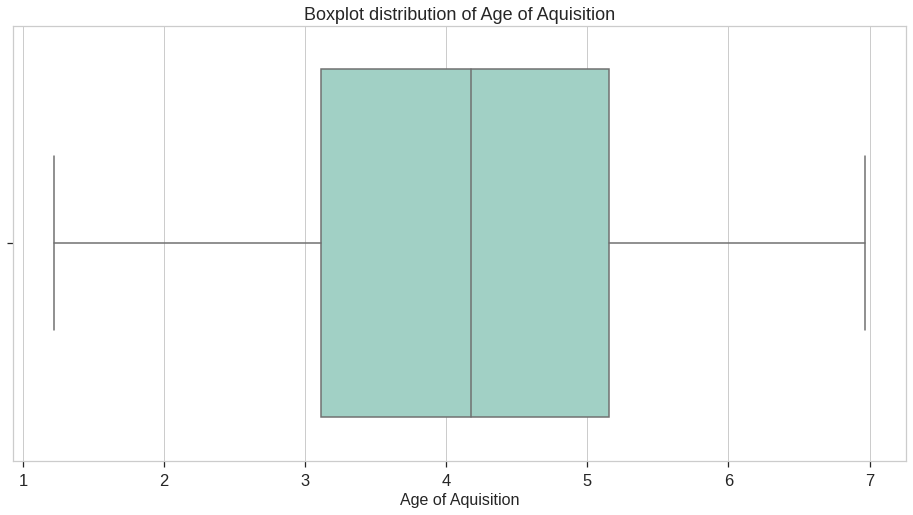

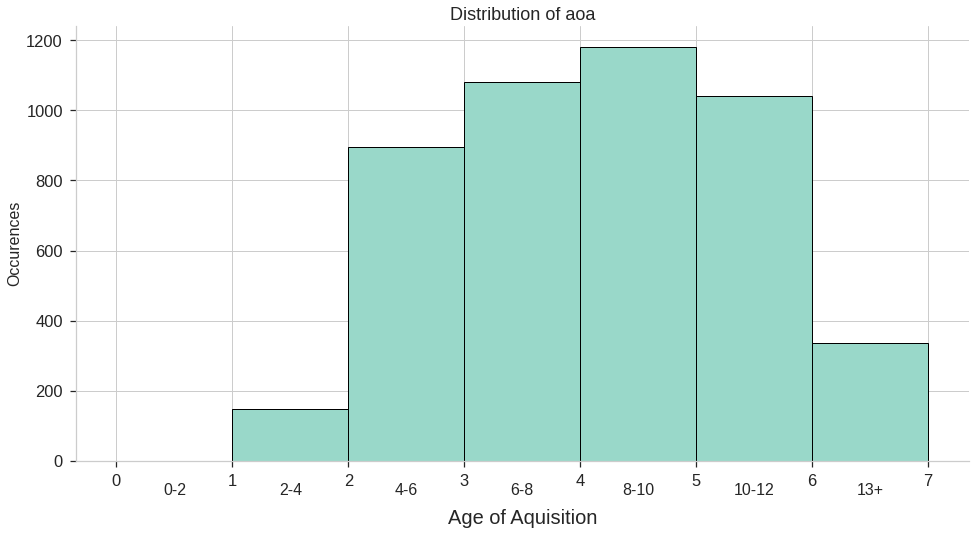

\begin{tabular}{lr}
\toprule
{} &          aoa \\
\midrule
count &  4682.000000 \\
mean  &     4.143427 \\
std   &     1.252770 \\
min   &     1.219000 \\
25\%   &     3.114000 \\
50\%   &     4.177000 \\
75\%   &     5.152000 \\
max   &     6.971000 \\
\bottomrule
\end{tabular}



In [ ]:
colors1 = ['#e5f5f9','#99d8c9','#2ca25f']


#BOXPLOT

plt.rcParams["figure.figsize"] = [16, 8]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa_boxplot = sb.boxplot( x = "aoa", data=df, color = colors1[1])
plt.title("Boxplot distribution of Age of Aquisition", size = 18)
bin_centers = 0.5 * np.diff(bins) + bins[:-1]
for i, x in zip(range(0,7), bin_centers):
    # Label the raw counts
    age_range=['0-2','2-4','4-6','6-8','8-10','10-12','13+']
    ax.annotate(age_range[i], xy=(x, 0), xycoords=('data', 'axes fraction'),
        xytext=(0, -22), textcoords='offset points',fontsize=16, va='top', ha='center')


aoa_boxplot.set_xlabel("Age of Aquisition", rotation = "horizontal", size = 16)



#DISTRIBUTION
plt.rcParams["figure.figsize"] = [16, 8]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa1= df["aoa"].dropna(0, inplace = False)

data = aoa1
fig, ax = plt.subplots()
counts, bins, patches = ax.hist(data,color = colors1[1], bins=range(0,8),edgecolor='black')

# Set the ticks to be at the edges of the bins.
ax.set_xticks(bins)

# Label the raw counts and the percentages below the x-axis...
bin_centers = 0.5 * np.diff(bins) + bins[:-1]
for i, x in zip(range(0,7), bin_centers):
    # Label the raw counts
    age_range=['0-2','2-4','4-6','6-8','8-10','10-12','13+']
    ax.annotate(age_range[i], xy=(x, 0), xycoords=('data', 'axes fraction'),
        xytext=(0, -22), textcoords='offset points',fontsize=16, va='top', ha='center')

    # Label the percentages
    #percent = '%0.0f%%' % (100 * float(count) / counts.sum())
    #ax.annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
        #xytext=(0, -32), textcoords='offset points', va='top', ha='center')


# Give ourselves some more room at the bottom of the plot
#plt.subplots_adjust(bottom=0.50)
plt.title("Distribution of aoa", size = 18)
plt.xlabel(xlabel = "Age of Aquisition", fontsize = 20, labelpad=20)
plt.ylabel(ylabel = "Occurences", fontsize = 16)
sb.despine(right = True)
plt.show()

aoa_descr=df["aoa"].describe()

print(aoa_descr.to_latex())

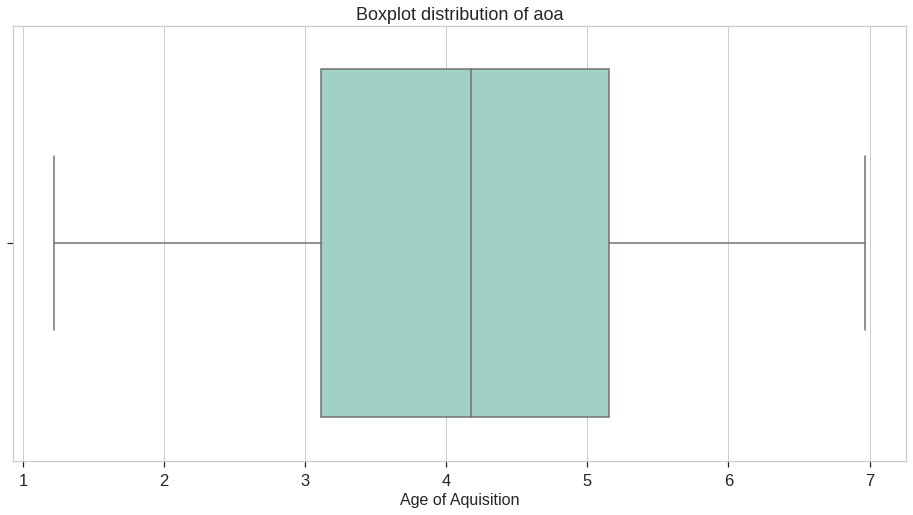

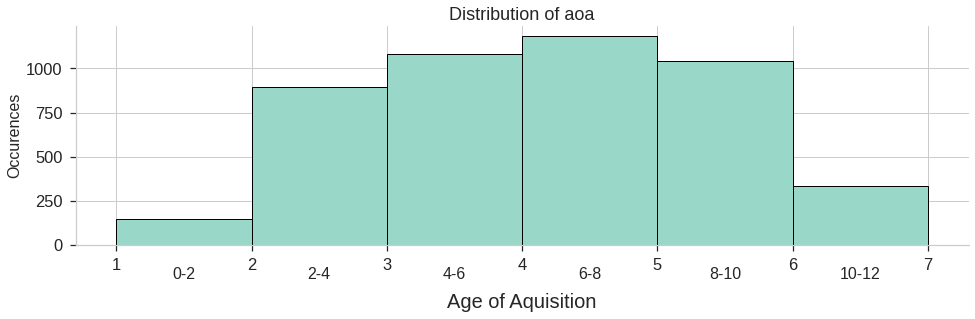

\begin{tabular}{lr}
\toprule
{} &          aoa \\
\midrule
count &  4682.000000 \\
mean  &     4.143427 \\
std   &     1.252770 \\
min   &     1.219000 \\
25\%   &     3.114000 \\
50\%   &     4.177000 \\
75\%   &     5.152000 \\
max   &     6.971000 \\
\bottomrule
\end{tabular}



In [ ]:
colors1 = ['#e5f5f9','#99d8c9','#2ca25f']

refvar="aoa"

#BOXPLOT

plt.rcParams["figure.figsize"] = [16, 8]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa_boxplot = sb.boxplot( x = refvar, data=df, color = colors1[1])

#bellurie

plt.title("Boxplot distribution of aoa", size = 18)
aoa_boxplot.set_xlabel("Age of Aquisition", rotation = "horizontal", size = 16)



#DISTRIBUTION
plt.rcParams["figure.figsize"] = [16, 8]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa1= df[refvar].dropna(0, inplace = False)

data = aoa1
fig, ax = plt.subplots()
counts, bins, patches = ax.hist(data,color = colors1[1], bins=range(1,8),edgecolor='black')

# Set the ticks to be at the edges of the bins.
ax.set_xticks(bins)

# Label the raw counts and the percentages below the x-axis...
bin_centers = 0.5 * np.diff(bins) + bins[:-1]
for i, x in zip(range(0,7), bin_centers):
    # Label the raw counts
    age_range=['0-2','2-4','4-6','6-8','8-10','10-12','13+']
    ax.annotate(age_range[i], xy=(x, 0), xycoords=('data', 'axes fraction'),
        xytext=(0, -22), textcoords='offset points',fontsize=16, va='top', ha='center')

    # Label the percentages
    #percent = '%0.0f%%' % (100 * float(count) / counts.sum())
    #ax.annotate(percent, xy=(x, 0), xycoords=('data', 'axes fraction'),
        #xytext=(0, -32), textcoords='offset points', va='top', ha='center')


# Give ourselves some more room at the bottom of the plot
plt.subplots_adjust(bottom=0.50)

# Label the raw counts and the percentages below the x-axis...
#bellurie
plt.title("Distribution of aoa", size = 18)
plt.xlabel(xlabel = "Age of Aquisition", fontsize = 20, labelpad=20)
plt.ylabel(ylabel = "Occurences", fontsize = 16)
sb.despine(right = True)
plt.show()

aoa_descr=df[refvar].describe()

print(aoa_descr.to_latex())

In [ ]:
aoa_descr=df["aoa"].describe()

print(aoa_descr.to_latex())

\begin{tabular}{lr}
\toprule
{} &          aoa \\
\midrule
count &  4682.000000 \\
mean  &     4.143427 \\
std   &     1.252770 \\
min   &     1.219000 \\
25\%   &     3.114000 \\
50\%   &     4.177000 \\
75\%   &     5.152000 \\
max   &     6.971000 \\
\bottomrule
\end{tabular}



There are 4682 occurrences for this variable. That means that there are no missing values, or NaN. The mean is 4.14, and the standard deviation is 1.25.

#### Size

In this dataset "size" is a measure of magnitude expressed in either concrete or abstarct terms (big, small). That is, if a word can be associated with adjectives like big or small (e.g. palace or mountain for concrete object, and knowledge or love for abstarct ideas).

In [ ]:
#calcolo frequenza assoluta per aoa
df["semsize"].value_counts()

4.000    52
5.000    42
3.000    35
4.971    27
4.677    26
         ..
5.241     1
5.891     1
4.160     1
6.281     1
5.867     1
Name: semsize, Length: 939, dtype: int64

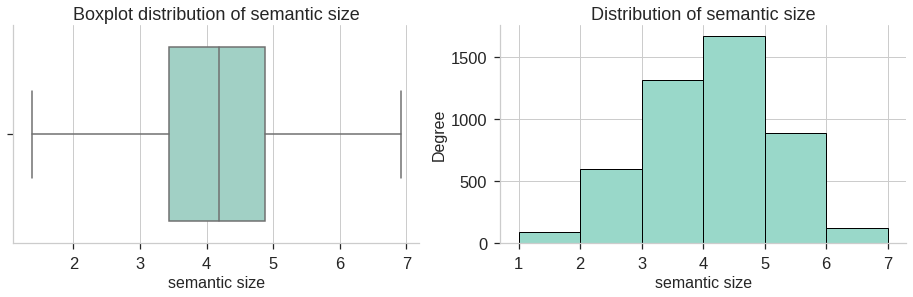

In [ ]:
#imposto lo spazio
colors1 = ['#e5f5f9','#99d8c9','#2ca25f']
plt.rcParams["figure.figsize"] = [16, 4]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})
plt.subplot(1, 2, 1)
#distribuzione e tendenze centrali: boxplot
aoa_boxplot = sb.boxplot( x = "semsize", data=df, color = colors1[1])
plt.title("Boxplot distribution of semantic size", size = 18)
aoa_boxplot.set_xlabel("semantic size", rotation = "horizontal", size = 16)
plt.subplot(1, 2, 2)

size1= df["semsize"].dropna(0, inplace = False)

#imposto la legenda (da rivedere)
#lables_size= [0-2, 2-4, 4-6, 6-8, 8-10, 10-12, 13]
#plt.legend(title="Age of aquisition ranges", title_fontsize = 14, bbox_to_anchor=(1, 1), labels=lables_size )
#distribuzione e tendenze centrali: istogramma
aoa_hist = plt.hist(size1,  color = colors1[1],edgecolor='black',bins=range(1,8))

#BELLURIE

plt.title("Distribution of semantic size", size = 18)
plt.xlabel(xlabel = "semantic size", fontsize = 16)
plt.ylabel(ylabel = "Degree", fontsize = 16)
sb.despine(right = True)

plt.show()

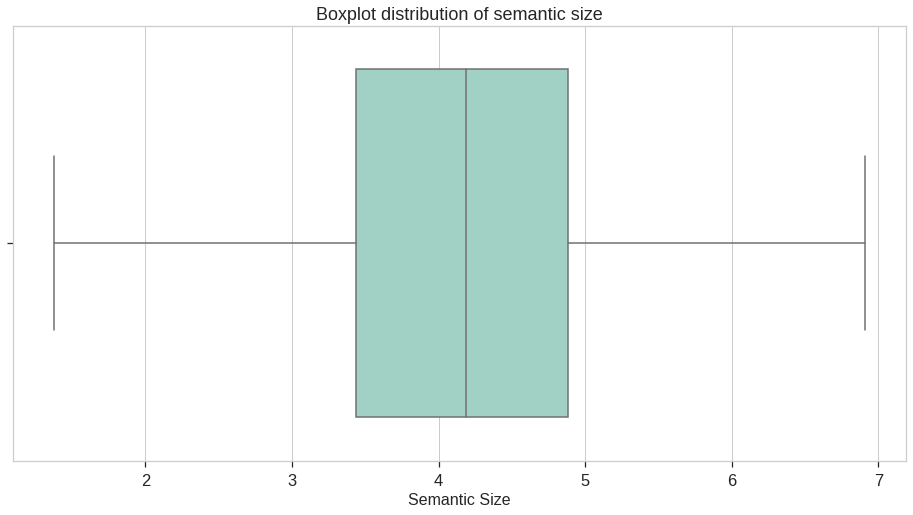

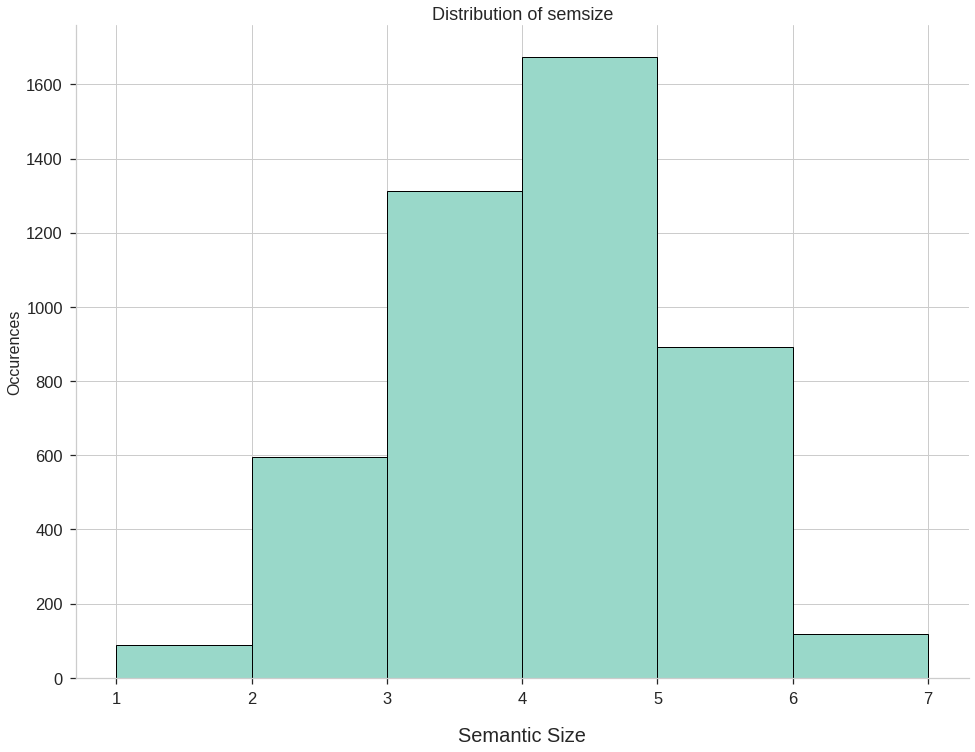

\begin{tabular}{lr}
\toprule
{} &      semsize \\
\midrule
count &  4682.000000 \\
mean  &     4.136403 \\
std   &     1.023293 \\
min   &     1.375000 \\
25\%   &     3.438000 \\
50\%   &     4.186500 \\
75\%   &     4.882000 \\
max   &     6.912000 \\
\bottomrule
\end{tabular}



In [ ]:
colors1 = ['#e5f5f9','#99d8c9','#2ca25f']

refvar="semsize"

#BOXPLOT

plt.rcParams["figure.figsize"] = [16, 8]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa_boxplot = sb.boxplot( x = refvar, data=df, color = colors1[1])

#bellurie

plt.title("Boxplot distribution of semantic size", size = 18)
aoa_boxplot.set_xlabel("Semantic Size", rotation = "horizontal", size = 16)



#DISTRIBUTION
plt.rcParams["figure.figsize"] = [16, 12]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa1= df[refvar].dropna(0, inplace = False)

data = aoa1
fig, ax = plt.subplots()
counts, bins, patches = ax.hist(data,color = colors1[1], bins=range(1,8),edgecolor='black')

# Set the ticks to be at the edges of the bins.
ax.set_xticks(bins)

# Label the raw counts and the percentages below the x-axis...
#bellurie
plt.title("Distribution of semsize", size = 18)
plt.xlabel(xlabel = "Semantic Size", fontsize = 20, labelpad=20)
plt.ylabel(ylabel = "Occurences", fontsize = 16)
sb.despine(right = True)
plt.show()

aoa_descr=df[refvar].describe()

print(aoa_descr.to_latex())

In [ ]:
df["semsize"].describe()

count    4682.000000
mean        4.136403
std         1.023293
min         1.375000
25%         3.438000
50%         4.186500
75%         4.882000
max         6.912000
Name: semsize, dtype: float64

The count of occurrences for this variable suggests that there are no missing values. The mean is 4.13 and the standard deviation is just above 1. This results suggests that the tendency is that is more common to think that a word has a bigger semantic size.

#### Gender

Gender in this dataset refers to how strongly its meaning is associated with male or female behaviour or idea. This variable could be very interesting in regards of the social bias that might, or might not, be present.

In [ ]:
#calcolo frequenza assoluta per aoa
df["gender"].value_counts()

4.000    86
5.000    39
3.971    32
4.500    29
4.029    28
         ..
3.129     1
4.861     1
1.743     1
4.080     1
6.588     1
Name: gender, Length: 1022, dtype: int64

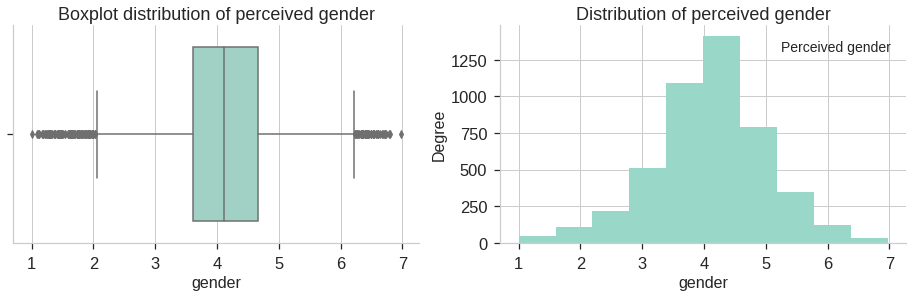

In [ ]:
#imposto lo spazio
colors1 = ['#e5f5f9','#99d8c9','#2ca25f']
plt.rcParams["figure.figsize"] = [16, 4]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})
plt.subplot(1, 2, 1)
#distribuzione e tendenze centrali: boxplot
gender_boxplot = sb.boxplot( x = "gender", data=df, color = colors1[1])
plt.title("Boxplot distribution of perceived gender", size = 18)
gender_boxplot.set_xlabel("gender", rotation = "horizontal", size = 16)
plt.subplot(1, 2, 2)

gender1= df["gender"].dropna(0, inplace = False)

#imposto la legenda
lables_size= [0-2, 2-4, 4-6, 6-8, 8-10, 10-12, 13]
plt.legend(title="Perceived gender", title_fontsize = 14, bbox_to_anchor=(1, 1), labels=lables_size )
#distribuzione e tendenze centrali: istogramma
aoa_hist = plt.hist(gender1,  color = colors1[1])
plt.title("Distribution of perceived gender", size = 18)
plt.xlabel(xlabel = "gender", fontsize = 16)
plt.ylabel(ylabel = "Degree", fontsize = 16)
sb.despine(right = True)

plt.show()

In [ ]:
df["gender"].describe()

count    4682.000000
mean        4.099933
std         0.912293
min         1.000000
25%         3.606000
50%         4.121000
75%         4.656000
max         6.971000
Name: gender, dtype: float64

In [ ]:
df["length"].describe()

count    4682.000000
mean        6.348355
std         2.006230
min         2.000000
25%         5.000000
50%         6.000000
75%         8.000000
max        16.000000
Name: length, dtype: float64

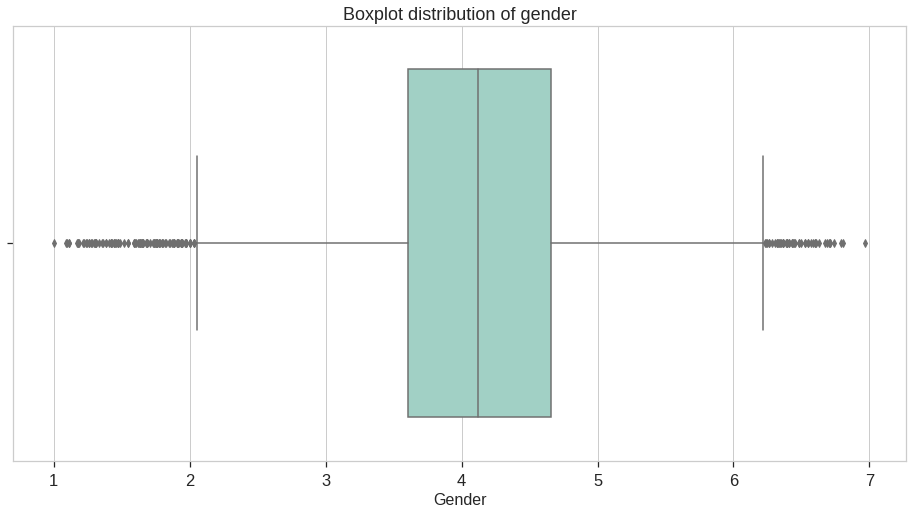

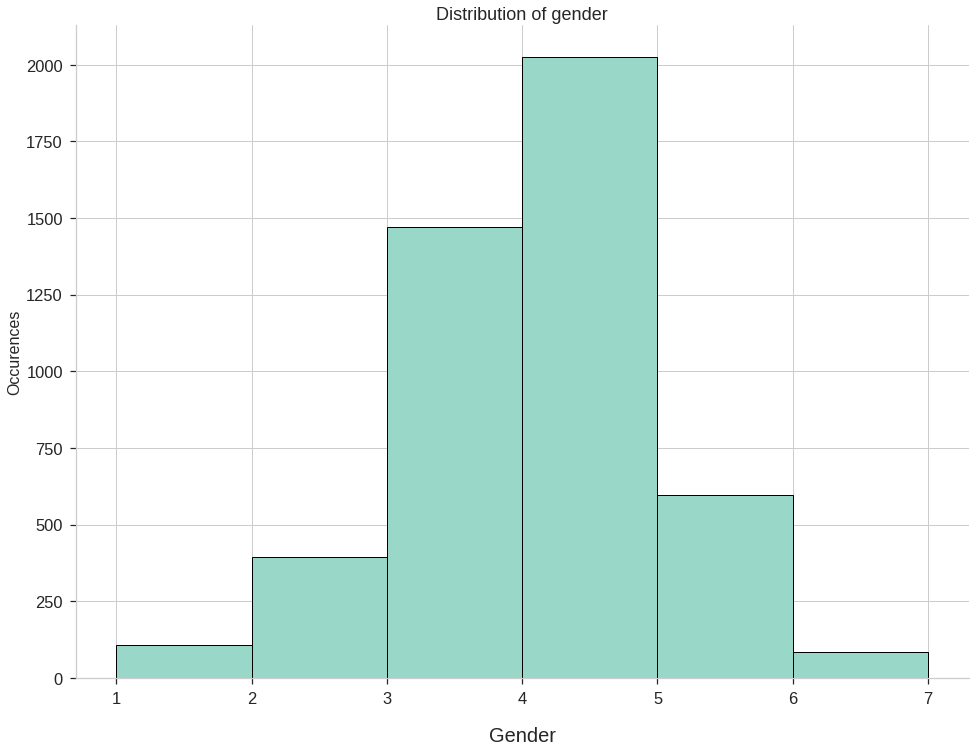

\begin{tabular}{lr}
\toprule
{} &       gender \\
\midrule
count &  4682.000000 \\
mean  &     4.099933 \\
std   &     0.912293 \\
min   &     1.000000 \\
25\%   &     3.606000 \\
50\%   &     4.121000 \\
75\%   &     4.656000 \\
max   &     6.971000 \\
\bottomrule
\end{tabular}



In [ ]:
import matplotlib.ticker as mticker
colors1 = ['#e5f5f9','#99d8c9','#2ca25f']

refvar="gender"

#BOXPLOT

plt.rcParams["figure.figsize"] = [16, 8]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa_boxplot = sb.boxplot( x = refvar, data=df, color = colors1[1])

#bellurie

plt.title("Boxplot distribution of gender", size = 18)
aoa_boxplot.set_xlabel("Gender", rotation = "horizontal", size = 16)



#DISTRIBUTION
plt.rcParams["figure.figsize"] = [16, 12]
sb.set_context("notebook", font_scale=1.5, rc={"font.size":14,"axes.titlesize": 16,"axes.labelsize": 12})

aoa1= df[refvar].dropna(0, inplace = False)

data = aoa1
fig, ax = plt.subplots()
counts, bins, patches = ax.hist(data,color = colors1[1], bins=range(1,8),edgecolor='black')

# Set the ticks to be at the edges of the bins.
ax.set_xticks(bins)

# Label the raw counts and the percentages below the x-axis...
#bellurie
plt.title("Distribution of gender", size = 18)
plt.xlabel(xlabel = "Gender", fontsize = 20, labelpad=20)


plt.ylabel(ylabel = "Occurences", fontsize = 16)


ax.xaxis.set_minor_locator(mticker.FixedLocator((1, 7)))
ax.xaxis.set_minor_formatter(mticker.FixedFormatter(("Label A", "Label B")))
plt.setp(ax.yaxis.get_minorticklabels(), size=15, va="center")
ax.tick_params("x",which="minor",pad=25, left=False)

sb.despine(right = True)
plt.show()

aoa_descr=df[refvar].describe()

print(aoa_descr.to_latex())

This variable is not self intuitive. There is no visible correlation from the number and the perceived gender of that word. A supposition is that the higher the value, the more "masculine" the word is perceived. For example the word "actor" has a perceived gender value of 5.588, where the max value is 6.971.

Also it seems that the distribution is heavly centered, leaving a significant amount of outliers, as seen in the figure above.

In [ ]:
 df[["word","gender"]].loc[[51, 52]]

,word,gender
51,actor,5.588
52,actress,1.303


## 1.2    Distribution of variables and statistics


Codice per le distribuzioni delle variabili 'arousal', 'valence', 'dominance', 'concreteness','imageability', 'familiarity'


arousal


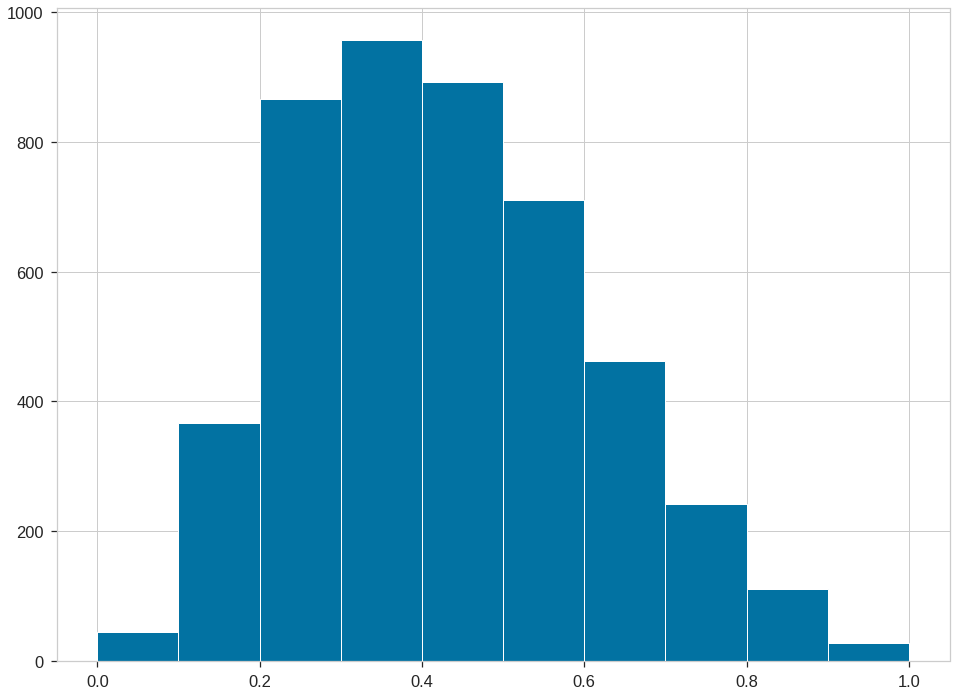

valence


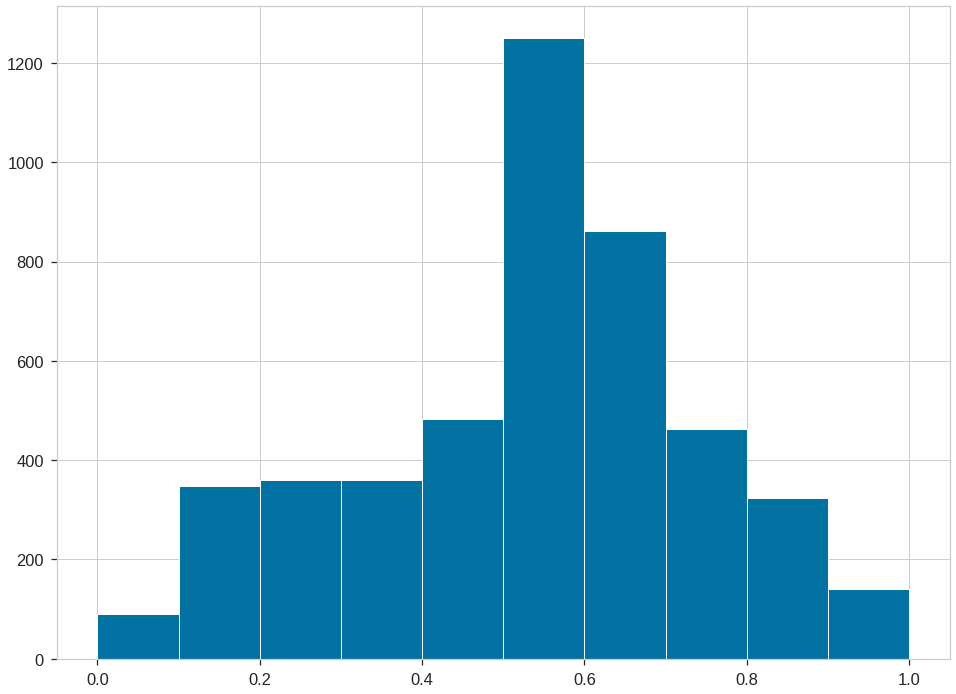

dominance


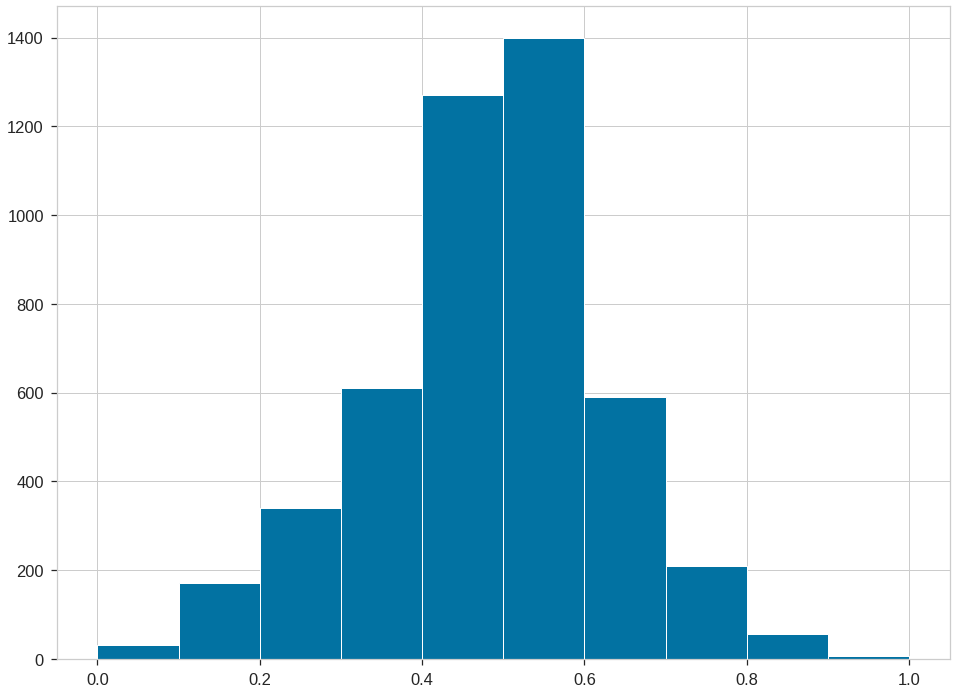

concreteness


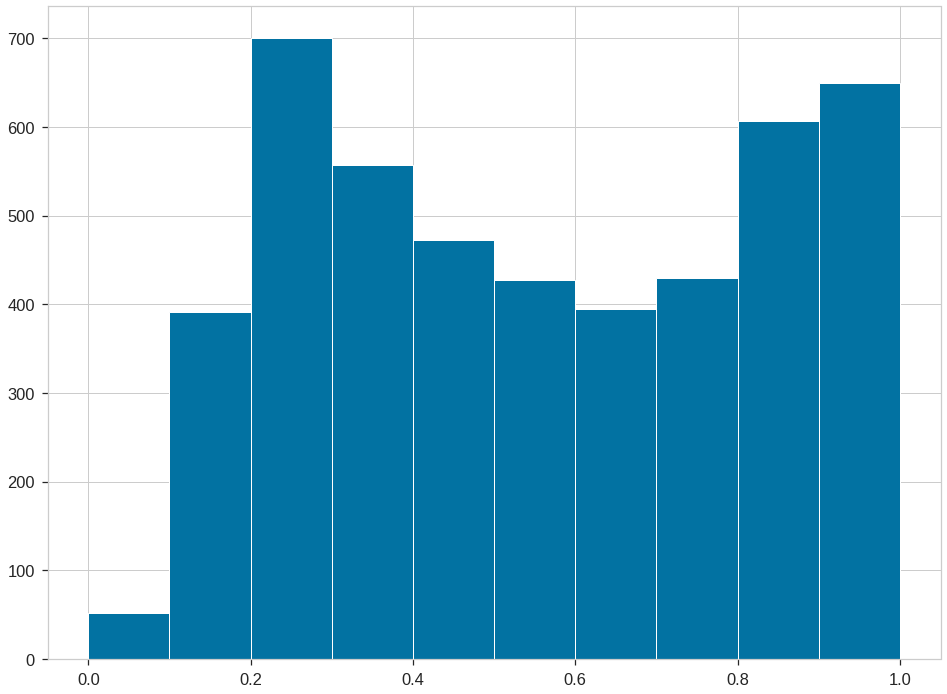

imageability


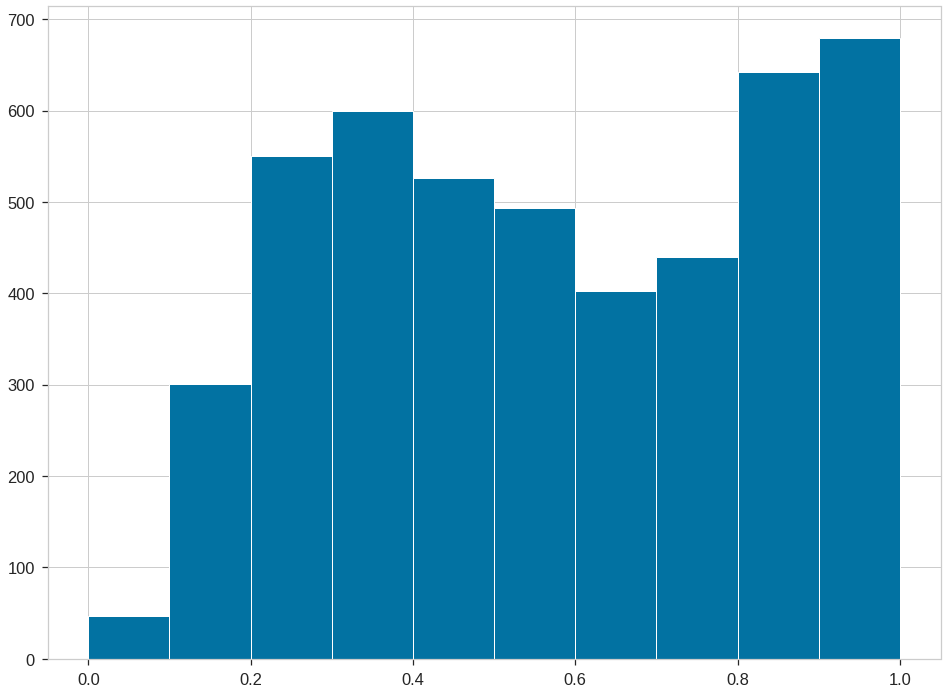

familiarity


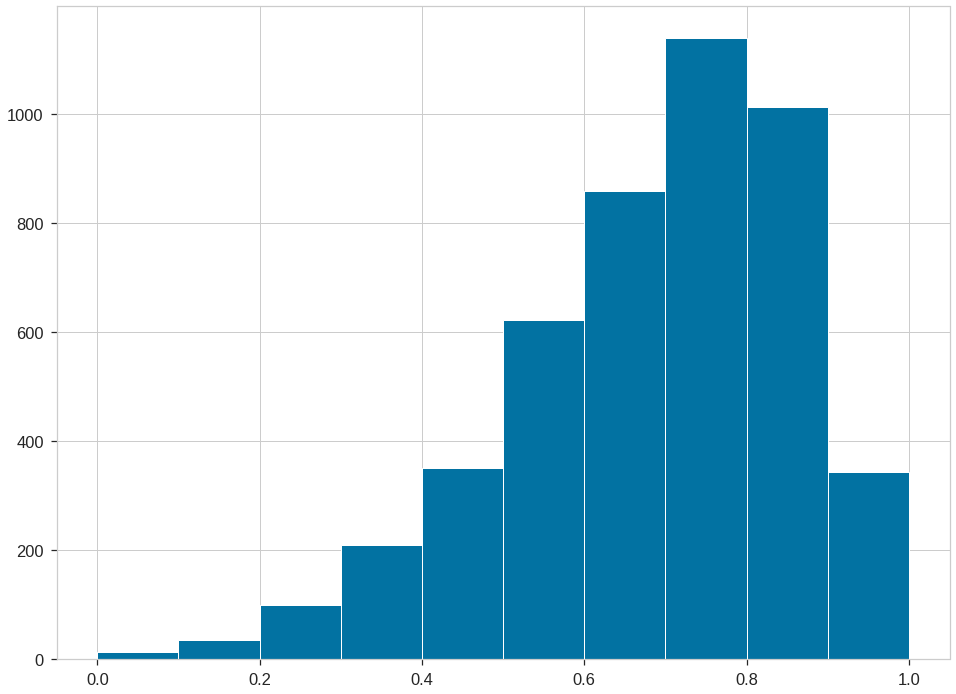

8.094831268688594 91.9051687313114


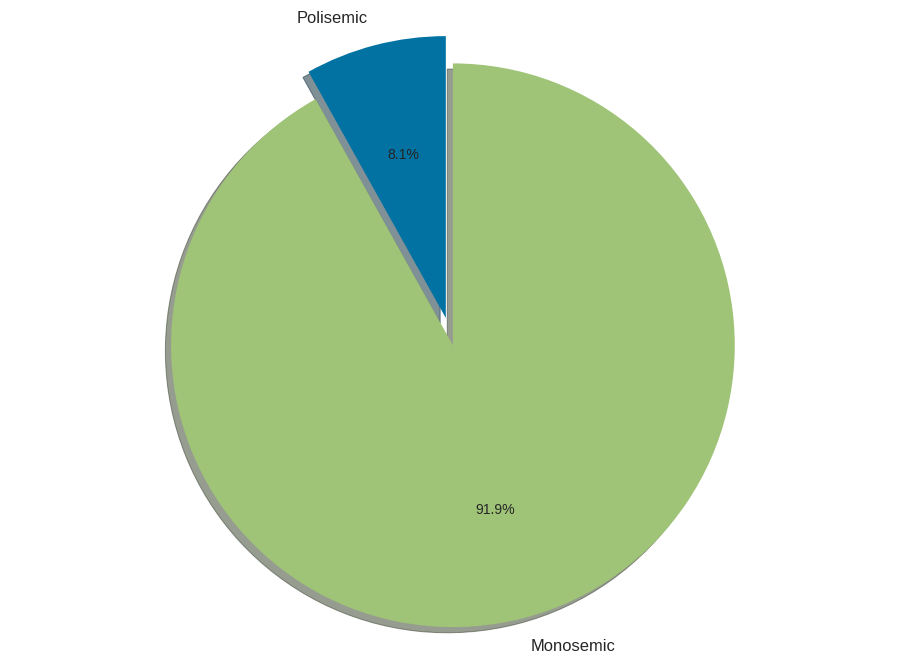

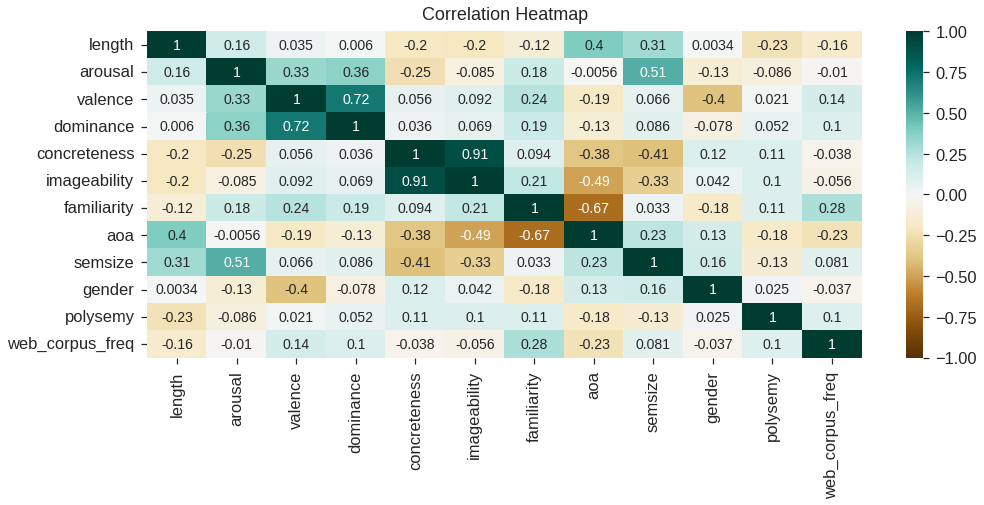

In [ ]:
df.corr() #matrice di correlazione

#distribuzione delle variabili
scaler = MinMaxScaler()

var = ['arousal', 'valence', 'dominance', 'concreteness',
       'imageability', 'familiarity']

for e in var:
    print(e)
    Y = df[[e]].values
    Y_minmax = scaler.fit_transform(Y)
    plt.hist(Y_minmax, edgecolor='white')
    plt.show()

#piechart polisemia

#percentuale delle polisemiche 
m = 0
p = 0

for e in df['polysemy'].values:
    if e == 1:
        p += 1
    if e == 0:
        m += 1

p1 = p/(p+m)*100
m1 = m/(p+m)*100
print(p1, m1)

#grafico
labels = 'Polisemic', 'Monosemic'
sizes = [p1, m1]
explode = (0.1, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

#matrice di correlazione
corr=df.corr()
plt.figure(figsize=(16, 6))
heatmap = sb.heatmap(corr, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);
#sb.heatmap(corr, cmap="Blues", annot=True)



### 1.2.1    Variable Normalization

## 1.3    Assessing Data Quality

### 1.3.1    Missing Values

In [ ]:
df.isnull().sum()

word                0
length              0
arousal             0
valence             0
dominance           0
concreteness        0
imageability        0
familiarity         0
aoa                 0
semsize             0
gender              0
polysemy            0
web_corpus_freq    14
dtype: int64

The dataset seems to be almost without null values. In fact, there are only 14 NaN, and all are concentrated in the "web_corpus_freq" variable.

In [ ]:
df[df['web_corpus_freq'].isnull()]

,word,length,arousal,valence,dominance,concreteness,imageability,familiarity,aoa,semsize,gender,polysemy,web_corpus_freq
585,burgle,6,5.118,2.303,3.656,4.970,5.424,5.200,3.735,4.697,5.333,0,NaN
753,Christmas,9,7.516,7.914,5.600,5.086,6.571,6.710,1.600,6.394,3.771,0,NaN
1070,Dad,3,4.912,6.849,4.618,6.257,6.400,6.853,1.265,5.147,6.706,0,NaN
1076,Dame,4,4.194,5.594,5.469,5.125,4.969,3.697,4.969,4.548,1.242,0,NaN
1540,Facebook,8,4.971,4.857,4.486,5.943,6.229,6.829,6.314,5.114,4.171,0,NaN
1559,FALSE,5,4.636,2.941,4.206,3.455,2.765,5.700,3.086,4.500,4.353,0,NaN
2673,Mom,3,5.667,7.936,4.813,6.424,6.250,6.594,1.333,5.094,1.097,0,NaN
2724,Mum,3,4.594,7.938,4.219,6.091,6.625,6.906,1.219,5.061,1.212,0,NaN
2726,Mummy,5,5.364,7.471,4.879,5.794,6.515,6.182,1.771,4.677,1.455,0,NaN
3773,skijump,7,5.914,5.771,5.486,6.200,6.529,4.758,5.028,5.389,5.000,0,NaN


Looking at the values that are present in the dataset but are not present in the web corpus, we can spot some similarities.
There are 3 recurrences of the same word but slightly different from one another: "Mom", "Mum" and "Mommy". Also the word "Dad" is not present in the corpus.

In addition, there are 3 words written with full capital letters: "FALSE", "TRUE", and "TV". If the corpus is case sensitive, that could be an explaination of why those words are not present.

Finally, there are 2 words of social media that are absent in the corpus: "Facebook" and "Twitter". This is a bit strange since those 2 words are really known.

### 1.3.2    Outliers

In [ ]:
#creating a copy of the df
df2 = df.copy()
#dropping some variables for boxplot visualzation
df3 = df2.drop(["word","web_corpus_freq", "polysemy","length"], axis=1)
df3.head()

,arousal,valence,dominance,concreteness,imageability,familiarity,aoa,semsize,gender
0,4.200,2.864,4.333,5.455,4.391,2.382,6.760,4.652,5.391
1,3.125,5.781,4.667,5.906,5.344,3.324,5.177,5.121,3.303
2,3.273,5.250,5.235,3.286,3.177,5.121,5.543,2.667,3.971
3,4.194,3.767,4.419,3.367,2.516,3.971,6.233,4.679,5.167
4,3.846,3.880,4.800,3.292,2.571,3.097,6.407,5.083,4.571


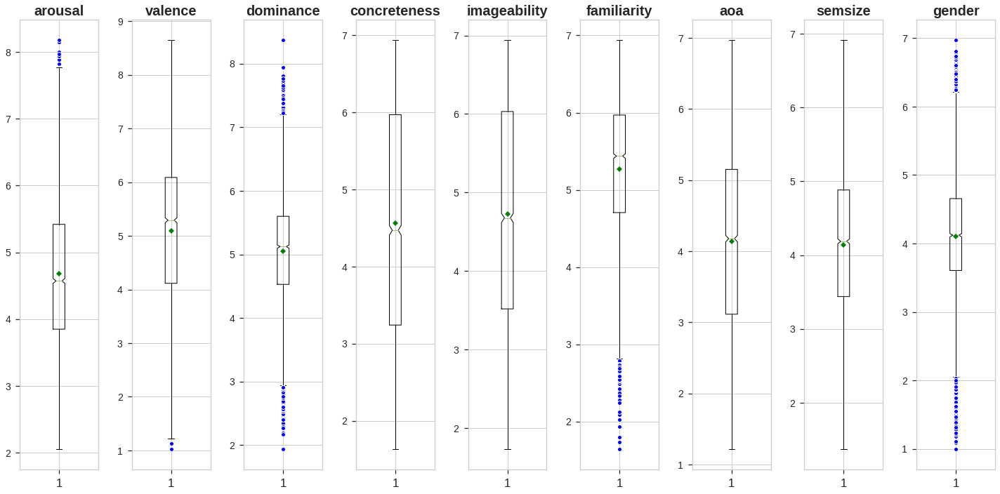

In [ ]:
#displaying all boxplot in one plot

#defining outliers as a blue underscore circle
blue_circle = dict(markerfacecolor='blue', marker='o', markeredgecolor='white')

#defining fig, axs as plt.subplots. In the arguments we pass in that we want 1 row, and then the number of columns. 
#The number of columns will be equal to the length of df.columns. 
#Finally, we will set the figsize to 20 by 10.
fig, axs = plt.subplots(1, len(df3.columns), figsize=(20,10))

#defining the shape and color of the mean
mean_shape = dict(markerfacecolor='green', marker='D', markeredgecolor='green')

#creating a small for loop which will loop over each of our plot axes. 
#Using the enumerate function here to keep track of i, our index value
for i, ax in enumerate(axs.flat):
    #addong in our boxplot by calling upon ax.boxplot() and passing in df.iloc, 
    #which allows us to get columns by the index variable, i. 
    #We do this by creating square brackets, with a colon followed by a comma. 
    #This tells the iloc function to get all rows, and then we pass in the column index. 
    #Next we specify our outlier properties and pass in red_circle.
    ax.boxplot(df3.iloc[:,i], flierprops=blue_circle, showmeans = True, meanprops =mean_shape, notch=True)
    ax.set_title(df3.columns[i], fontsize=20, fontweight='bold')
    ax.tick_params(axis='y', labelsize=14)
    
plt.tight_layout()

First, some variables had to be dropped to perform this analysys with boxplots. "word" is not a numerical variable, and for that reason is not used in this plot. "web_corpus-freq" and "polysemy" can be analised on their own.

The plot shows that some variables are well distributed, like "concretness" and "imageability", while others are not, like "length", "arousal" and "dominance". 
Later this issue will be addressed with more depth.

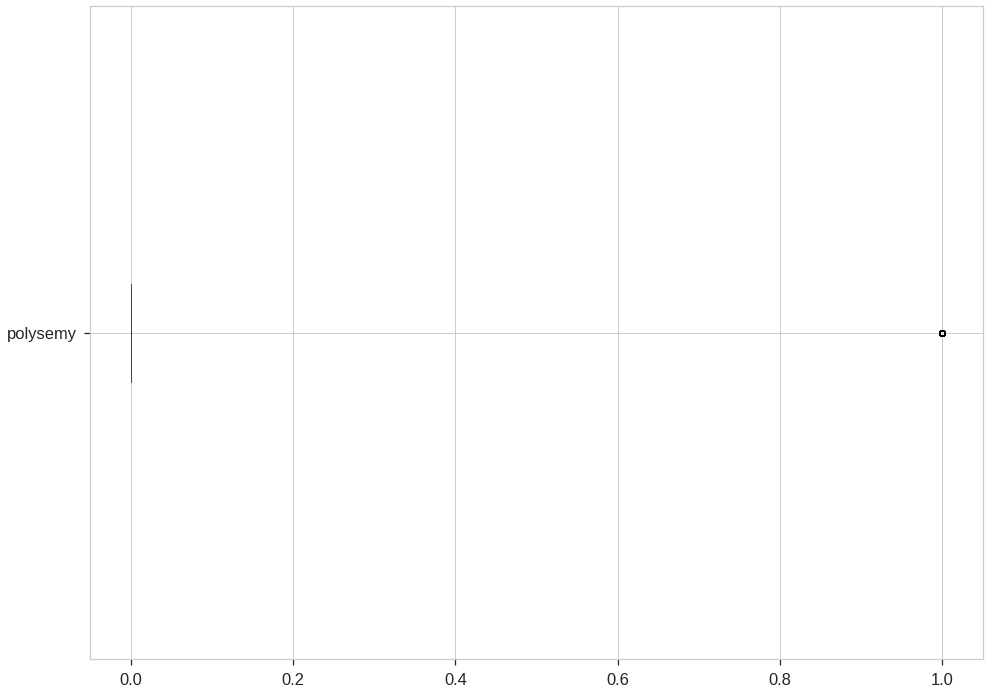

In [ ]:
df["polysemy"].plot(kind="box", vert = False)

"polysemy" has only 2 possible values, 0 and 1, that are false and true. For that reason it doesn't have outliers.

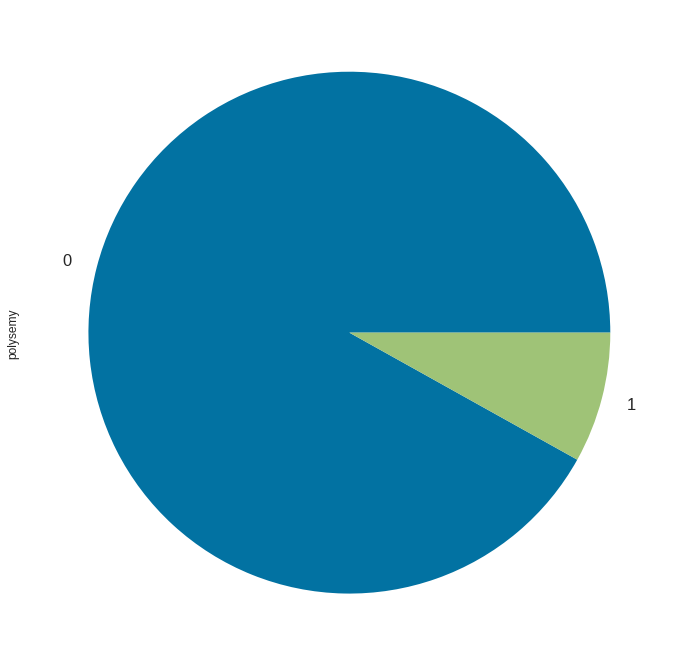

In [ ]:
df["polysemy"].value_counts().plot(kind="pie")

"web_corpus_freq" instead seems to have a lot of outliers, as shown below.

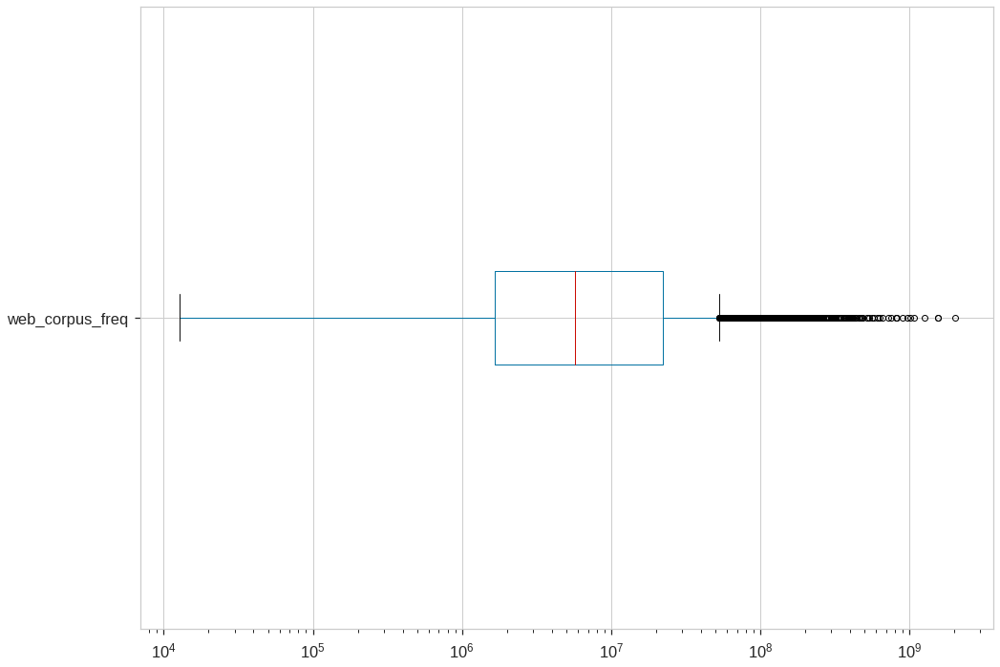

In [ ]:
df["web_corpus_freq"].dropna(0, inplace = False).plot(kind="box", vert = False, logx=True)

### 1.3.3    Errors

In [ ]:
var = ['arousal', 'valence', 'dominance', 'concreteness',
       'imageability', 'familiarity','semsize','gender','aoa']

for element in var:
  for e in df[element].values:
    if(type(e)!=np.float64):
       print(type(e))

  print("tutto ok fra")
    

tutto ok fra
tutto ok fra
tutto ok fra
tutto ok fra
tutto ok fra
tutto ok fra
tutto ok fra
tutto ok fra
tutto ok fra


In [ ]:
#creating a copy of the df
df_errors = df.copy()

In [ ]:
df_errors[["word", "length"]]

,word,length
0,abattoir,8
1,abbey,5
2,abbreviate,10
3,abdicate,8
4,abdication,10
...,...,...
4677,zeppelin,8
4678,zero,4
4679,zest,4
4680,zoo,3


In [ ]:
df_errors["word"] = df_errors.word.str.len()

In [ ]:
df_errors[["word", "length"]]

,word,length
0,8,8
1,5,5
2,10,10
3,8,8
4,10,10
...,...,...
4677,8,8
4678,4,4
4679,4,4
4680,3,3


In [ ]:
df_errors["word"].equals(df_errors["length"])

True

All values of the variable 'word' are correct in regards of their length

### 1.3.4    Semantic Inconsistencies

In [ ]:
df.loc[df['polysemy']==1]

,word,length,arousal,valence,dominance,concreteness,imageability,familiarity,aoa,semsize,gender,polysemy,web_corpus_freq
62,address,7,3.206,5.382,5.364,5.059,4.343,5.839,3.371,3.912,4.000,1,261872866.0
107,aim,3,4.794,6.606,6.829,2.677,2.941,5.909,3.857,4.206,4.265,1,28951240.0
188,apple,5,4.677,6.147,5.485,6.824,6.909,6.719,1.529,2.441,3.424,1,50551171.0
211,arm,3,3.735,5.471,5.774,6.727,6.571,6.546,1.457,3.171,4.265,1,23724057.0
216,arms,4,4.364,5.546,5.636,6.647,6.485,6.469,2.206,3.758,4.912,1,27432921.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4630,wood,4,3.000,5.206,5.265,6.727,6.606,6.303,2.629,3.727,5.235,1,51130555.0
4647,wound,5,5.156,2.706,3.667,5.758,5.853,5.500,4.118,3.706,5.118,1,5820050.0
4661,yak,3,3.552,4.807,4.700,5.219,4.742,2.829,4.897,3.833,4.710,1,1056994.0
4662,yard,4,2.788,5.171,4.771,5.829,5.343,4.177,3.771,4.286,4.457,1,15075593.0


## 1.4    Eventual other variable trasformations

## 1.5    Pairwise correlations and eventual elimination of variables

An overview of the relation between the nine variables is provided in Fig. 6. Where a correlation greater than |0.6| is found, we plotted the values of the two variables for a better visualization (fig. 7). 
There is a strong correlation (0.91) between concreteness and imageability: it is difficult to imagine an abstract word and easier to imagine a concrete one. Moreover, concreteness and imageability relate to the other variables similarly, with a margin of +-0.14. Therefore we merged them into a new variable, perceivability. The values of perceivabilty are the mean of concreteness and imageability values. 
Other positively correlated variables are valence and dominance, with 0.72: the more valuable an item is perceived, the higher the degree of control over the object. 
Familiary and age of acquisition are instead negatively related: from the pairplot (Fig \ref{fig:pairplot}) is apparent that every word acquired in early age is highly familiar. 

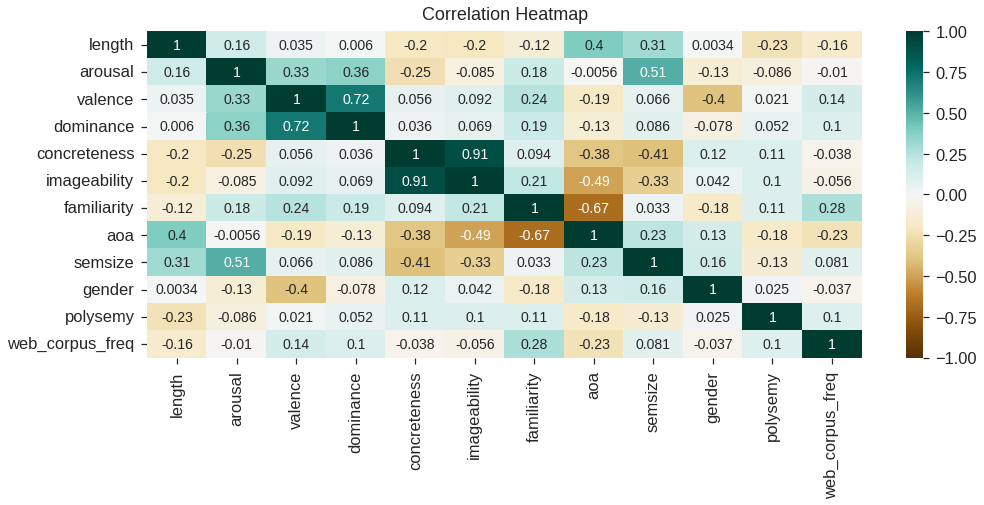

In [ ]:
#matrice di correlazione
corr=df.corr()
plt.figure(figsize=(16, 6))
heatmap = sb.heatmap(corr, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);
#sb.heatmap(corr, cmap="Blues", annot=True)


In [ ]:
#creating a copy of the df
dfpp = df.copy()
#dropping some variables for boxplot visualzation
dfpp1 = dfpp.drop(["word", "polysemy","length", 'gender', 'web_corpus_freq', 'semsize', 'arousal'], axis=1)

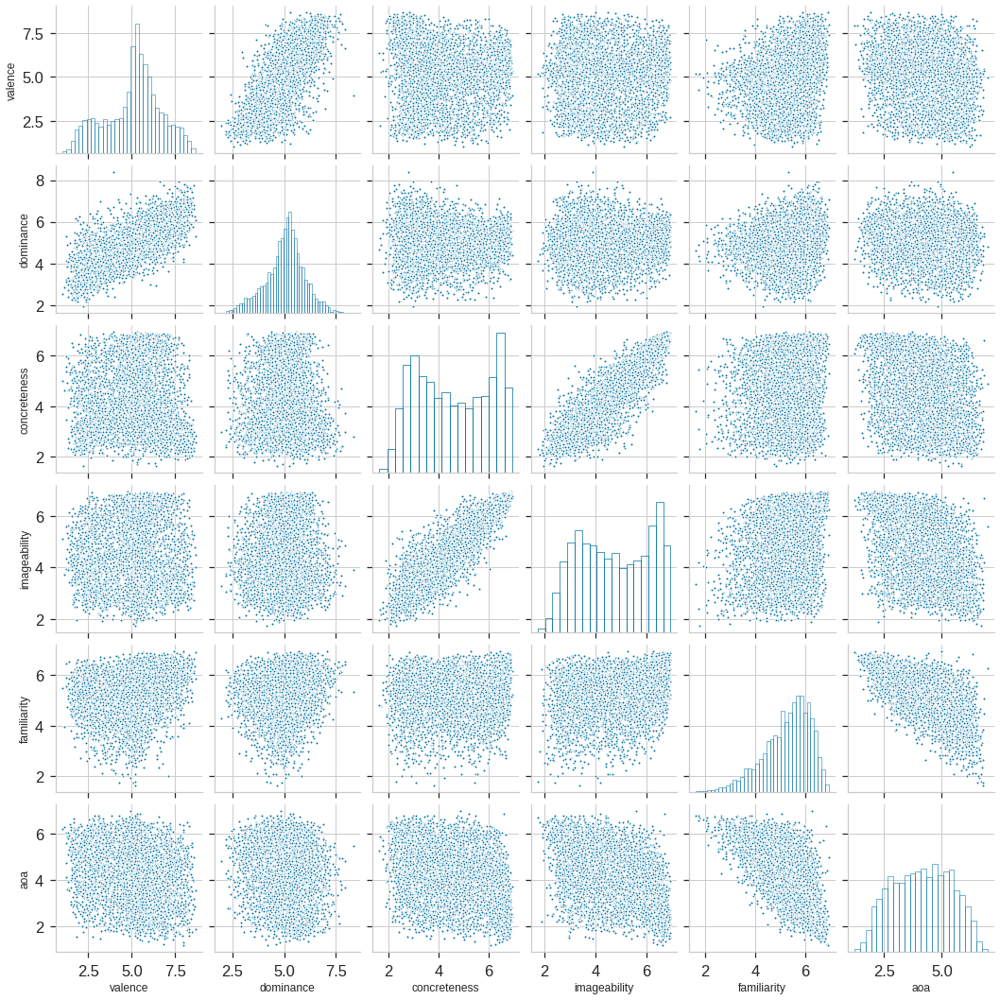

In [ ]:
sb.pairplot(dfpp1, 
            plot_kws=dict(marker=".", linewidth=1),
            diag_kws=dict(fill=False),
            corner=False
           )

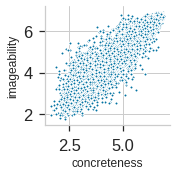

In [ ]:
sb.pairplot(dfpp1, 
            x_vars=['concreteness'],
            y_vars=['imageability'],
            plot_kws=dict(marker=".", linewidth=1),
            diag_kws=dict(fill=False),
            corner=False
           )

#plt.savefig('pp_imageability_concreteness.png', dpi=300)
#files.download('pp_imageability_concreteness.png') 

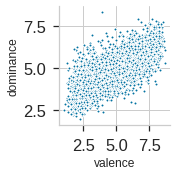

In [ ]:
pp_dv = sb.pairplot(dfpp1, 
            x_vars=['valence'],
            y_vars=['dominance'],
            plot_kws=dict(marker=".", linewidth=1),
            diag_kws=dict(fill=False),
            corner=False
           )

#plt.savefig('pp_dominance_valence.png', dpi=300)
#files.download('pp_dominance_valence.png') 

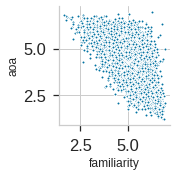

In [ ]:
sb.pairplot(dfpp1, 
            x_vars=['familiarity'],
            y_vars=['aoa'],
            plot_kws=dict(marker=".", linewidth=1),
            diag_kws=dict(fill=False),
            corner=False
           )

#plt.savefig('pp_aoa_familiarity.png', dpi=300)
#files.download('pp_aoa_familiarity.png') 

In [ ]:
df2["perceivability"] = df2[["imageability", "concreteness"]].mean(axis=1)
df2.head()

,word,length,arousal,valence,dominance,concreteness,imageability,familiarity,aoa,semsize,gender,polysemy,web_corpus_freq,perceivability
0,abattoir,8,4.200,2.864,4.333,5.455,4.391,2.382,6.760,4.652,5.391,0,160074.0,4.9230
1,abbey,5,3.125,5.781,4.667,5.906,5.344,3.324,5.177,5.121,3.303,0,4224864.0,5.6250
2,abbreviate,10,3.273,5.250,5.235,3.286,3.177,5.121,5.543,2.667,3.971,0,140105.0,3.2315
3,abdicate,8,4.194,3.767,4.419,3.367,2.516,3.971,6.233,4.679,5.167,0,124123.0,2.9415
4,abdication,10,3.846,3.880,4.800,3.292,2.571,3.097,6.407,5.083,4.571,0,128143.0,2.9315


In [ ]:
df_perc=df2.drop(["concreteness","imageability"], axis=1)
df_perc.head()

,word,length,arousal,valence,dominance,familiarity,aoa,semsize,gender,polysemy,web_corpus_freq,perceivability
0,abattoir,8,4.200,2.864,4.333,2.382,6.760,4.652,5.391,0,160074.0,4.9230
1,abbey,5,3.125,5.781,4.667,3.324,5.177,5.121,3.303,0,4224864.0,5.6250
2,abbreviate,10,3.273,5.250,5.235,5.121,5.543,2.667,3.971,0,140105.0,3.2315
3,abdicate,8,4.194,3.767,4.419,3.971,6.233,4.679,5.167,0,124123.0,2.9415
4,abdication,10,3.846,3.880,4.800,3.097,6.407,5.083,4.571,0,128143.0,2.9315


# 2    Clustering

## 2.1    Preprocessing




In [ ]:
dfprepro= df_perc.copy()
dfprepro=dfprepro.rename(columns={"gender": "masculinity"})

In [ ]:
dfprepro.loc[(dfprepro['web_corpus_freq'].isnull() == True), 'web_corpus_freq'] = dfprepro['web_corpus_freq'].mean()


In [ ]:
dfprepro[dfprepro['web_corpus_freq'].isnull()]

,word,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability


In [ ]:
dfprepro["web_corpus_log"] = pd.qcut(dfprepro["web_corpus_freq"], 10) #taglio la variabile web_corpus_freq in 10 gruppi
print(dfprepro[["web_corpus_log", "web_corpus_freq"]].groupby(["web_corpus_log"], as_index=False).mean())

               web_corpus_log  web_corpus_freq
0       (12769.999, 575889.4]     3.097333e+05
1       (575889.4, 1242854.6]     9.041106e+05
2      (1242854.6, 2214291.0]     1.686212e+06
3      (2214291.0, 3597973.4]     2.849525e+06
4      (3597973.4, 5702981.5]     4.637392e+06
5      (5702981.5, 9168887.0]     7.342067e+06
6     (9168887.0, 16042883.5]     1.222427e+07
7    (16042883.5, 31729949.6]     2.273650e+07
8    (31729949.6, 69227170.1]     4.752152e+07
9  (69227170.1, 2022459848.0]     1.985905e+08


In [ ]:
dataframe = [dfprepro]

In [ ]:
for dataset in dataframe:
    dataset.loc[(dataset["web_corpus_freq"] > 10000) & (dataset["web_corpus_freq"] <= 100000), "web_corpus_freq"] = 4
    dataset.loc[(dataset["web_corpus_freq"] > 100000) & (dataset["web_corpus_freq"] <= 1000000), "web_corpus_freq"] = 5
    dataset.loc[(dataset["web_corpus_freq"] > 1000000) & (dataset["web_corpus_freq"] <= 10000000), "web_corpus_freq"] = 6
    dataset.loc[(dataset["web_corpus_freq"] > 10000000) & (dataset["web_corpus_freq"] <= 100000000), "web_corpus_freq"] = 7
    dataset.loc[(dataset["web_corpus_freq"] > 100000000) & (dataset["web_corpus_freq"] <= 1000000000), "web_corpus_freq"] = 8
    dataset.loc[dataset["web_corpus_freq"] > 1000000000, "web_corpus_freq"] = 9
    
dfprepro.head()

,word,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability,web_corpus_log
0,abattoir,8,4.200,2.864,4.333,2.382,6.760,4.652,5.391,0,5.0,4.9230,"(12769.999, 575889.4]"
1,abbey,5,3.125,5.781,4.667,3.324,5.177,5.121,3.303,0,6.0,5.6250,"(3597973.4, 5702981.5]"
2,abbreviate,10,3.273,5.250,5.235,5.121,5.543,2.667,3.971,0,5.0,3.2315,"(12769.999, 575889.4]"
3,abdicate,8,4.194,3.767,4.419,3.971,6.233,4.679,5.167,0,5.0,2.9415,"(12769.999, 575889.4]"
4,abdication,10,3.846,3.880,4.800,3.097,6.407,5.083,4.571,0,5.0,2.9315,"(12769.999, 575889.4]"


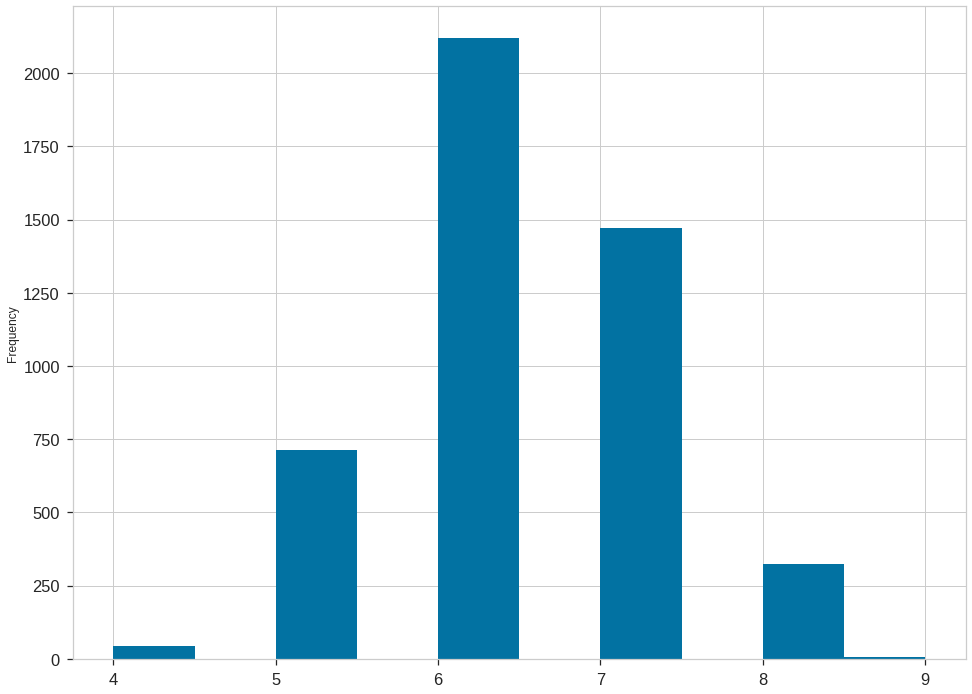

In [ ]:
dfprepro["web_corpus_freq"].plot(kind="hist")

In [ ]:
dfprepro['web_corpus_freq'].describe()

count    4682.000000
mean        6.285135
std         0.843987
min         4.000000
25%         6.000000
50%         6.000000
75%         7.000000
max         9.000000
Name: web_corpus_freq, dtype: float64

In [ ]:
dfprepro['web_corpus_log'].describe()

count                           4682
unique                            10
top       (68973807.5, 2022459848.0]
freq                             469
Name: web_corpus_log, dtype: object

In [ ]:
dfprepro = dfprepro.drop(["web_corpus_log","word"], axis=1)
#dfprepro.loc[(dfprepro['web_corpus_freq'].isnull() == True), 'web_corpus_freq'] = dfprepro['web_corpus_freq'].mean()
dfprepro.isnull().sum()
dfprepro.head()

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability
0,8,4.200,2.864,4.333,2.382,6.760,4.652,5.391,0,5.0,4.9230
1,5,3.125,5.781,4.667,3.324,5.177,5.121,3.303,0,6.0,5.6250
2,10,3.273,5.250,5.235,5.121,5.543,2.667,3.971,0,5.0,3.2315
3,8,4.194,3.767,4.419,3.971,6.233,4.679,5.167,0,5.0,2.9415
4,10,3.846,3.880,4.800,3.097,6.407,5.083,4.571,0,5.0,2.9315


In [ ]:
pca = PCA(n_components=2)
pca.fit(dfprepro)
PCA_df = pd.DataFrame(pca.transform(dfprepro))
pca.transform(dfprepro)
score_pca = pca.transform(dfprepro)

In [ ]:
scaler = MinMaxScaler()

Y_pca=PCA_df.values

Y_pca_minmax = scaler.fit_transform(Y_pca)

scaled_dfprepro = pd.DataFrame(data = Y_pca_minmax, columns = PCA_df.columns)

scaled_dfprepro.head()

X=dfprepro.values

X_minmax = scaler.fit_transform(X)

df_xminmax = pd.DataFrame(data = X_minmax, columns = dfprepro.columns)



In [ ]:
scaled_dfprepro.head()

,0,1
0,0.567559,0.141222
1,0.313091,0.396255
2,0.603087,0.434351
3,0.573763,0.250204
4,0.696536,0.292227


In [ ]:
df_xminmax['word']=df_perc['word']

In [ ]:
cols = df_xminmax.columns.tolist()
cols = cols[-1:] + cols[:-1]

df_xminmax=df_xminmax[cols]


df_xminmax.head()

,word,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability
0,abattoir,0.428571,0.350163,0.240777,0.372006,0.138889,0.963317,0.591837,0.735388,0.0,0.2,0.609099
1,abbey,0.214286,0.174510,0.623736,0.423950,0.316893,0.688108,0.676540,0.385698,0.0,0.4,0.746168
2,abbreviate,0.571429,0.198693,0.554024,0.512286,0.656463,0.751739,0.233339,0.497572,0.0,0.2,0.278825
3,abdicate,0.428571,0.349183,0.359328,0.385381,0.439153,0.871697,0.596713,0.697873,0.0,0.2,0.222201
4,abdication,0.571429,0.292320,0.374163,0.444635,0.273998,0.901947,0.669677,0.598057,0.0,0.2,0.220248


In [ ]:
df_xminmax=df_xminmax.drop(['word'],axis=1)

df_xminmax.describe()

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability
count,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000
mean,0.310597,0.428289,0.532598,0.482728,0.684871,0.508419,0.498718,0.519165,0.080948,0.457027,0.554749
std,0.143302,0.179275,0.209314,0.144739,0.174077,0.217797,0.184810,0.152787,0.272785,0.168797,0.266786
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.214286,0.292810,0.405015,0.402488,0.578042,0.329451,0.372584,0.436443,0.000000,0.400000,0.313092
50%,0.285714,0.410784,0.559275,0.494868,0.716364,0.514256,0.507766,0.522693,0.000000,0.400000,0.538709
75%,0.428571,0.549346,0.664041,0.569051,0.816704,0.683762,0.633375,0.612293,0.000000,0.600000,0.813629
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
PCA_df

,0,1
0,3.120256,-3.279911
1,-0.691649,-0.663581
2,3.652448,-0.272761
3,3.213184,-2.161888
4,5.052306,-1.730781
...,...,...
4677,2.402470,-0.047095
4678,-2.805922,-1.236960
4679,-1.332992,0.901015
4680,-3.880212,1.497711


In [ ]:
x = PCA_df[0]
y = PCA_df[1]
#z = PCA_df[2]
print(type (x))
print(type (y))
#print(type (z))
print(type (Y_pca_minmax))

<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'numpy.ndarray'>


In [ ]:
print (Y_pca_minmax)

[[0.5675594  0.14122187]
 [0.31309066 0.39625457]
 [0.60308653 0.43435069]
 ...
 [0.270277   0.54876721]
 [0.10023392 0.60693153]
 [0.45940086 0.47999567]]


## 2.2    Clustering analysis by K-Means

In [ ]:
kmeans = KMeans( n_clusters=3, n_init=10, max_iter=100 )
kmeans.fit(Y_pca_minmax)

KMeans(max_iter=100, n_clusters=3)

In [ ]:
kmeans.labels_

array([2, 0, 2, ..., 0, 0, 1], dtype=int32)

In [ ]:
print('SSE', kmeans.inertia_)
print('Silhouette', silhouette_score(Y_pca_minmax, kmeans.labels_))

SSE 107.1169618212198
Silhouette 0.36741782484823465


In [ ]:
print('Calinski-Harabasz', metrics.calinski_harabasz_score(Y_pca_minmax, kmeans.labels_))

Calinski-Harabasz 3575.890305688165


In [ ]:
silhouette_list = []

#for k in range(2, 50):
#    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
#    kmeans.fit(Y_pca_minmax)
#    silhouette_list.append( silhouette_score(Y_pca_minmax, kmeans.labels_))

In [ ]:
#plt.plot(range(2, len(silhouette_list)+2), silhouette_list, marker='*')
#plt.ylabel('Silhouette score')
#plt.show()

In [ ]:
kmeans = KMeans(n_clusters=3, n_init=10, max_iter=100)
kmeans.fit(Y_pca_minmax)

KMeans(max_iter=100, n_clusters=3)

In [ ]:
centers = kmeans.cluster_centers_

In [ ]:
kmeans.labels_

array([2, 1, 2, ..., 1, 1, 0], dtype=int32)

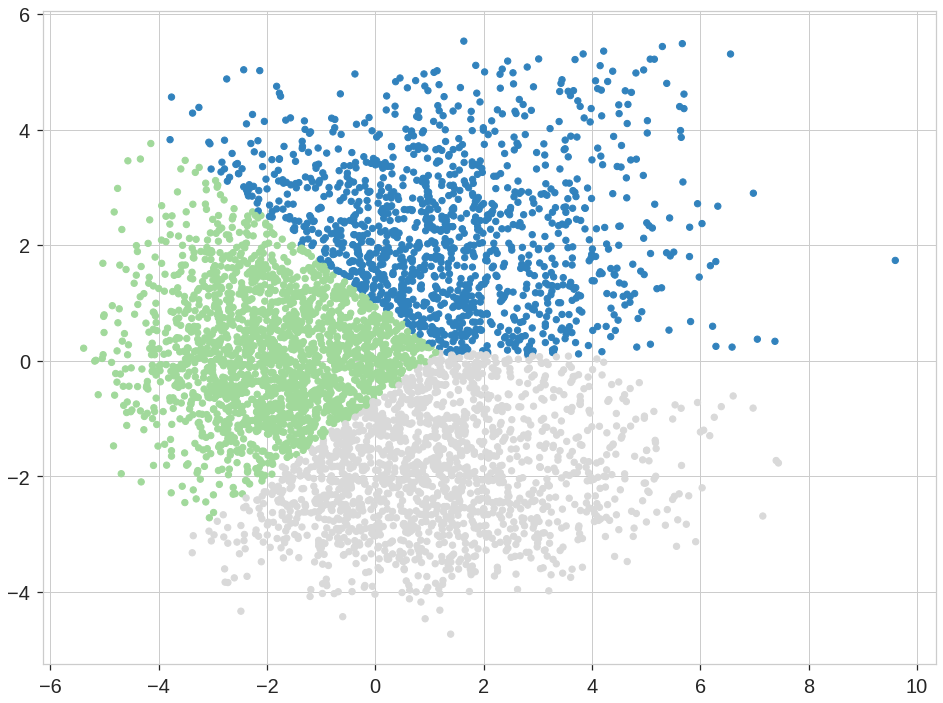

In [ ]:
from matplotlib import cm
plt.scatter( Y_pca[:,0], Y_pca[:,1], s=40, c= kmeans.labels_ , cmap = cm.tab20c)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.show()


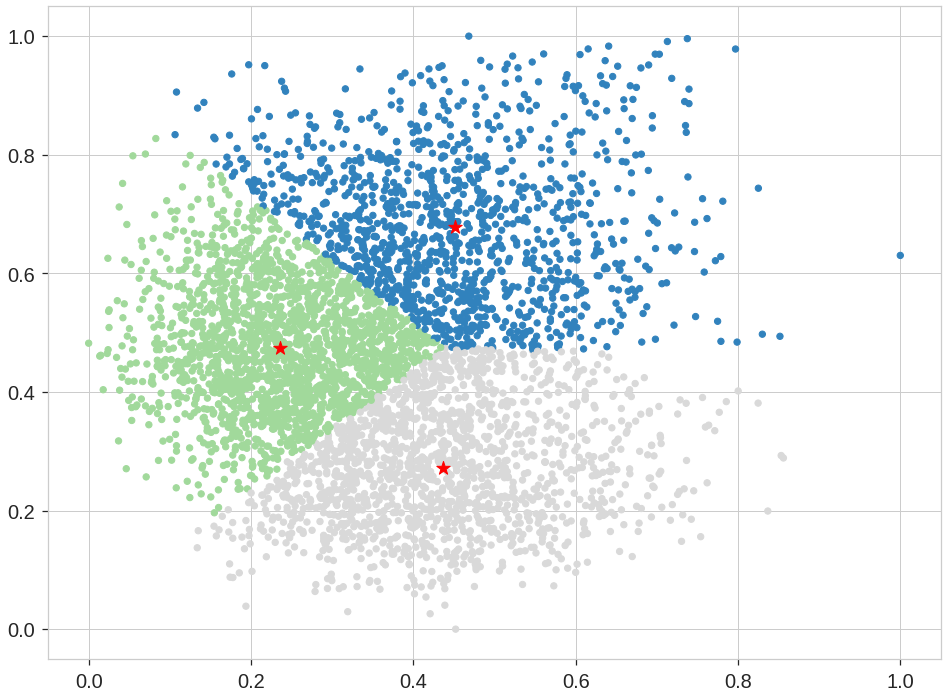

In [ ]:
plt.scatter( Y_pca_minmax[:,0], Y_pca_minmax[:,1], s=40, c= kmeans.labels_ , cmap = cm.tab20c)
plt.scatter( centers[:,0], centers[:,1], c='red', marker='*', s=200 )

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.show()

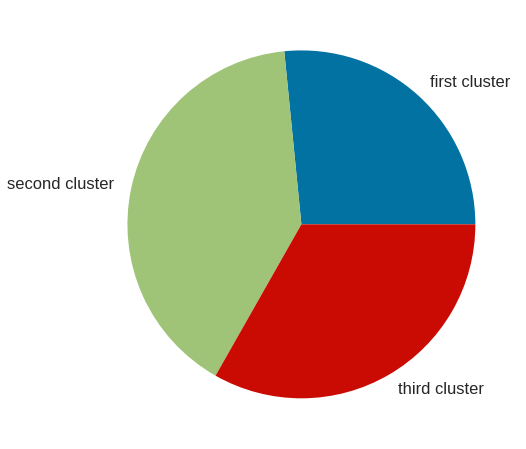

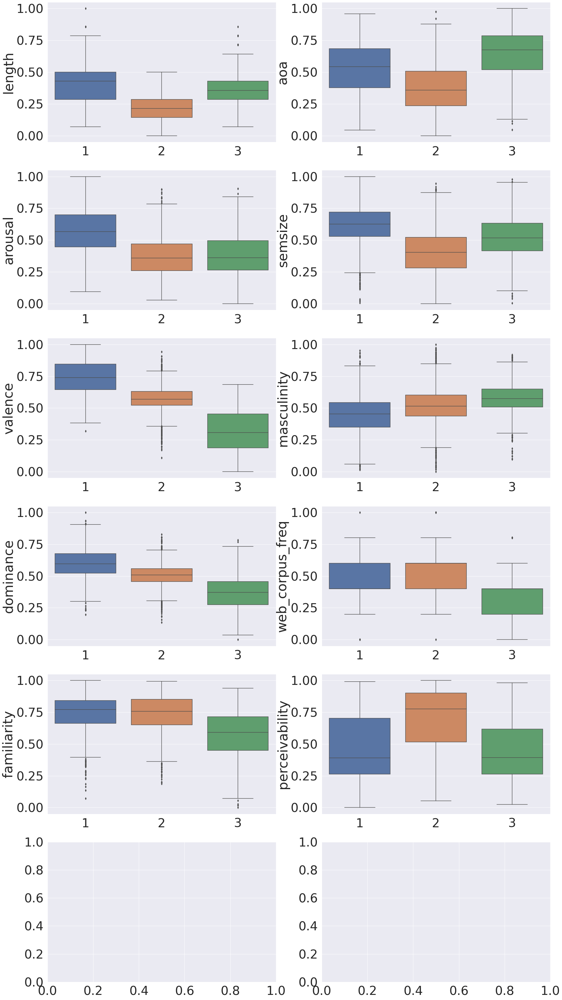

In [ ]:
scaled_dfprepro['cluster'] = kmeans.labels_

df_xminmax['cluster'] = kmeans.labels_

df_xminmax['cluster']=df_xminmax['cluster'].map({0:'1', 1:'2', 2:'3'})

df_xminmax_plot=df_xminmax.drop(["polysemy"], axis=1)

plt.figure(figsize = (8,8))
pie = scaled_dfprepro.groupby(['cluster']).size().to_frame().reset_index()
pie.rename(columns={0: 'count'}, inplace=True)

pie_labels = ['first cluster', 'second cluster', 'third cluster']
plt.pie(pie['count'], labels=pie_labels)
plt.show()
sb.set(font_scale=3.7)

fig, axs = plt.subplots(ncols=2, nrows=6, figsize=(30,60))
for cols, x in zip(df_xminmax_plot.columns[:5], range(5)):
    for y in range(1):
        g1=sb.boxplot(y=cols, x='cluster', data=df_xminmax_plot, order=['1', '2','3'], ax=axs[x,y], showfliers = True )
        g1.set(xlabel=None)

for cols, x in zip(df_xminmax_plot.columns[5:], range(5)):
    for y in range(1,2):
        g2=sb.boxplot(y=cols, x='cluster', data=df_xminmax_plot, order=['1', '2','3'], ax=axs[x,y], showfliers = True )
        g2.set(xlabel=None)

In [ ]:
df_perc.isnull().sum()

df_xminmax_plot['word']=df_perc['word']
df_xminmax_plot.loc[df_xminmax['cluster']=='First']

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,web_corpus_freq,perceivability,cluster,word


In [ ]:
df_xminmax_plot.loc[df_xminmax['cluster']=='Second']

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,web_corpus_freq,perceivability,cluster,word


In [ ]:
df_xminmax_plot.loc[df_xminmax['cluster']=='Third']

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,web_corpus_freq,perceivability,cluster,word


## 2.3    Analysis by density-based clustering

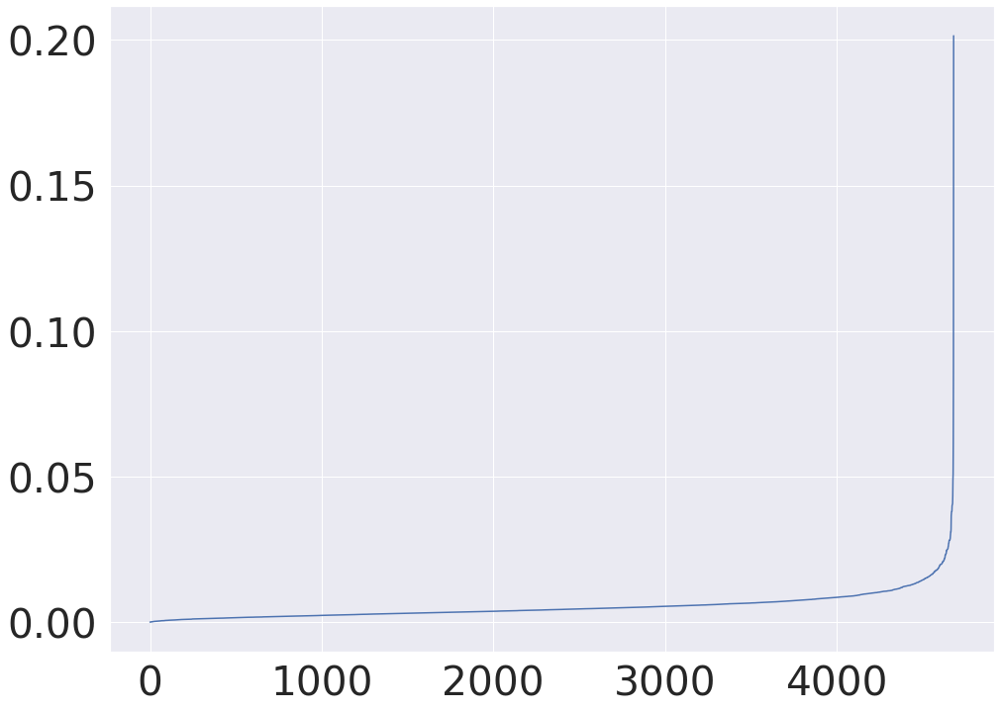

In [ ]:
from sklearn.neighbors import NearestNeighbors

neighbors = NearestNeighbors(n_neighbors=20)
neighbors_fit = neighbors.fit(Y_pca_minmax)
distances, indices = neighbors_fit.kneighbors(Y_pca_minmax)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

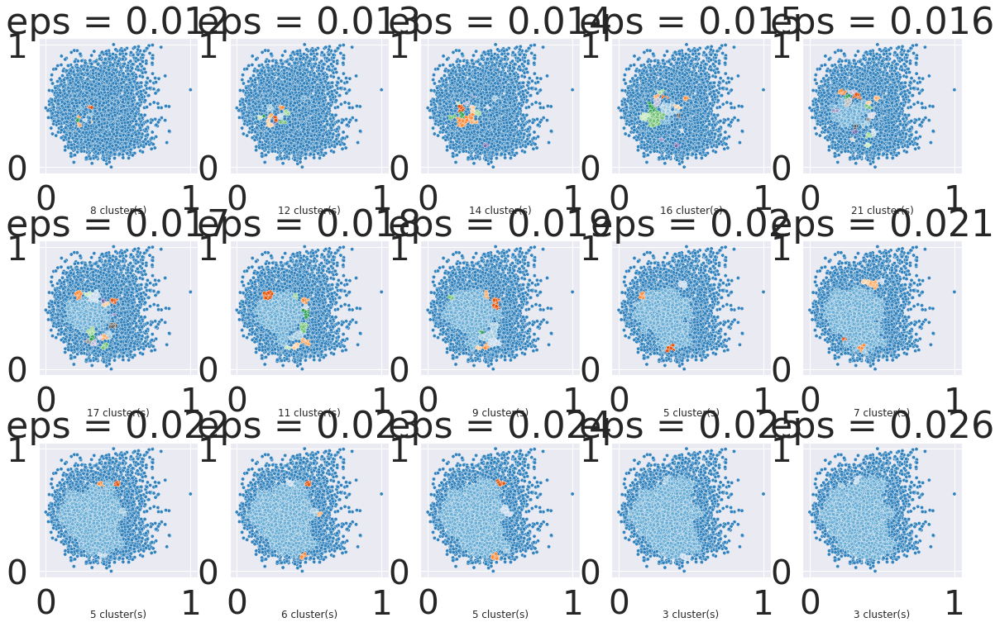

In [ ]:
fig = plt.figure(figsize=(20, 12))
fig.subplots_adjust(hspace=.5, wspace=.2)
i = 1

for x in range(0, 15, 1):
    #y=-2+x/10
    eps = 0.012+1*x/1000
    db = DBSCAN(eps=eps, min_samples=20).fit(Y_pca_minmax)
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_
    
    #print(eps)
    ax = fig.add_subplot(3, 5, i)
    ax.title.set_text("eps = {}".format(round(eps, 3)))
    #ax.text(1, 4, "eps = {}".format(round(eps, 3)), fontsize=25, ha="center")
    sb.scatterplot(Y_pca_minmax[:,0], Y_pca_minmax[:,1], hue=["{} cluster".format(x) for x in labels],legend=False,palette='tab20c',markers='.',size=1)
    ax.text(0.5,-0.3, "{} cluster(s)".format(max(labels)+1), size=12, ha="center", transform=ax.transAxes)


    i += 1

In [ ]:
dbscan = DBSCAN( eps=0.018, min_samples=20)
dbscan.fit(Y_pca_minmax)

DBSCAN(eps=0.018, min_samples=20)

In [ ]:
dbscan.labels_

array([-1,  0, -1, ...,  0, -1,  5])

In [ ]:
unique_labels, unique_counts = np.unique(dbscan.labels_, return_counts=True)
print(max(unique_labels))

10


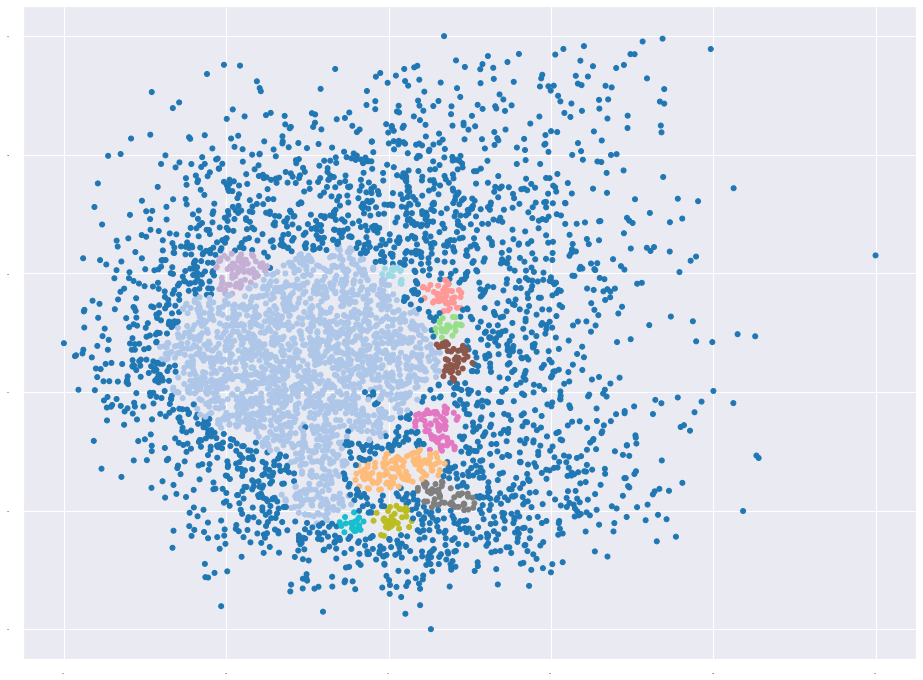

In [ ]:
#cols = [col for col in PCA_df.columns if col != 'class']

plt.scatter( Y_pca_minmax[:,0], Y_pca_minmax[:,1], s=25, c= dbscan.labels_, cmap = cm.tab20 )

plt.xticks(fontsize=2)
plt.yticks(fontsize=2)

plt.show()

In [ ]:
scaled_dfprepro['cluster'] = dbscan.labels_

df_xminmax['cluster'] = dbscan.labels_

df_xminmax['cluster']=df_xminmax['cluster'].map({0:'First', 1:'Second', 2:'Third',3:'Fourth', 4:'Fifth', 5:'Sixth',6:'Seventh', 7:'Eighth', 8:'Nineth',9:'Tenth', 10:'Eleventh', -1:'Noise'})

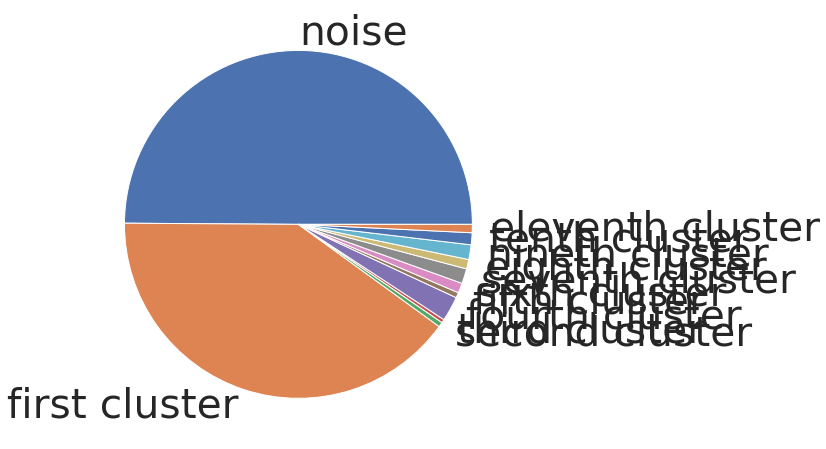

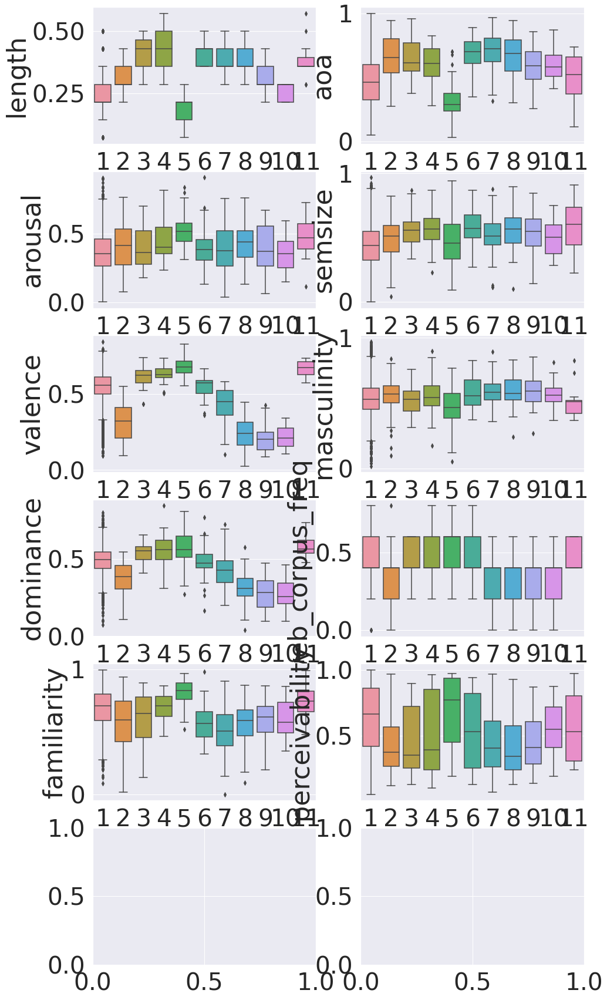

In [ ]:
scaled_dfprepro['cluster'] = dbscan.labels_

df_xminmax['cluster'] = dbscan.labels_

df_xminmax['cluster']=df_xminmax['cluster'].map({-1:'0',0:'1', 1:'2', 2:'3',3:'4',4:'5', 5:'6',6:'7', 7:'8', 8:'9',9:'10', 10:'11'})

df_xminmax_plot=df_xminmax.drop(["polysemy"], axis=1)

df_xminmax_plot = df_xminmax_plot.loc[df_xminmax["cluster"] != -1]


plt.figure(figsize = (8,8))


pie = df_xminmax_plot.groupby(['cluster']).size().to_frame().reset_index()
pie.rename(columns={0: 'count'}, inplace=True)

pie_labels = ['noise','first cluster', 'second cluster', 'third cluster','fourth cluster','fifth cluster','sixth cluster','seventh cluster','eighth cluster','nineth cluster','tenth cluster','eleventh cluster']
plt.pie(pie['count'], labels=pie_labels)
plt.show()

fig, axs = plt.subplots(ncols=2, nrows=6, figsize=(15,30))
for cols, x in zip(df_xminmax_plot.columns[:5], range(5)):
    for y in range(1):
        sb.boxplot(y=cols, x='cluster', data=df_xminmax_plot, order=['1', '2','3','4','5','6','7','8','9','10','11'], ax=axs[x,y], showfliers = True )

for cols, x in zip(df_xminmax_plot.columns[5:], range(5)):
    for y in range(1,2):
        sb.boxplot(y=cols, x='cluster', data=df_xminmax_plot, order=['1', '2','3','4','5','6','7','8','9','10','11'], ax=axs[x,y], showfliers = True )

In [ ]:
print('Silhouette', silhouette_score(Y_pca_minmax, dbscan.labels_))

Silhouette -0.34242476647615017


In [ ]:
print('Calinski-Harabasz', metrics.calinski_harabasz_score(Y_pca_minmax, dbscan.labels_))

Calinski-Harabasz 59.9496266793775


In [ ]:
df_perc.isnull().sum()

df_xminmax_plot['word']=df_perc['word']
df_xminmax_plot.loc[df_xminmax['cluster']=='First']

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,web_corpus_freq,perceivability,cluster,word


In [ ]:
df_xminmax_plot.loc[df_xminmax['cluster']=='Second']

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,web_corpus_freq,perceivability,cluster,word


In [ ]:
df_xminmax_plot.loc[df_xminmax['cluster']=='Third']

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,web_corpus_freq,perceivability,cluster,word


In [ ]:
df_xminmax_plot.loc[df_xminmax['cluster']=='Fourth']

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,web_corpus_freq,perceivability,cluster,word


In [ ]:
df_xminmax_plot.loc[df_xminmax['cluster']=='Fifth']

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,web_corpus_freq,perceivability,cluster,word


## 2.4    Analysis by hierarchical clustering

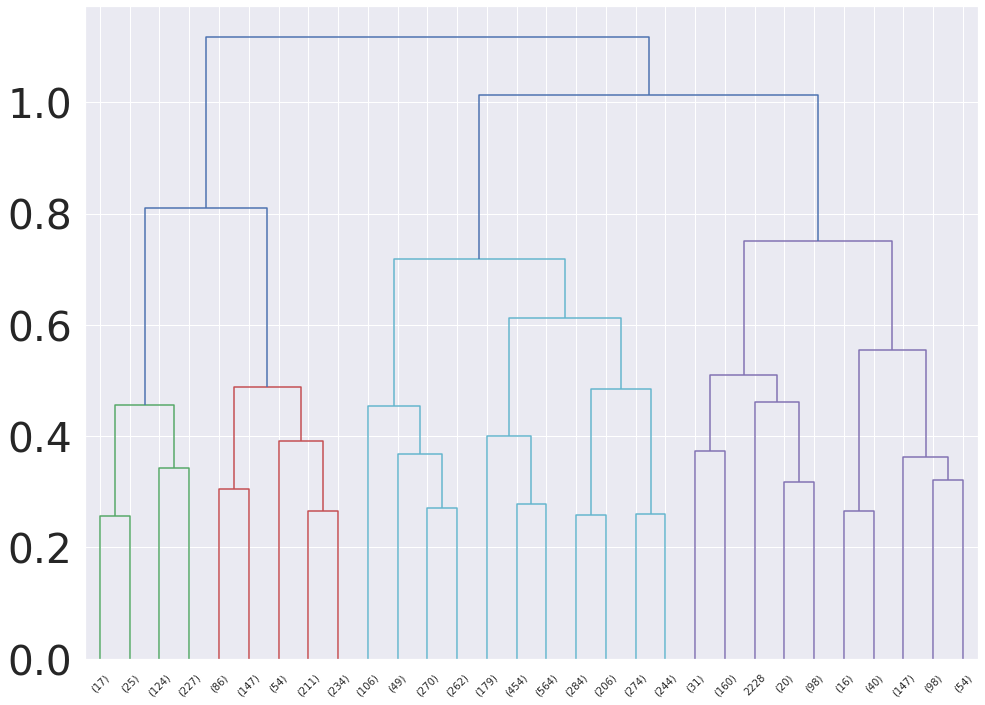

In [ ]:
data_dist = pdist(Y_pca_minmax, metric='euclidean')
data_link = linkage(data_dist, method='complete')

res = dendrogram(data_link, truncate_mode='lastp')

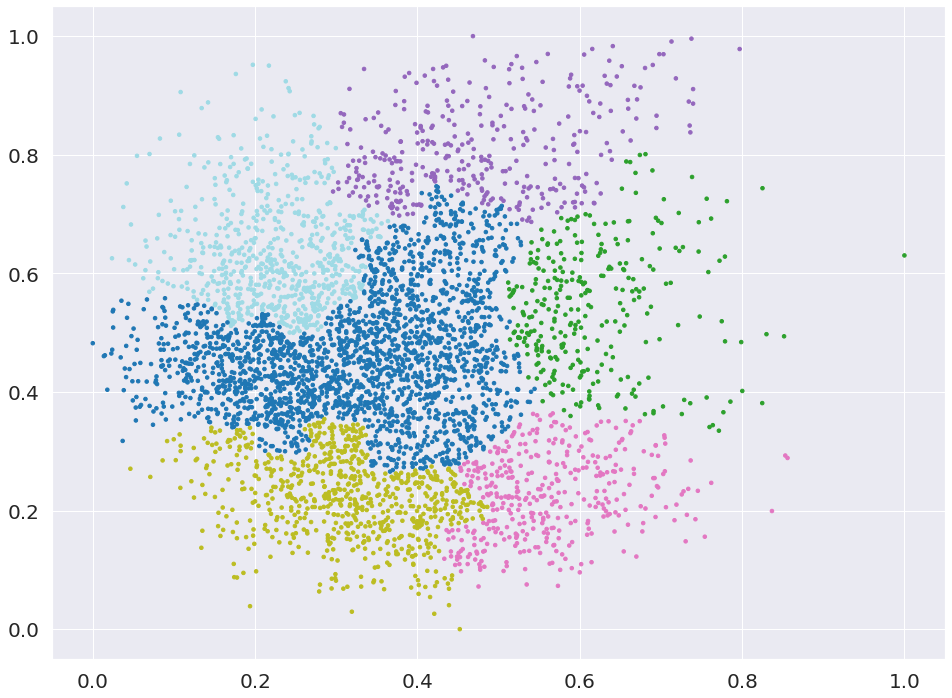

In [ ]:
hier = AgglomerativeClustering(n_clusters=6, affinity='euclidean', linkage='complete')
hier.fit(Y_pca_minmax)
hier.labels_
hier.n_clusters_
#hier.n_leaves_

plt.scatter( Y_pca_minmax[:,0], Y_pca_minmax[:,1],s=50, c= hier.labels_, marker='.', cmap = cm.tab20)

plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

plt.show()

In [ ]:
#Store the labels
labels = hier.labels_

#Then get the frequency count of the non-negative labels
counts = np.bincount(labels[labels>=0])

print (counts)


[2205  310  355  393  732  687]


In [ ]:
print('Silhouette', silhouette_score(Y_pca_minmax, hier.labels_))

Silhouette 0.21403647105170687


In [ ]:
print('Calinski-Harabasz', metrics.calinski_harabasz_score(Y_pca_minmax, hier.labels_))

Calinski-Harabasz 2074.84678178521


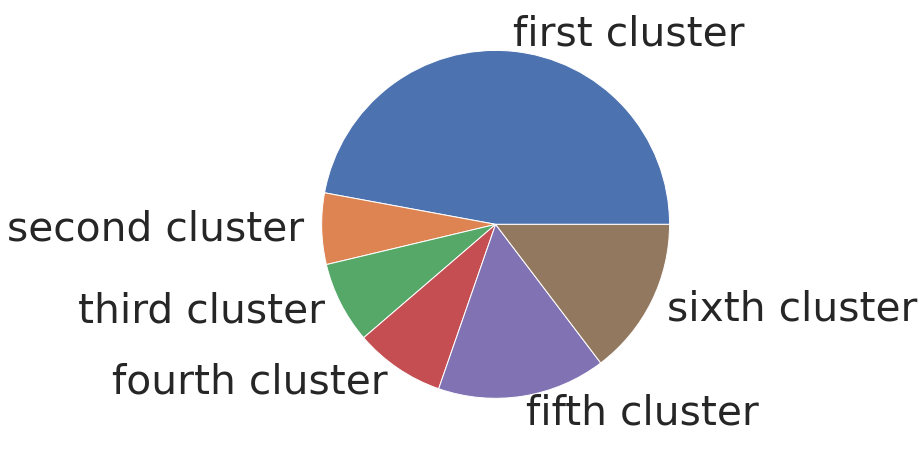

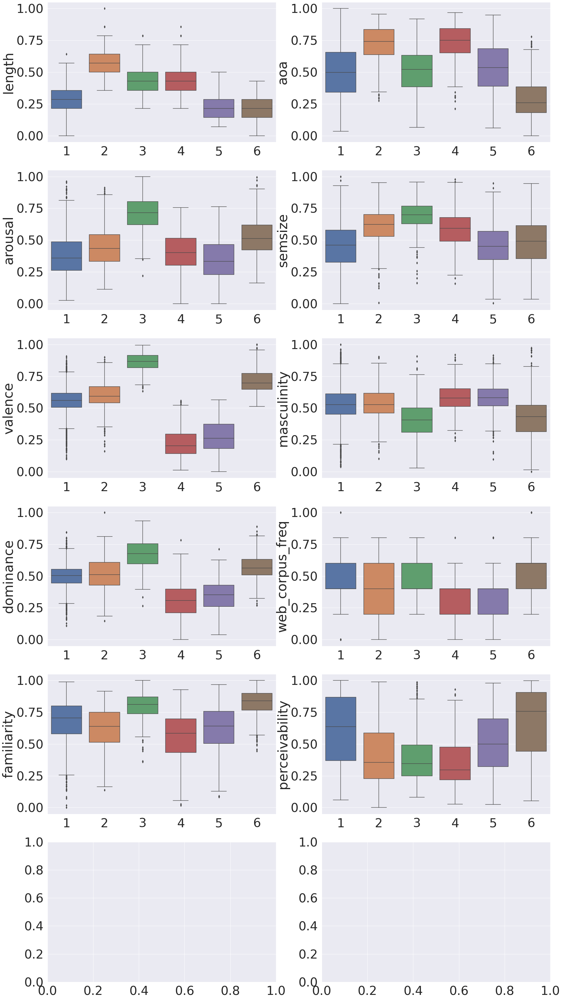

In [ ]:
scaled_dfprepro['cluster'] = hier.labels_

df_xminmax['cluster'] = hier.labels_

df_xminmax['cluster']=df_xminmax['cluster'].map({0:'1', 1:'2', 2:'3',3:'4', 4:'5', 5:'6'})

df_xminmax_plot=df_xminmax.drop(["polysemy"], axis=1)

plt.figure(figsize = (8,8))
pie = scaled_dfprepro.groupby(['cluster']).size().to_frame().reset_index()
pie.rename(columns={0: 'count'}, inplace=True)

pie_labels = ['first cluster', 'second cluster', 'third cluster','fourth cluster', 'fifth cluster', 'sixth cluster']
plt.pie(pie['count'], labels=pie_labels)
plt.show()
sb.set(font_scale=3.7)


fig, axs = plt.subplots(ncols=2, nrows=6, figsize=(30,60))
for cols, x in zip(df_xminmax_plot.columns[:5], range(5)):
    for y in range(1):
        g1=sb.boxplot(y=cols, x='cluster', data=df_xminmax_plot, order=['1', '2','3','4', '5','6'], ax=axs[x,y], showfliers = True )
        g1.set(xlabel=None)


for cols, x in zip(df_xminmax_plot.columns[5:], range(5)):
    for y in range(1,2):
        g2=sb.boxplot(y=cols, x='cluster', data=df_xminmax_plot, order=['1', '2','3','4', '5','6'], ax=axs[x,y], showfliers = True )
        g2.set(xlabel=None)


In [ ]:
df_perc.isnull().sum()

df_xminmax_plot['word']=df_perc['word']


In [ ]:
df_xminmax_plot.loc[df_xminmax['cluster']=='First']


,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,web_corpus_freq,perceivability,cluster,word


In [ ]:
df_xminmax_plot.loc[df_xminmax['cluster']=='Second']


,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,web_corpus_freq,perceivability,cluster,word


In [ ]:

df_xminmax_plot.loc[df_xminmax['cluster']=='Third']



,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,web_corpus_freq,perceivability,cluster,word


In [ ]:
df_xminmax_plot.loc[df_xminmax['cluster']=='Fourth']

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,web_corpus_freq,perceivability,cluster,word


In [ ]:
df_xminmax_plot.loc[df_xminmax['cluster']=='Fifth']

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,web_corpus_freq,perceivability,cluster,word


In [ ]:
# non serve ora 
#hier = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
#hier.fit(Y_pca_minmax)
#hier.labels_


#fig = plt.figure()
#ax = fig.add_subplot(111, projection='3d')

#ax.scatter(Y_pca_minmax[:,0], Y_pca_minmax[:,1], Y_pca_minmax[:,2], s=5, c= hier.labels_, marker='.')


#ax.plot3D(Yemo[:,1], Yemo[:,2], Yemo[:,3], c= hier.labels_, marker='.')

#plt.scatter( Yemo[:,1], Yemo[:,2], s=50, c= hier.labels_, marker='.' )



#plt.show()

## 2.5   Final Discussion

#3 Classification

## 3.1 Classification by Decision Trees

In [ ]:
# per il decision tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

# visualizzarlo
from sklearn import tree
import pydotplus 
from IPython.display import Image 

# evaluazione
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score

# hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
# cross-validation
from sklearn.model_selection import cross_val_score

In [ ]:
df_class= dfprepro.copy()
df_class.head()

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability
0,8,4.200,2.864,4.333,2.382,6.760,4.652,5.391,0,5.0,4.9230
1,5,3.125,5.781,4.667,3.324,5.177,5.121,3.303,0,6.0,5.6250
2,10,3.273,5.250,5.235,5.121,5.543,2.667,3.971,0,5.0,3.2315
3,8,4.194,3.767,4.419,3.971,6.233,4.679,5.167,0,5.0,2.9415
4,10,3.846,3.880,4.800,3.097,6.407,5.083,4.571,0,5.0,2.9315


In [ ]:
attributes = [col for col in df_class.columns if col != 'polysemy']
X = df_class[attributes].values
y = df_class['polysemy']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=100)

len(df_class), X_train.shape[0], X_test.shape[0]

(4682, 3277, 1405)

In [ ]:
X_train.shape, X_test.shape

((3277, 10), (1405, 10))

In [ ]:
clf = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1)
clf.fit(X_train, y_train)

DecisionTreeClassifier()

In [ ]:
for col, imp in zip(attributes, clf.feature_importances_): print(col, imp)

length 0.07921529222712845
arousal 0.10707368272885229
valence 0.0955854527681356
dominance 0.12345386186225976
familiarity 0.1131051588586401
aoa 0.10922341363043479
semsize 0.10343533635767627
masculinity 0.10334263776768145
web_corpus_freq 0.024459922367955262
perceivability 0.1411052414312361


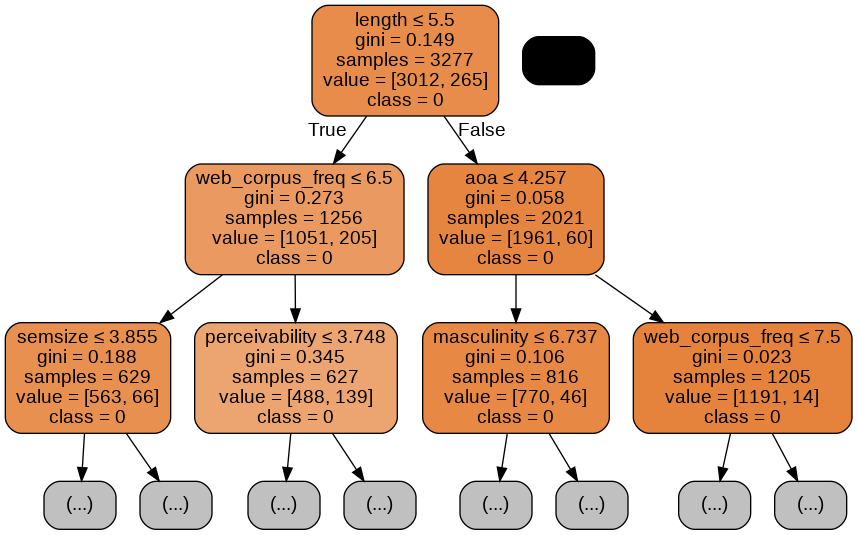

In [ ]:
dot_data = tree.export_graphviz (clf, out_file=None,
                                feature_names=attributes,
                                class_names=[str(v) for v in clf.classes_],
                                filled=True, rounded=True,
                                special_characters=True,
                                max_depth=2)

graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [ ]:
# apply decision tree to train set
y_pred = clf.predict(X_train)
y_pred[:5]

array([0, 1, 0, 0, 0])

In [ ]:
y_train.values[:5]

array([0, 1, 0, 0, 0])

In [ ]:
print('Accuracy', accuracy_score(y_train, y_pred))
print('F1', f1_score(y_train, y_pred, average=None))

Accuracy 1.0
F1 [1. 1.]


In [ ]:
print( classification_report(y_train, y_pred) )

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3012
           1       1.00      1.00      1.00       265

    accuracy                           1.00      3277
   macro avg       1.00      1.00      1.00      3277
weighted avg       1.00      1.00      1.00      3277



In [ ]:
# Confusion matrix for trainset
# TP, FN, FP, TN
confusion_matrix(y_train, y_pred)

array([[3012,    0],
       [   0,  265]])

In [ ]:
# apply decision tree to test set
y_pred = clf.predict(X_test)

In [ ]:
print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))
confusion_matrix(y_test, y_pred)

Accuracy 0.8597864768683274
F1-score [0.92325672 0.18930041]
              precision    recall  f1-score   support

           0       0.93      0.92      0.92      1291
           1       0.18      0.20      0.19       114

    accuracy                           0.86      1405
   macro avg       0.55      0.56      0.56      1405
weighted avg       0.87      0.86      0.86      1405



array([[1185,  106],
       [  91,   23]])

In [ ]:
y_score = clf.predict_proba(X_test)


In [ ]:
fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

0.5598237460420998


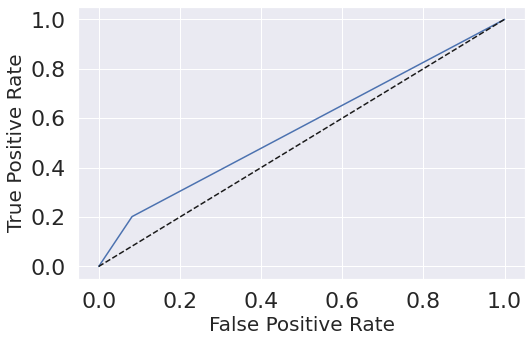

In [ ]:
plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

## Preprocess

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.model_selection import cross_val_score

In [ ]:
dfprepro.head()

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability
0,8,4.200,2.864,4.333,2.382,6.760,4.652,5.391,0,5.0,4.9230
1,5,3.125,5.781,4.667,3.324,5.177,5.121,3.303,0,6.0,5.6250
2,10,3.273,5.250,5.235,5.121,5.543,2.667,3.971,0,5.0,3.2315
3,8,4.194,3.767,4.419,3.971,6.233,4.679,5.167,0,5.0,2.9415
4,10,3.846,3.880,4.800,3.097,6.407,5.083,4.571,0,5.0,2.9315


In [ ]:
df_class_ref = dfprepro.copy()
#dataframe = [df_class_ref]
#for dataset in dataframe:
#    dataset.loc[(dataset["aoa"] > 1) & (dataset["aoa"] <= 2), "aoa"] = 1
#    dataset.loc[(dataset["aoa"] > 2)& (dataset["aoa"] <= 3), "aoa"] = 2
#    dataset.loc[(dataset["aoa"] > 3)& (dataset["aoa"] <= 4), "aoa"] = 3
#    dataset.loc[(dataset["aoa"] > 4)& (dataset["aoa"] <= 5), "aoa"] = 4
#    dataset.loc[(dataset["aoa"] > 5)& (dataset["aoa"] <= 6), "aoa"] = 5
#    dataset.loc[(dataset["aoa"] > 6)&( dataset["aoa"] <= 7), "aoa"] = 6
#    dataset.loc[(dataset["aoa"] > 7), "aoa"] = 7
#df_class_ref.head()

In [ ]:
var_to_scale=['aoa',"arousal","valence","dominance","familiarity","semsize","masculinity","perceivability"]

features = df_class_ref[var_to_scale]
scaler = MinMaxScaler().fit(features.values)
features = scaler.transform(features.values)

df_class_ref[var_to_scale] = features
df_class_ref.head()

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability
0,8,0.350163,0.240777,0.372006,0.138889,0.963317,0.591837,0.735388,0,5.0,0.609099
1,5,0.174510,0.623736,0.423950,0.316893,0.688108,0.676540,0.385698,0,6.0,0.746168
2,10,0.198693,0.554024,0.512286,0.656463,0.751739,0.233339,0.497572,0,5.0,0.278825
3,8,0.349183,0.359328,0.385381,0.439153,0.871697,0.596713,0.697873,0,5.0,0.222201
4,10,0.292320,0.374163,0.444635,0.273998,0.901947,0.669677,0.598057,0,5.0,0.220248


### Arousal

In [ ]:
refvar="arousal"
taglio=0.55

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

[Text(534.7704919477663, 399.546, 'valence <= 0.698\ngini = 0.372\nsamples = 3511\nvalue = [2645, 866]\nclass = not aroused'),
 Text(355.33135788018956, 383.238, 'semsize <= 0.638\ngini = 0.25\nsamples = 2829\nvalue = [2414, 415]\nclass = not aroused'),
 Text(185.56261986687727, 366.93, 'semsize <= 0.496\ngini = 0.164\nsamples = 2299\nvalue = [2092, 207]\nclass = not aroused'),
 Text(95.9751029444946, 350.62199999999996, 'masculinity <= 0.369\ngini = 0.101\nsamples = 1542\nvalue = [1460, 82]\nclass = not aroused'),
 Text(29.20938628158845, 334.31399999999996, 'semsize <= 0.366\ngini = 0.25\nsamples = 171\nvalue = [146, 25]\nclass = not aroused'),
 Text(16.115523465703973, 318.006, 'valence <= 0.654\ngini = 0.142\nsamples = 117\nvalue = [108, 9]\nclass = not aroused'),
 Text(8.057761732851986, 301.698, 'web_corpus_freq <= 5.5\ngini = 0.063\nsamples = 92\nvalue = [89, 3]\nclass = not aroused'),
 Text(4.028880866425993, 285.39, 'aoa <= 0.251\ngini = 0.231\nsamples = 15\nvalue = [13, 2]\nc

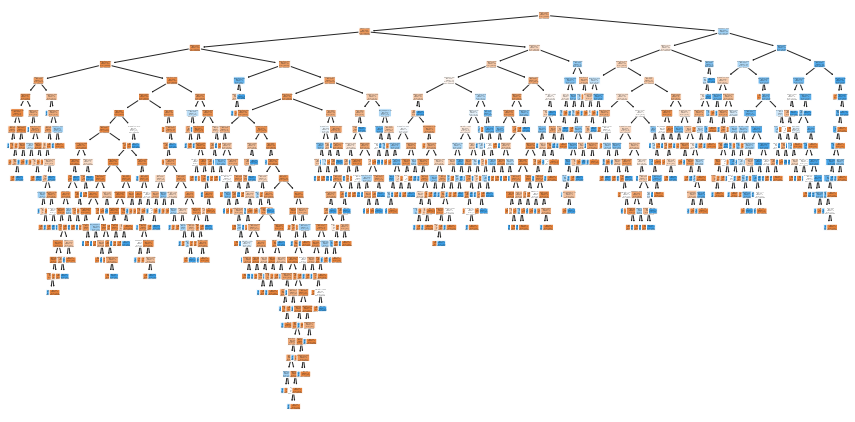

In [ ]:
plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt,
          filled=True,
          rounded=True,
          class_names=["not aroused","aroused"],
          feature_names=X.columns)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


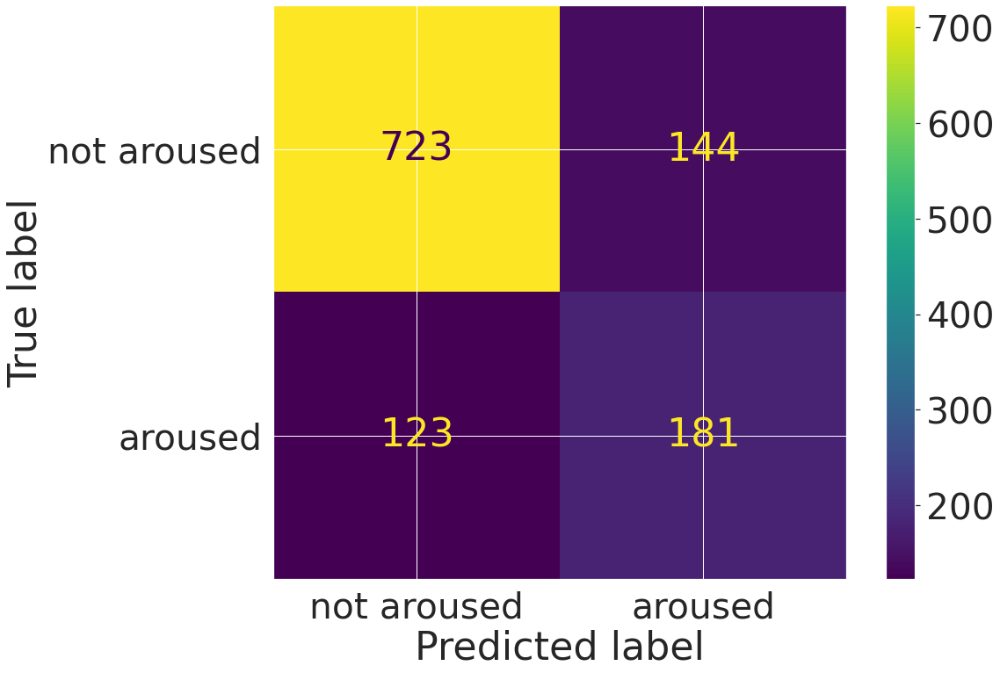

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.model_selection import cross_val_score

plot_confusion_matrix(clf_dt, X_test, y_test, display_labels=["not aroused","aroused"])

Accuracy 0.7719897523484202
F1-score [0.8441331  0.57551669]
              precision    recall  f1-score   support

         0.0       0.85      0.83      0.84       867
         1.0       0.56      0.60      0.58       304

    accuracy                           0.77      1171
   macro avg       0.71      0.71      0.71      1171
weighted avg       0.78      0.77      0.77      1171

0.7146523857220907


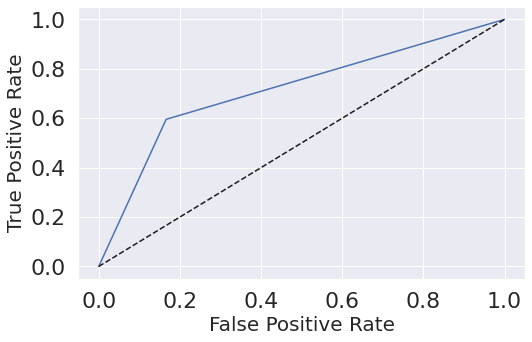

In [ ]:
y_pred = clf_dt.predict(X_train)
y_pred = clf_dt.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

y_score = clf_dt.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

In [ ]:
path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

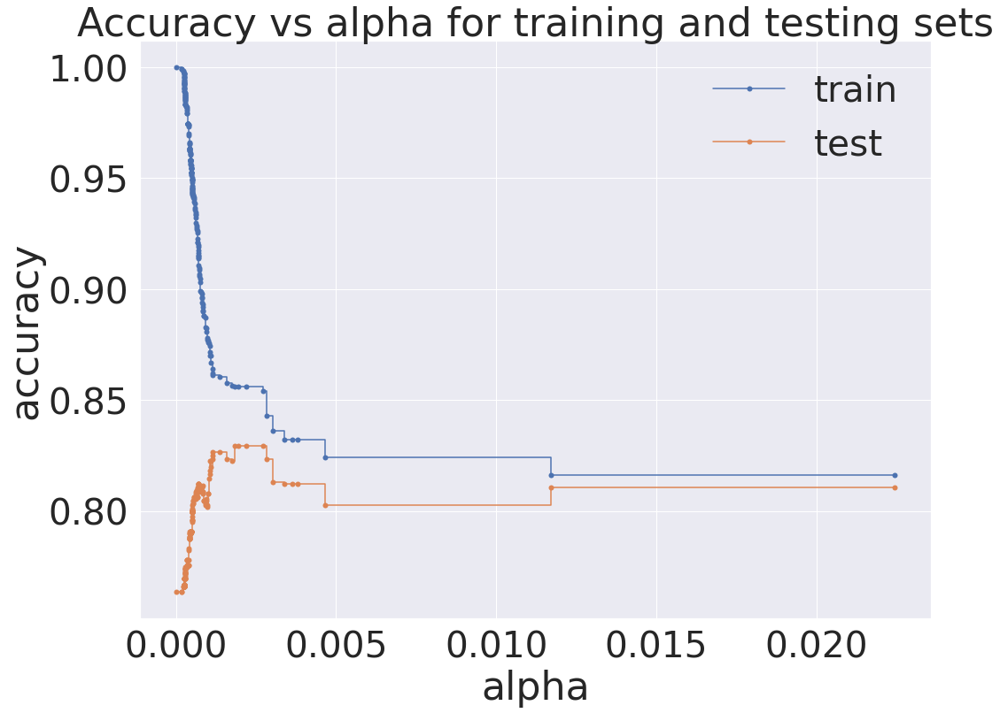

In [ ]:
train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

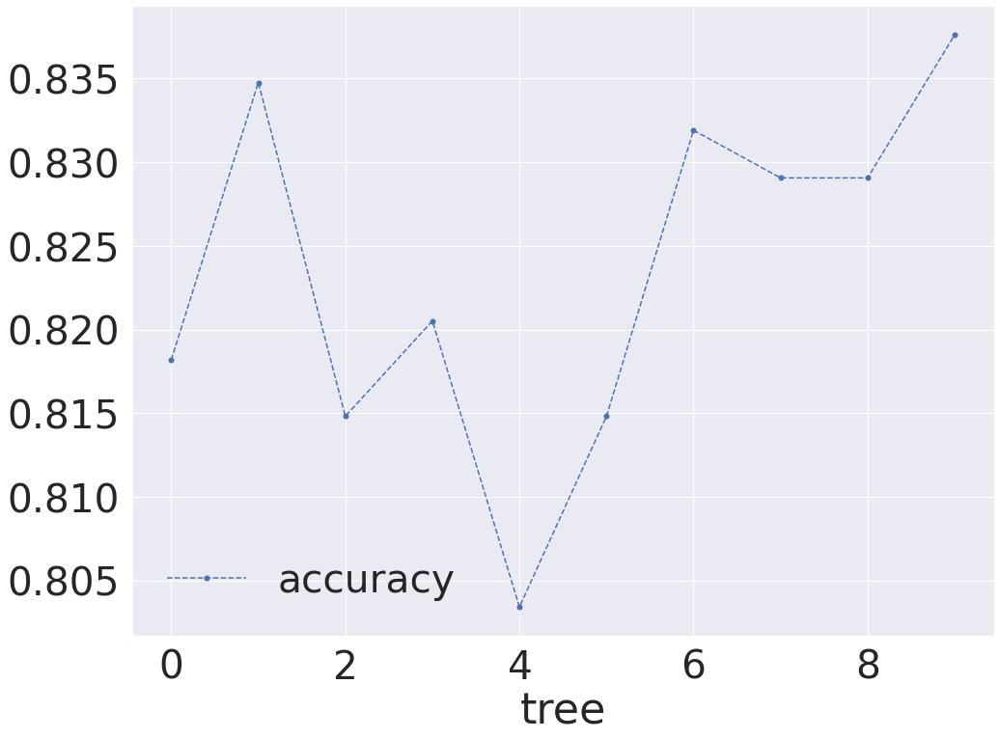

In [ ]:
clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=0.003)

scores= cross_val_score(clf_dt,X_train,y_train, cv=10)

df=pd.DataFrame(data={'tree':range(10), 'accuracy':scores})

df.plot(x='tree', y='accuracy',marker='o',linestyle='--')


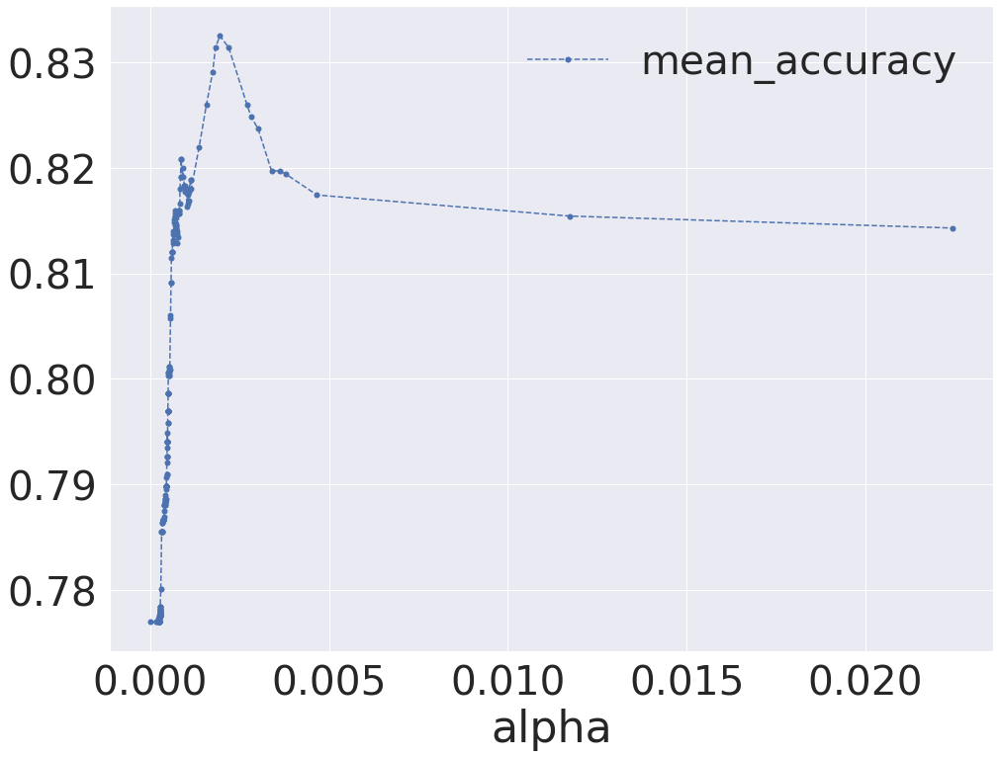

In [ ]:
alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   marker='o',
                   linestyle='--')


In [ ]:
alpha_results[(alpha_results['alpha']>0.0025)
&
(alpha_results['alpha']<0.005)]

,alpha,mean_accuracy,std
201,0.002712,0.825980,0.012110
202,0.002828,0.824838,0.009346
203,0.003022,0.823699,0.010039
204,0.003397,0.819710,0.015653
205,0.003625,0.819710,0.014745
206,0.003792,0.819425,0.014533
207,0.004665,0.817431,0.014101


In [ ]:
ideal_ccp_alpha = 0.003242

In [ ]:
clf_dt_pruned = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


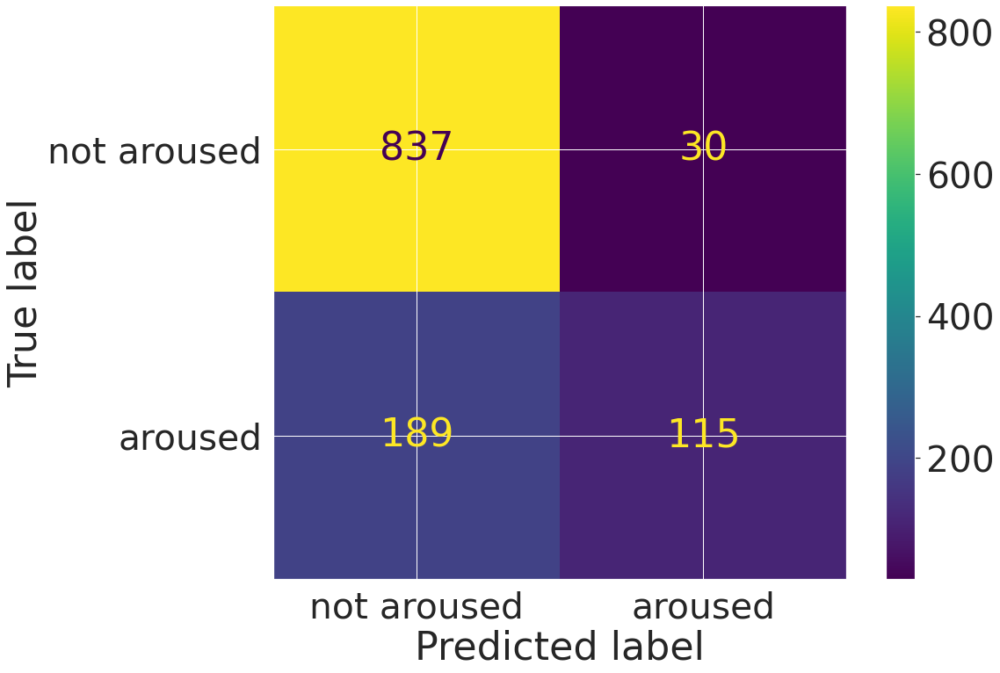

In [ ]:
plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['not aroused','aroused'])

[Text(453.375, 366.93, 'valence <= 0.698\ngini = 0.372\nsamples = 3511\nvalue = [2645, 866]\nclass = not aroused'),
 Text(279.0, 285.39, 'semsize <= 0.638\ngini = 0.25\nsamples = 2829\nvalue = [2414, 415]\nclass = not aroused'),
 Text(139.5, 203.85000000000002, 'semsize <= 0.496\ngini = 0.164\nsamples = 2299\nvalue = [2092, 207]\nclass = not aroused'),
 Text(69.75, 122.31, 'gini = 0.101\nsamples = 1542\nvalue = [1460, 82]\nclass = not aroused'),
 Text(209.25, 122.31, 'gini = 0.276\nsamples = 757\nvalue = [632, 125]\nclass = not aroused'),
 Text(418.5, 203.85000000000002, 'dominance <= 0.608\ngini = 0.477\nsamples = 530\nvalue = [322, 208]\nclass = not aroused'),
 Text(348.75, 122.31, 'valence <= 0.402\ngini = 0.452\nsamples = 460\nvalue = [301, 159]\nclass = not aroused'),
 Text(279.0, 40.77000000000004, 'gini = 0.499\nsamples = 244\nvalue = [128, 116]\nclass = not aroused'),
 Text(418.5, 40.77000000000004, 'gini = 0.319\nsamples = 216\nvalue = [173, 43]\nclass = not aroused'),
 Text(4

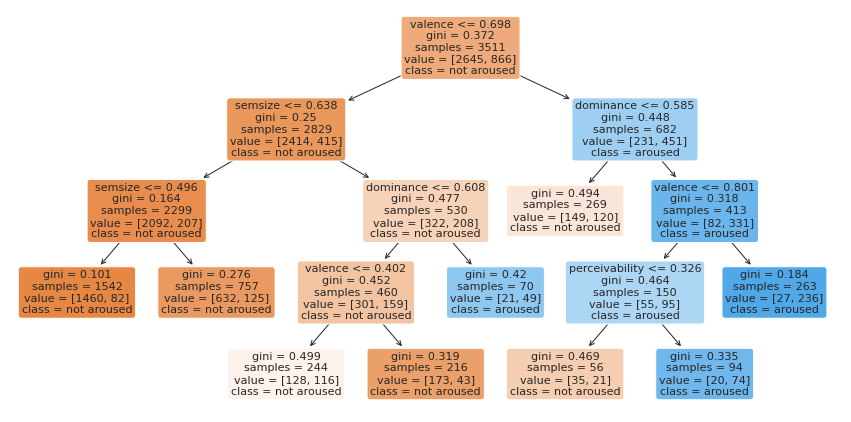

In [ ]:
plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=["not aroused","aroused"],
          feature_names=X.columns)

Accuracy 0.8129803586678053
F1-score 0.7877208681457515
              precision    recall  f1-score   support

         0.0       0.82      0.97      0.88       867
         1.0       0.79      0.38      0.51       304

    accuracy                           0.81      1171
   macro avg       0.80      0.67      0.70      1171
weighted avg       0.81      0.81      0.79      1171

0.8427881988708796


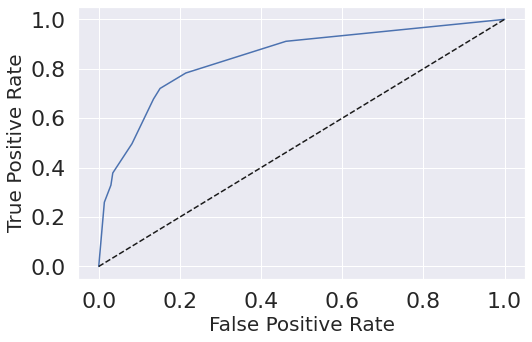

In [ ]:
y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred,average='weighted'))
print(classification_report(y_test, y_pred))

y_score = clf_dt_pruned.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Valence

In [ ]:
refvar="valence"
taglio=0.67

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

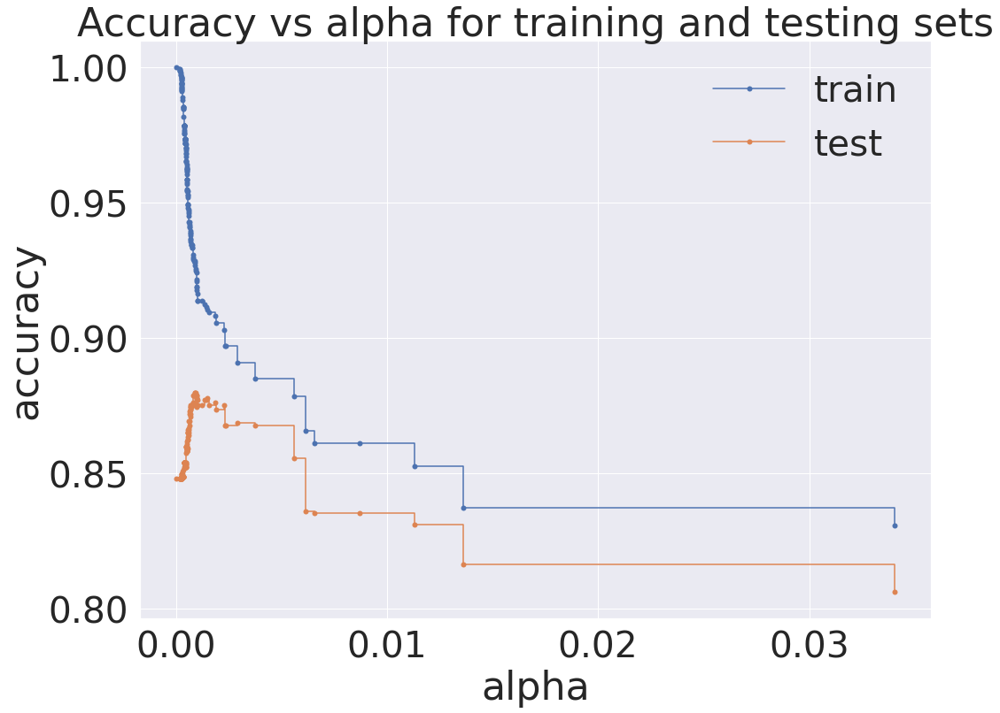

In [ ]:
path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

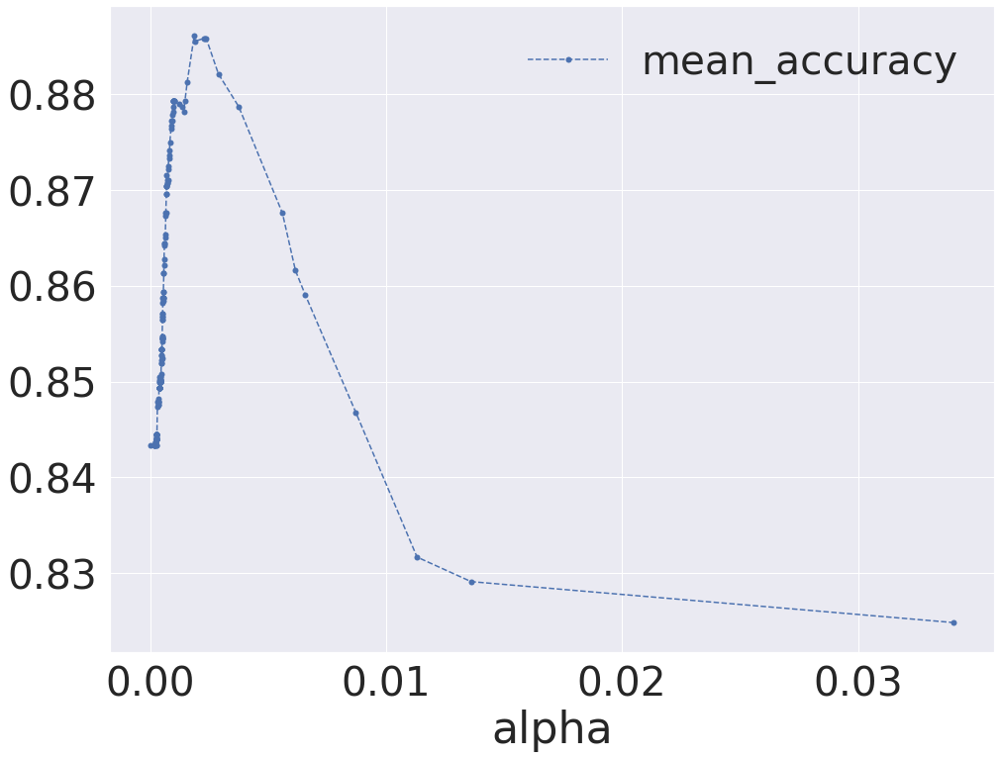

In [ ]:
alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=0, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   marker='o',
                   linestyle='--')


In [ ]:
alpha_results[(alpha_results['alpha']>0.0018)
&
(alpha_results['alpha']<0.0028)]

,alpha,mean_accuracy,std
140,0.001872,0.886080,0.017318
141,0.001910,0.885510,0.016445
142,0.002273,0.885795,0.016721
143,0.002309,0.885795,0.016721
144,0.002383,0.885795,0.016721


[Text(397.575, 378.5785714285714, 'dominance <= 0.595\ngini = 0.354\nsamples = 3511\nvalue = [2703, 808]\nclass = not val'),
 Text(167.4, 320.3357142857143, 'masculinity <= 0.35\ngini = 0.225\nsamples = 2845\nvalue = [2477, 368]\nclass = not val'),
 Text(83.7, 262.09285714285716, 'arousal <= 0.35\ngini = 0.497\nsamples = 321\nvalue = [149, 172]\nclass = val'),
 Text(41.85, 203.85, 'gini = 0.313\nsamples = 72\nvalue = [58, 14]\nclass = not val'),
 Text(125.55000000000001, 203.85, 'dominance <= 0.52\ngini = 0.464\nsamples = 249\nvalue = [91, 158]\nclass = val'),
 Text(83.7, 145.60714285714283, 'aoa <= 0.287\ngini = 0.5\nsamples = 142\nvalue = [69, 73]\nclass = val'),
 Text(41.85, 87.3642857142857, 'gini = 0.289\nsamples = 40\nvalue = [7, 33]\nclass = val'),
 Text(125.55000000000001, 87.3642857142857, 'gini = 0.477\nsamples = 102\nvalue = [62, 40]\nclass = not val'),
 Text(167.4, 145.60714285714283, 'gini = 0.327\nsamples = 107\nvalue = [22, 85]\nclass = val'),
 Text(251.10000000000002, 2

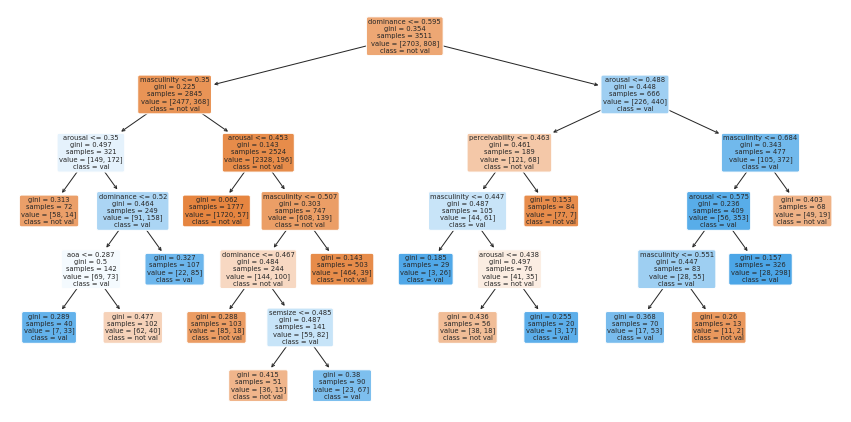

In [ ]:
ideal_ccp_alpha = 0.002084

ideal_ccp_alpha = float(ideal_ccp_alpha)

clf_dt_pruned = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=["not val","val"],
          feature_names=X.columns)


Accuracy 0.8736122971818958
F1-score 0.8681346409232079
              precision    recall  f1-score   support

         0.0       0.88      0.95      0.92       864
         1.0       0.83      0.65      0.73       307

    accuracy                           0.87      1171
   macro avg       0.86      0.80      0.82      1171
weighted avg       0.87      0.87      0.87      1171

0.8893394106647363


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


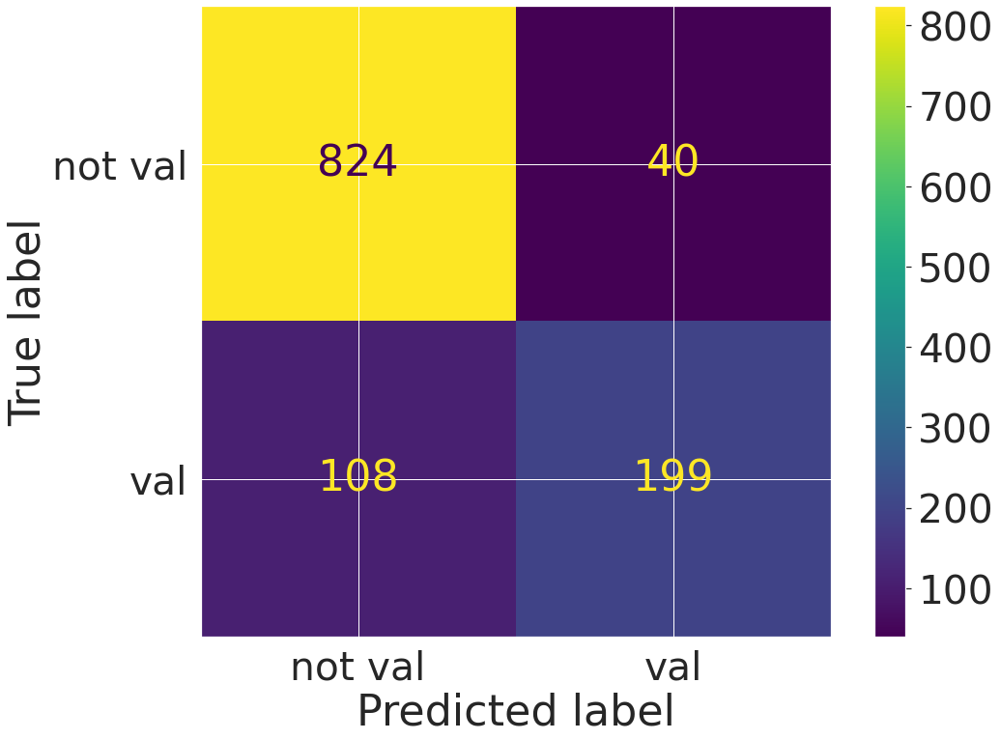

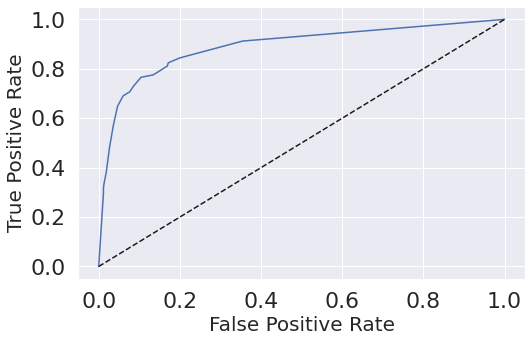

In [ ]:
y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred,average='weighted'))
print(classification_report(y_test, y_pred))

y_score = clf_dt_pruned.predict_proba(X_test)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['not val','val'])


fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Dominance



In [ ]:
refvar="dominance"
taglio=0.57

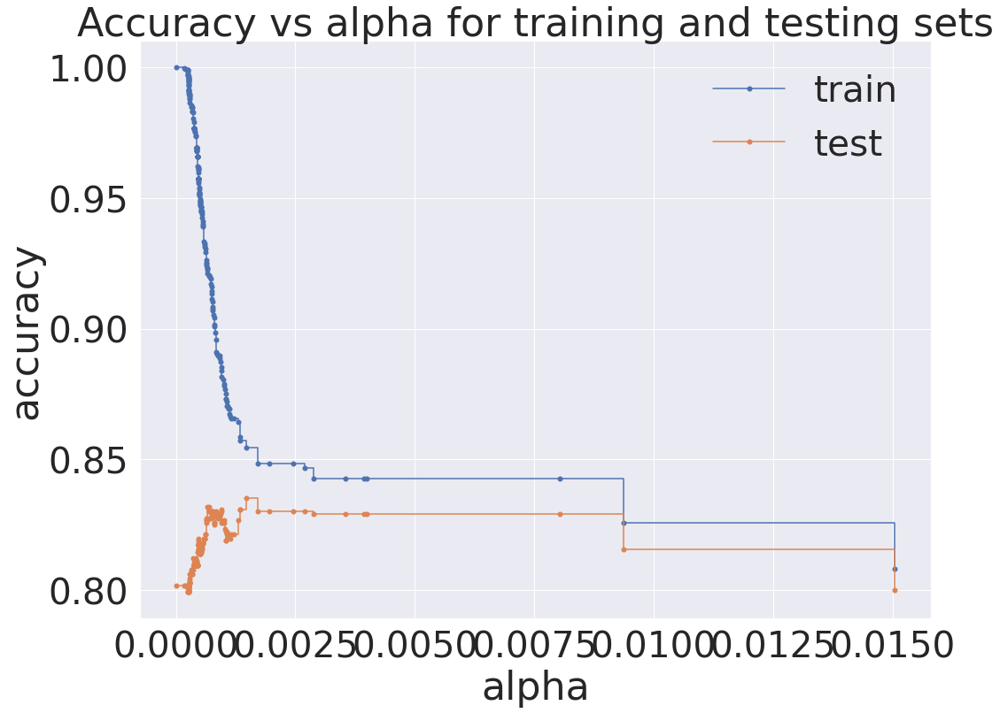

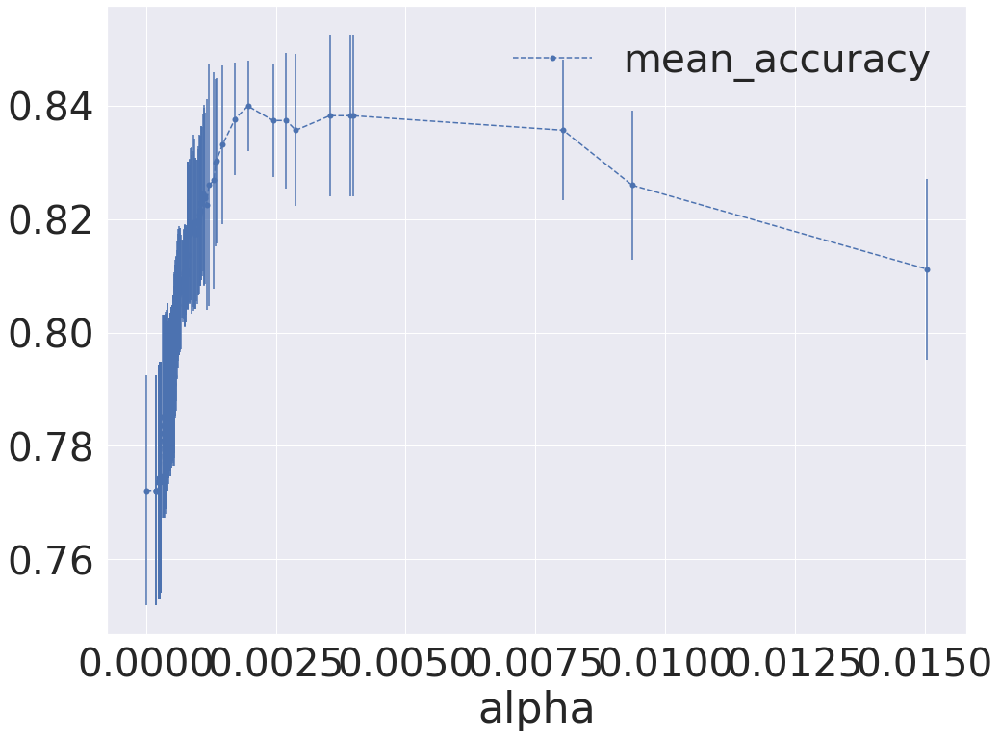

In [ ]:
X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   yerr='std',
                   marker='o',
                   linestyle='--')


In [ ]:
alpha_results[(alpha_results['alpha']>0.0018)
&
(alpha_results['alpha']<0.0041)]

,alpha,mean_accuracy,std
197,0.001963,0.839931,0.007957
198,0.002448,0.837366,0.010027
199,0.002703,0.837364,0.011967
200,0.002885,0.835655,0.013418
201,0.003540,0.838219,0.014275
202,0.003945,0.838219,0.014275
203,0.003988,0.838219,0.014275


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Accuracy 0.8300597779675492
F1-score 0.6223908918406071
              precision    recall  f1-score   support

         0.0       0.86      0.92      0.89       879
         1.0       0.70      0.56      0.62       292

    accuracy                           0.83      1171
   macro avg       0.78      0.74      0.76      1171
weighted avg       0.82      0.83      0.82      1171

0.8587416429005564


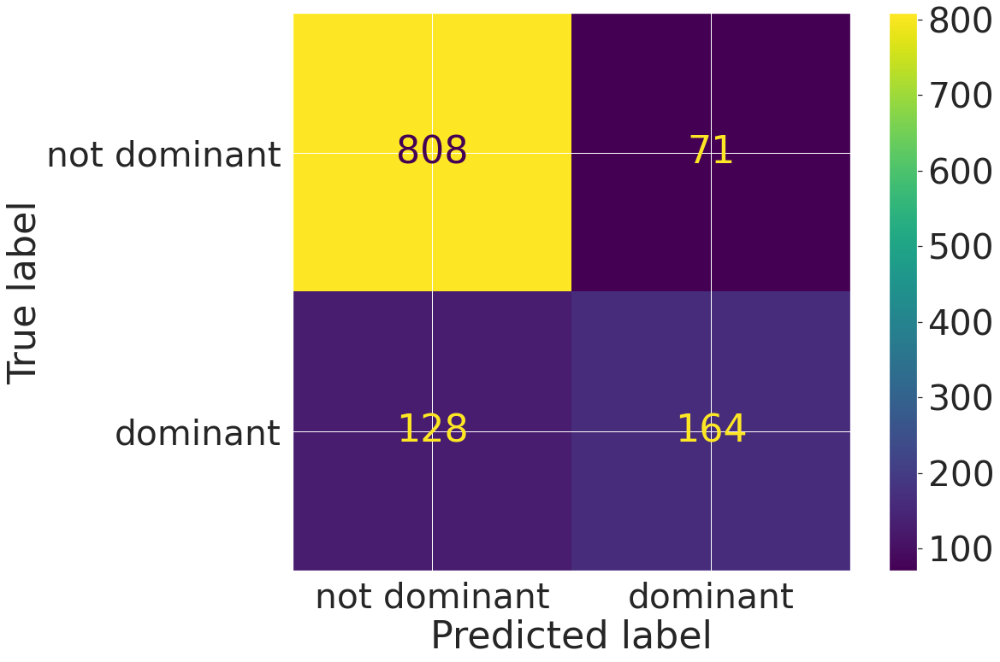

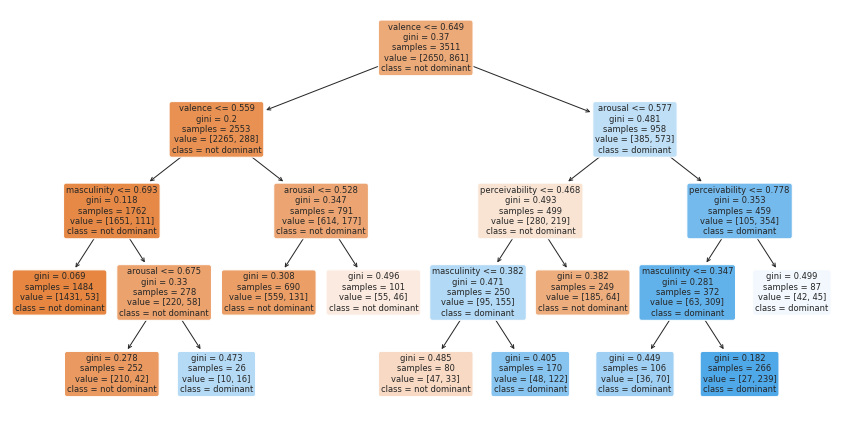

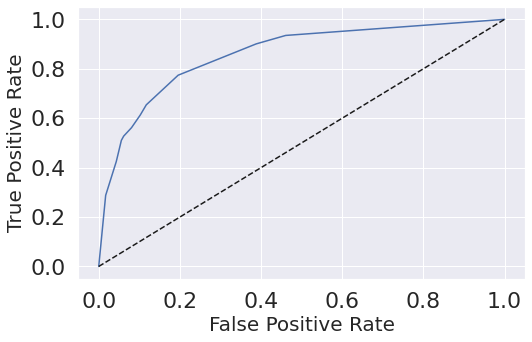

In [ ]:
ideal_ccp_alpha = 0.001963

ideal_ccp_alpha = float(ideal_ccp_alpha)

clf_dt_pruned = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['not dominant','dominant'])

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=["not dominant","dominant"],
          feature_names=X.columns)

y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

y_score = clf_dt_pruned.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Familiarity

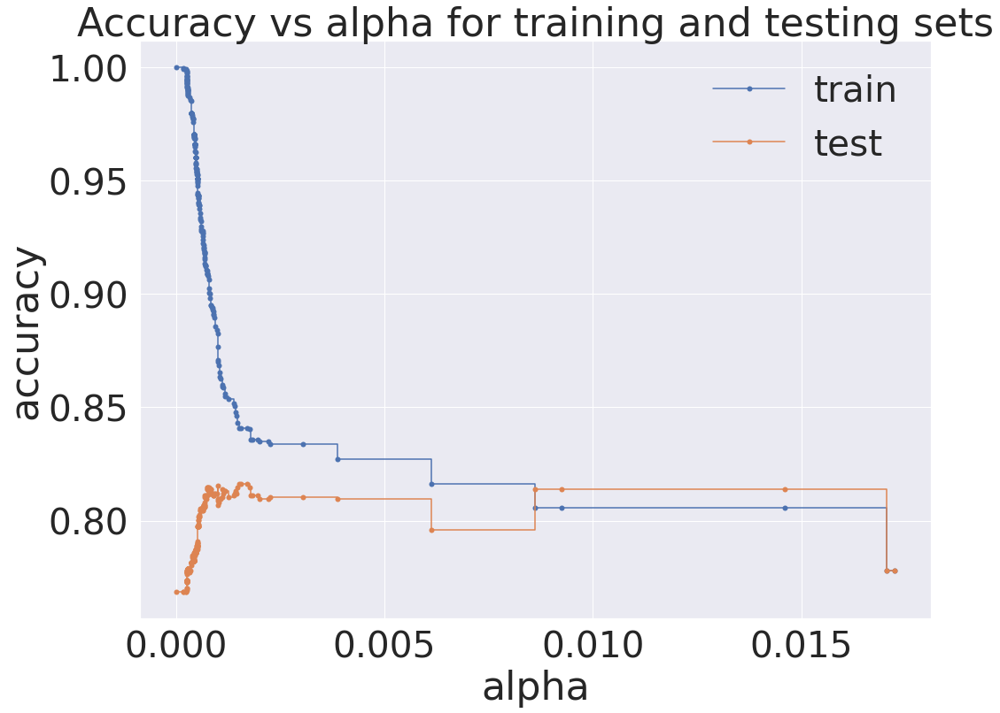

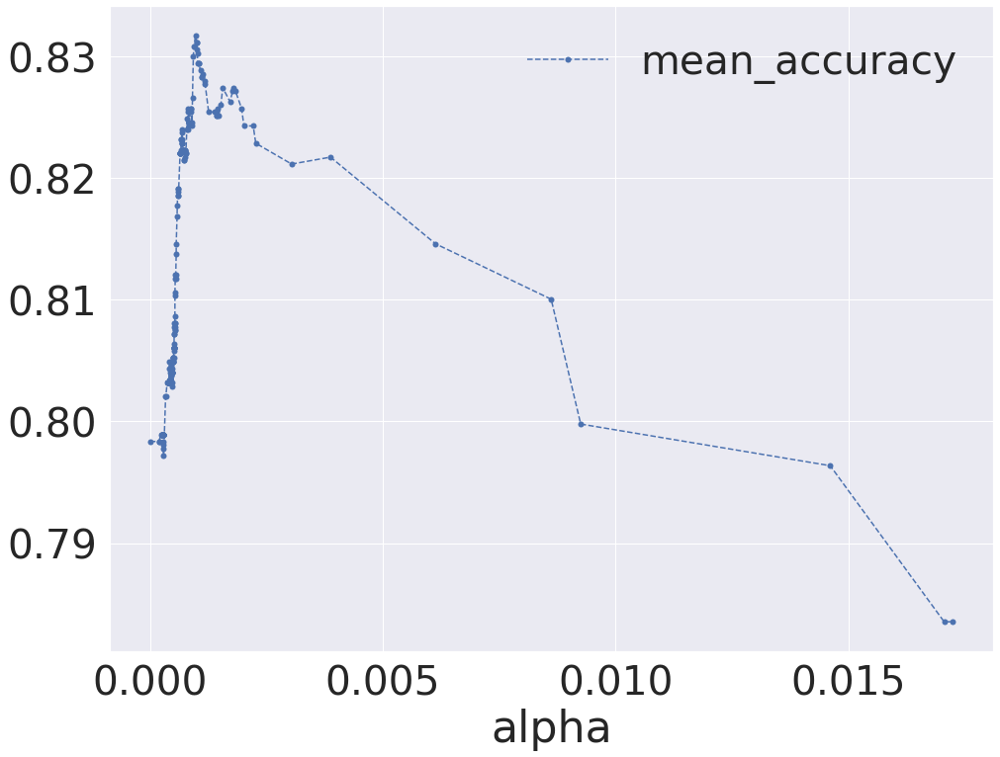

In [ ]:
refvar="familiarity"
taglio=0.6

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=0, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   marker='o',
                   linestyle='--')


In [ ]:
alpha_results[(alpha_results['alpha']>0.0009)
&
(alpha_results['alpha']<0.0011)]

,alpha,mean_accuracy,std
182,0.000904,0.824559,0.022300
183,0.000911,0.826553,0.021298
184,0.000930,0.829968,0.019192
185,0.000944,0.830822,0.018603
186,0.000977,0.831677,0.019085
187,0.001006,0.831108,0.018665
188,0.001008,0.831108,0.018665
189,0.001015,0.830539,0.018191
190,0.001017,0.830254,0.018189
191,0.001020,0.829399,0.017752


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Accuracy 0.8121263877028181
F1-score 0.8692033293697977
              precision    recall  f1-score   support

         0.0       0.64      0.69      0.67       317
         1.0       0.88      0.86      0.87       854

    accuracy                           0.81      1171
   macro avg       0.76      0.77      0.77      1171
weighted avg       0.82      0.81      0.81      1171

0.8300814870086215


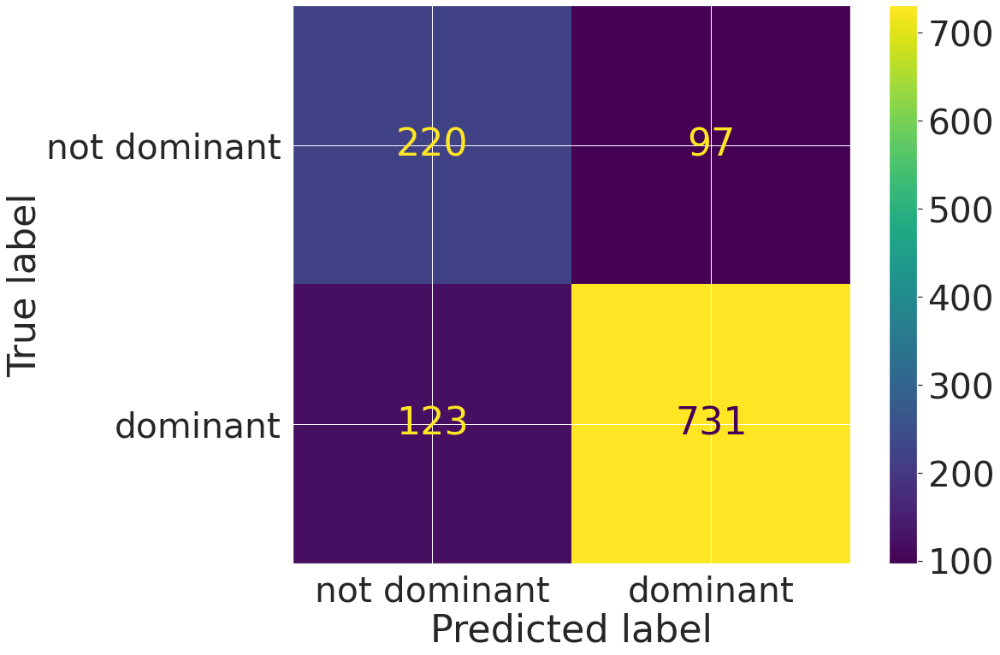

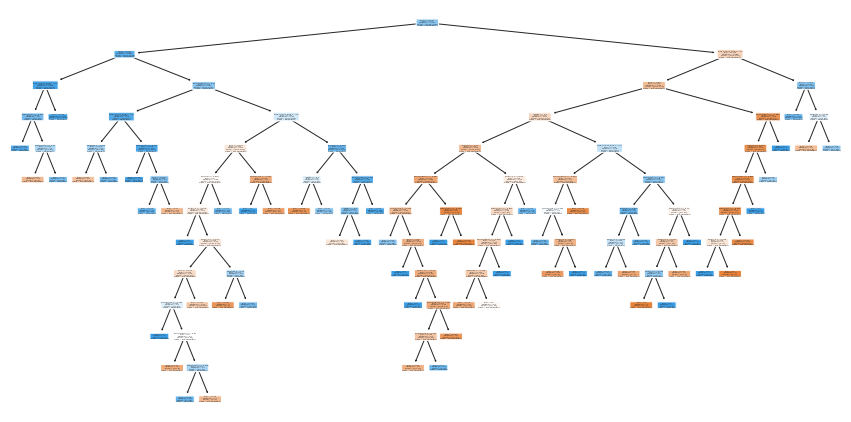

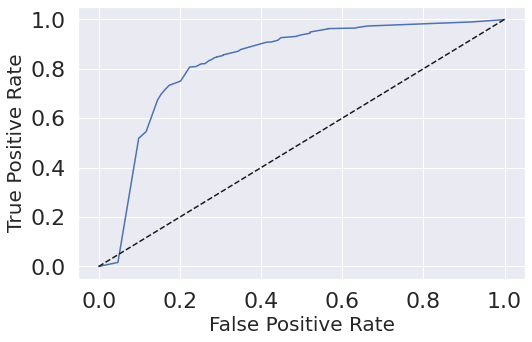

In [ ]:
ideal_ccp_alpha = 0.000977

ideal_ccp_alpha = float(ideal_ccp_alpha)

clf_dt_pruned = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['not dominant','dominant'])

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=["not valueable","valueable"],
          feature_names=X.columns)

y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

y_score = clf_dt_pruned.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Semsize

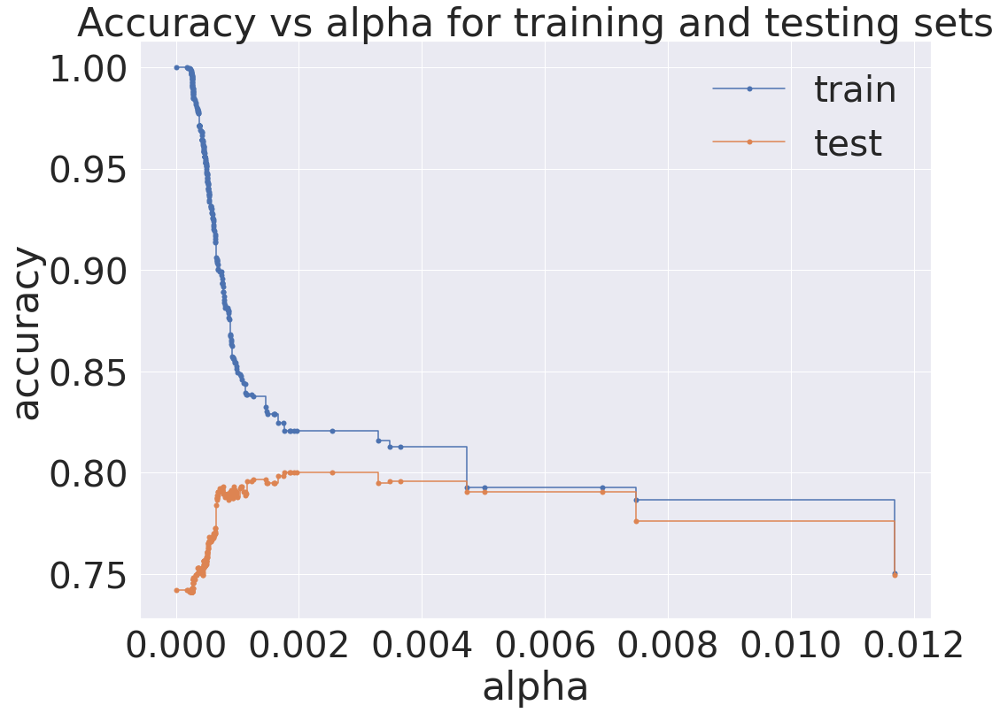

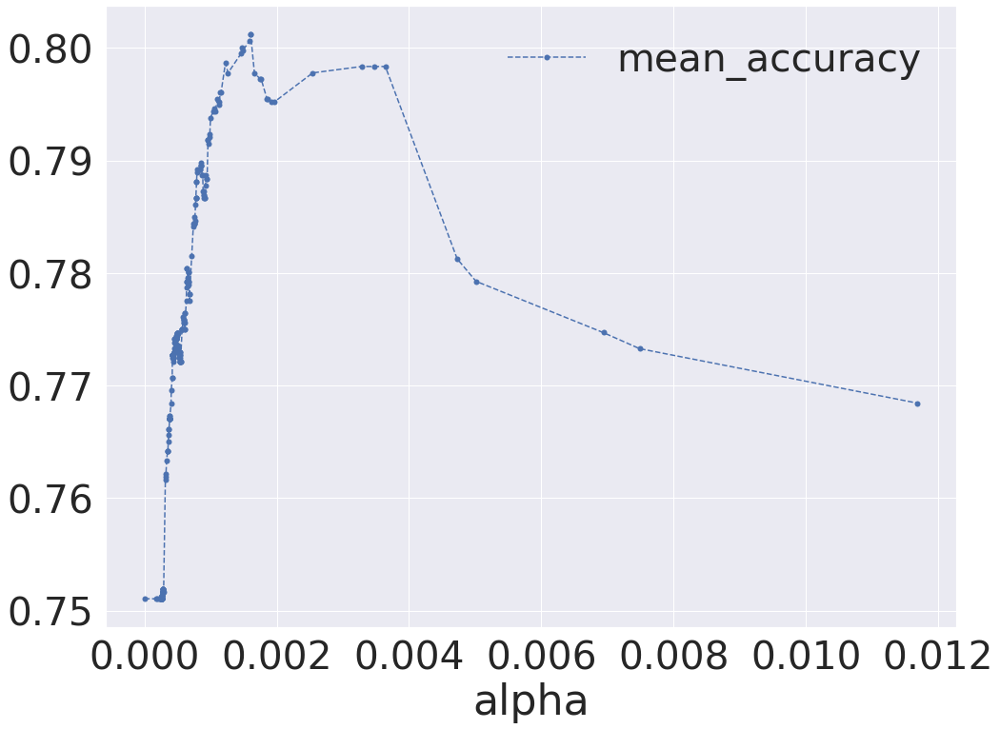

In [ ]:
refvar="semsize"
taglio=0.63

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=0, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   marker='o',
                   linestyle='--')


In [ ]:

alpha_results[(alpha_results['alpha']>0.0015)
&
(alpha_results['alpha']<0.002)]


,alpha,mean_accuracy,std
229,0.001589,0.800630,0.022148
230,0.001601,0.801199,0.022718
231,0.001606,0.801199,0.022718
232,0.001663,0.797781,0.024255
233,0.001754,0.797211,0.023980
234,0.001766,0.797211,0.023980
235,0.001851,0.795502,0.027092
236,0.001869,0.795502,0.027092
237,0.001922,0.795217,0.026902
238,0.001968,0.795217,0.026902


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Accuracy 0.7950469684030743
F1-score [0.87261146 0.47598253]
              precision    recall  f1-score   support

         0.0       0.81      0.95      0.87       865
         1.0       0.72      0.36      0.48       306

    accuracy                           0.80      1171
   macro avg       0.76      0.65      0.67      1171
weighted avg       0.78      0.80      0.77      1171

0.7947183497676528


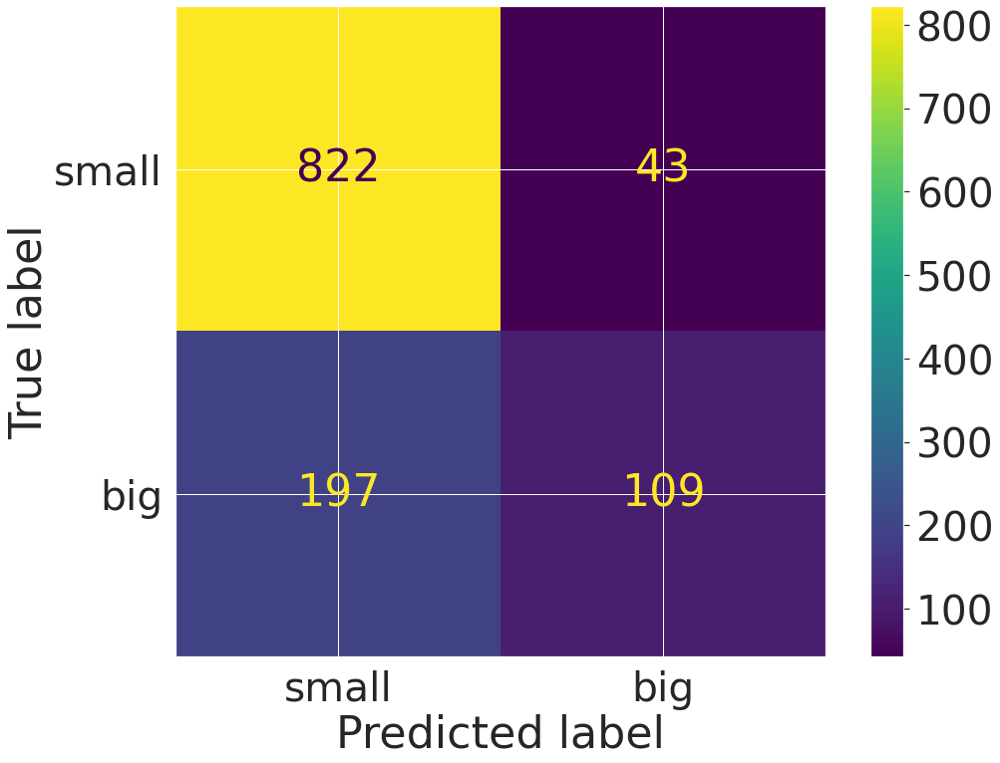

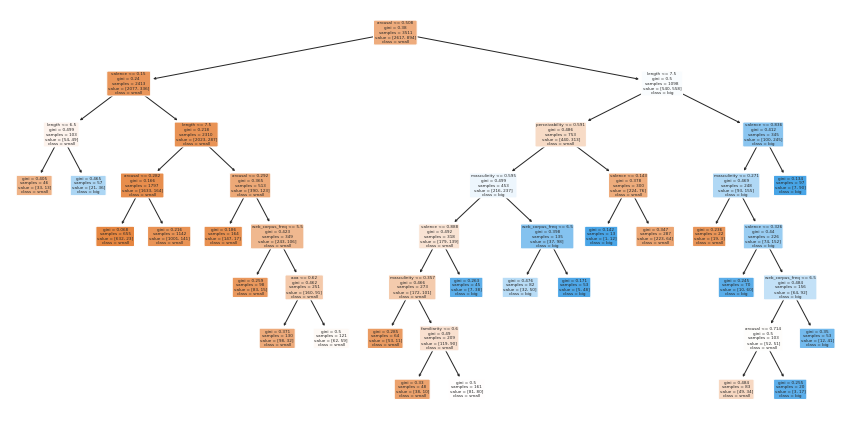

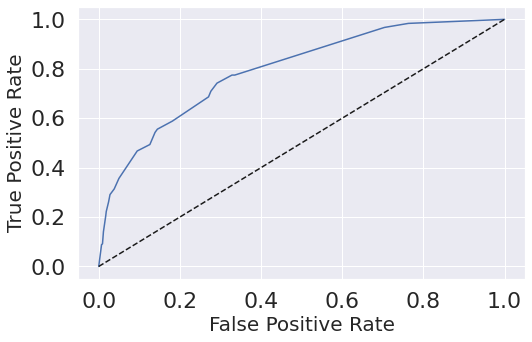

In [ ]:
ideal_ccp_alpha = 0.001601

ideal_ccp_alpha = float(ideal_ccp_alpha)

clf_dt_pruned = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['small','big'])

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=["small","big"],
          feature_names=X.columns)

y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

y_score = clf_dt_pruned.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Masculinity

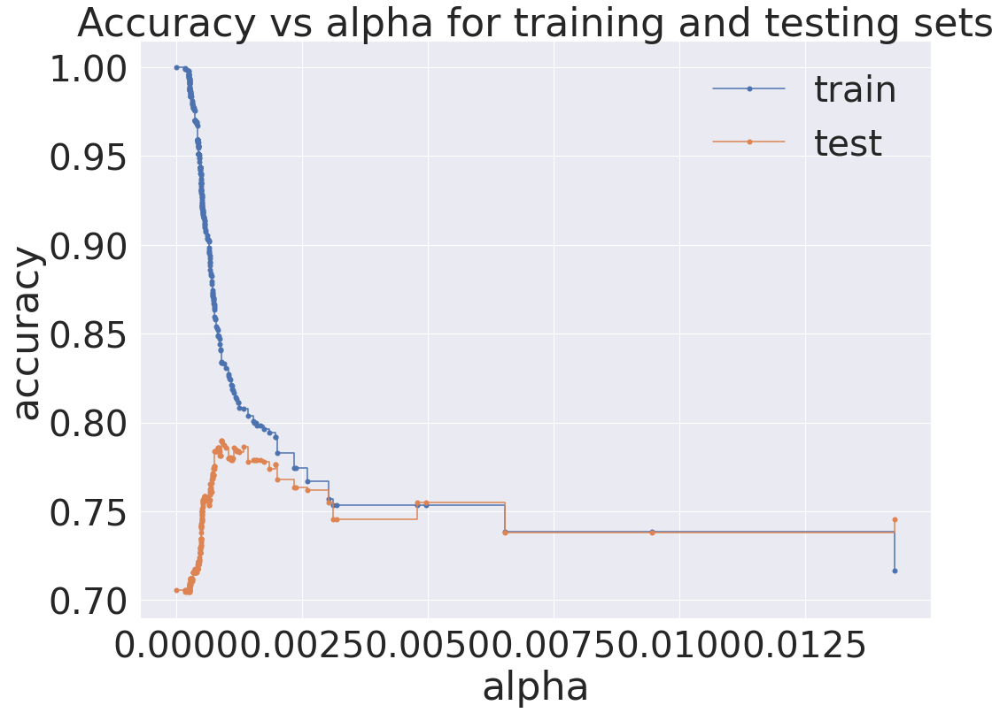

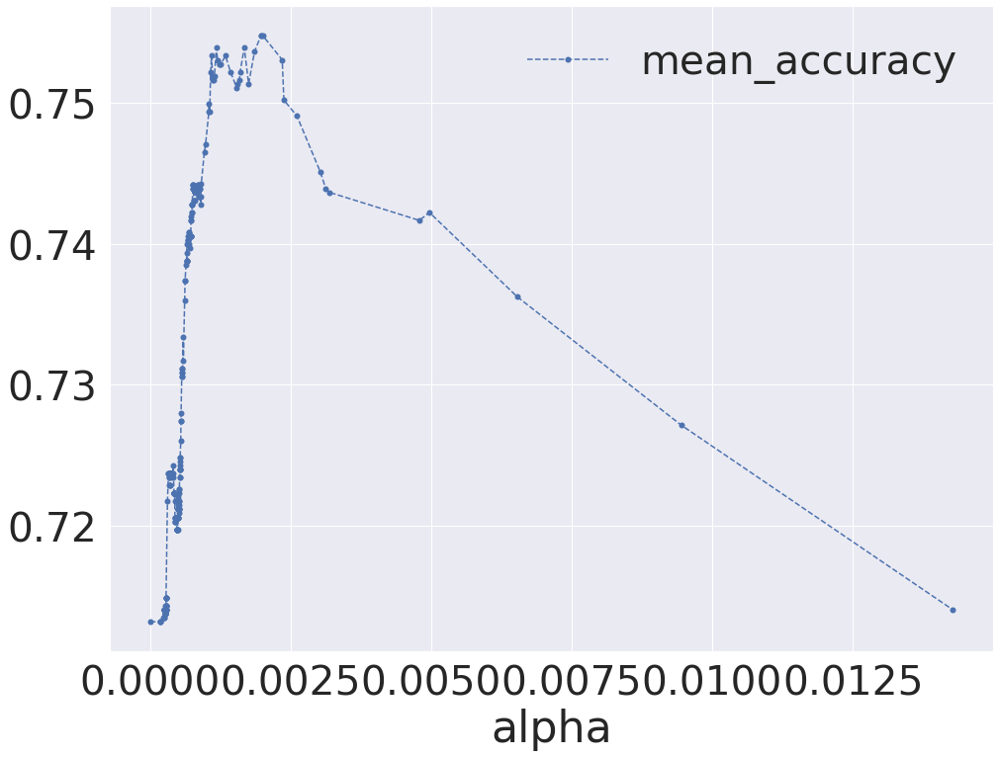

In [ ]:
refvar="masculinity"
taglio=0.6

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=0, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   marker='o',
                   linestyle='--')

In [ ]:

alpha_results[(alpha_results['alpha']>0.0015)
&
(alpha_results['alpha']<0.0025)]

,alpha,mean_accuracy,std
252,0.001542,0.751076,0.016979
253,0.001555,0.751361,0.017161
254,0.001591,0.751645,0.016813
255,0.001603,0.752215,0.017575
256,0.001677,0.753923,0.013112
257,0.001754,0.751363,0.016140
258,0.001859,0.753642,0.018351
259,0.001972,0.754779,0.016440
260,0.001985,0.754779,0.015887
261,0.002007,0.754779,0.015887


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Accuracy 0.7762596071733561
F1-score 0.5130111524163568
              precision    recall  f1-score   support

         0.0       0.83      0.88      0.85       873
         1.0       0.57      0.46      0.51       298

    accuracy                           0.78      1171
   macro avg       0.70      0.67      0.68      1171
weighted avg       0.76      0.78      0.77      1171

0.7482279726623462


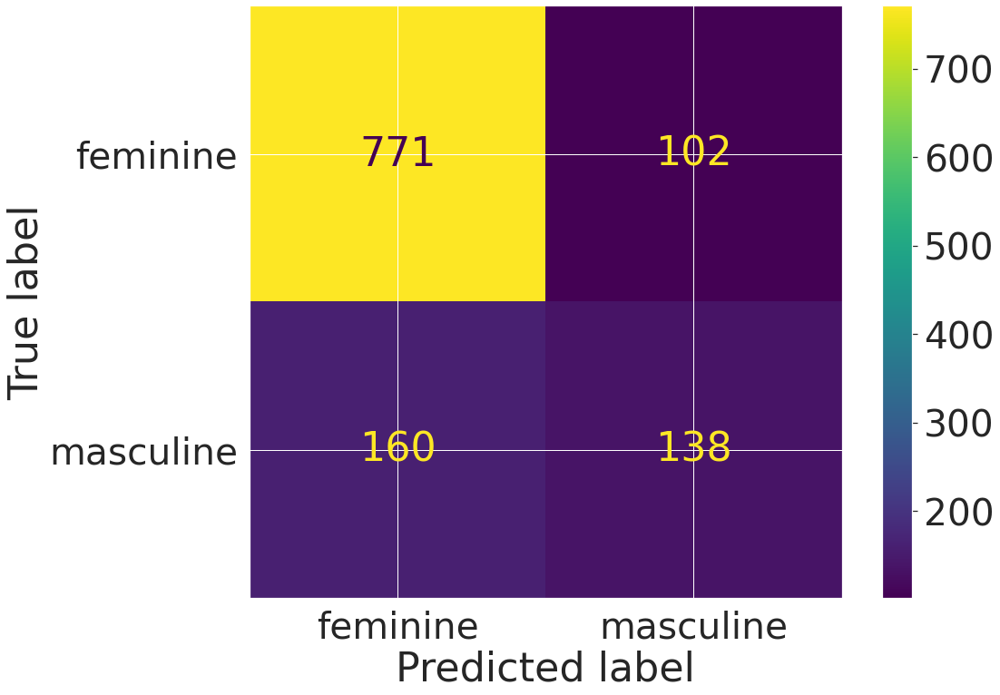

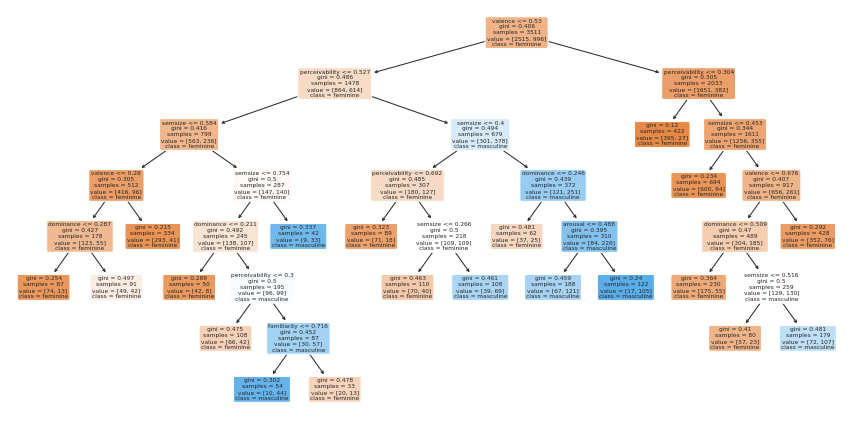

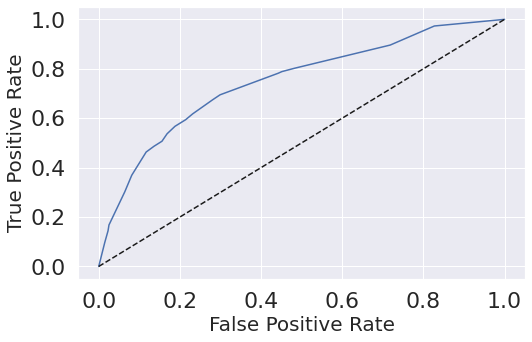

In [ ]:
ideal_ccp_alpha = 0.001985

ideal_ccp_alpha = float(ideal_ccp_alpha)

clf_dt_pruned = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['feminine','masculine'])

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=["feminine","masculine"],
          feature_names=X.columns)

y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

y_score = clf_dt_pruned.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Polysemy

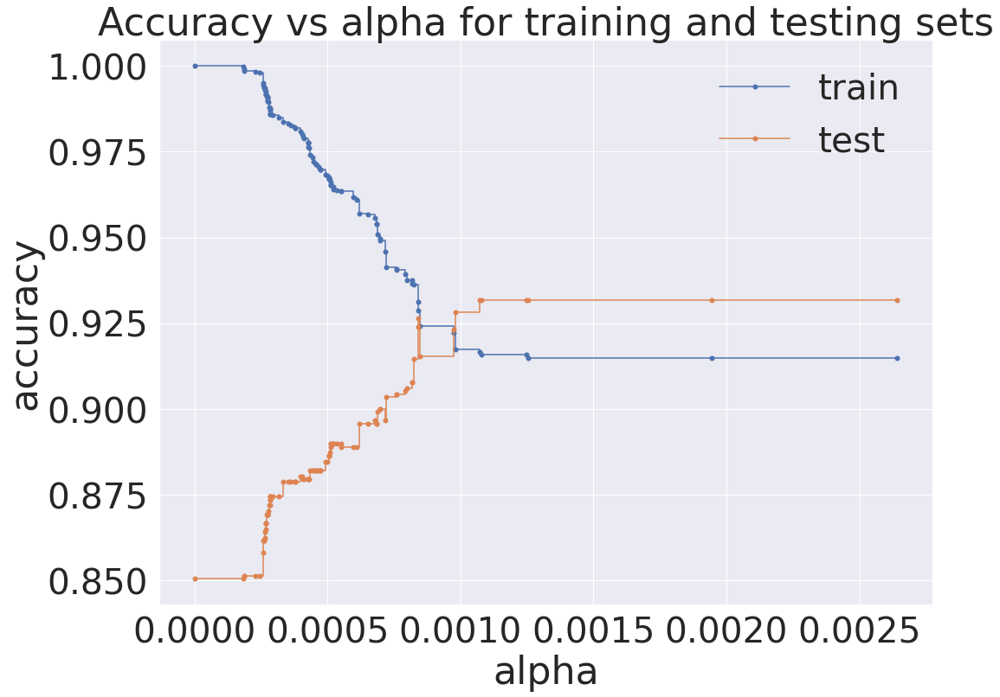

KeyboardInterrupt: ignored

In [ ]:
refvar="polysemy"
taglio=0.63

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=0, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   marker='o',
                   linestyle='--')


In [ ]:

alpha_results[(alpha_results['alpha']>0.001)
&
(alpha_results['alpha']<0.004)]

In [ ]:
ideal_ccp_alpha = 0.001944

ideal_ccp_alpha = float(ideal_ccp_alpha)

clf_dt_pruned = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['not pol','pol'])

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=["not pol","pol"],
          feature_names=X.columns)

y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred,average='weighted'))
print(classification_report(y_test, y_pred))

y_score = clf_dt_pruned.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Perceivability

In [ ]:
refvar="perceivability"
taglio=0.8

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=0, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   marker='o',
                   linestyle='--')


In [ ]:
alpha_results[(alpha_results['alpha']>0.0014)
&
(alpha_results['alpha']<0.002)]


In [ ]:
ideal_ccp_alpha = 0.001499

ideal_ccp_alpha = float(ideal_ccp_alpha)

clf_dt_pruned = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['not peveivable','perveivable'])

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=["not perceivable","perceivable"],
          feature_names=X.columns)

y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

y_score = clf_dt_pruned.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Age of Aquisition (multi split)

In [ ]:
refvar="aoa"

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=0, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   marker='o',
                   linestyle='--')


In [ ]:
alpha_results[(alpha_results['alpha']>0.0018)
&
(alpha_results['alpha']<0.0025)]

In [ ]:
ideal_ccp_alpha = 0.001858

ideal_ccp_alpha = float(ideal_ccp_alpha)

clf_dt_pruned = DecisionTreeClassifier(criterion='entropy', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['0-2','2-4','4-6','6-8','8-10','10-12'])

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=['0-2','2-4','4-6','6-8','8-10','10-12'],
          feature_names=X.columns)

y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred,average=None))
print(classification_report(y_test, y_pred))

print(clf_dt_pruned.predict_proba(X_test))

report = classification_report(y_test, y_pred, output_dict=True)

export = pd.DataFrame(report).transpose()

print(export.to_latex())

plt.show()

### Age of Aquisition (binary)

In [ ]:
refvar="aoa"
taglio=0.6

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0




X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=0, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   marker='o',
                   linestyle='-')

In [ ]:
alpha_results[(alpha_results['alpha']>0.0025)
&
(alpha_results['alpha']<0.005)]


In [ ]:
ideal_ccp_alpha = 0.003224

ideal_ccp_alpha = float(ideal_ccp_alpha)

clf_dt_pruned = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['younger','older'])

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=["younger","older"],
          feature_names=X.columns)

y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

y_score = clf_dt_pruned.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Web Corpus Frequency

In [ ]:
refvar="web_corpus_freq"

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=0, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   yerr='std',
                   marker='o',
                   linestyle='--')


In [ ]:
alpha_results[(alpha_results['alpha']>0.0013)
&
(alpha_results['alpha']<0.0016)]

In [ ]:
ideal_ccp_alpha = 0.001376

ideal_ccp_alpha = float(ideal_ccp_alpha)

clf_dt_pruned = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['4','5','6','7','8','9'],
                      )

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=['4','5','6','7','8','9'],
          feature_names=X.columns)

y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred,average=None))
print(classification_report(y_test, y_pred))

print(clf_dt_pruned.predict_proba(X_test))

report = classification_report(y_test, y_pred, output_dict=True)

export = pd.DataFrame(report).transpose()

print(export.to_latex())

### 3.1.1 Aoa class

In [ ]:
df_class_aoa= dfprepro.copy()
df_class_aoa.head()

In [ ]:
dataframe = [df_class_aoa]

In [ ]:
for dataset in dataframe:
    dataset.loc[(dataset["aoa"] > 1) & (dataset["aoa"] <= 2), "aoa"] = 1
    dataset.loc[(dataset["aoa"] > 2)& (dataset["aoa"] <= 3), "aoa"] = 2
    dataset.loc[(dataset["aoa"] > 3)& (dataset["aoa"] <= 4), "aoa"] = 3
    dataset.loc[(dataset["aoa"] > 4)& (dataset["aoa"] <= 5), "aoa"] = 4
    dataset.loc[(dataset["aoa"] > 5)& (dataset["aoa"] <= 6), "aoa"] = 5
    dataset.loc[(dataset["aoa"] > 6)&( dataset["aoa"] <= 7), "aoa"] = 6
    dataset.loc[(dataset["aoa"] > 7), "aoa"] = 7
df_class_aoa.head()

In [ ]:
attributes = [col for col in df_class_aoa.columns if col != 'aoa']
X = df_class_aoa[attributes].values
y = df_class_aoa['aoa']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=100)

len(df_class_aoa), X_train.shape[0], X_test.shape[0]

In [ ]:
X=df_class_aoa.drop("aoa",axis=1).copy()
X.dtypes

In [ ]:
y_encoded=pd.get_dummies(y,columns=["aoa"]).head()

In [ ]:
y_encoded.dtypes

In [ ]:
X_train.shape, X_test.shape

In [ ]:
clf = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1)
clf.fit(X_train, y_train)

In [ ]:
for col, imp in zip(attributes, clf.feature_importances_): print(col, imp)

In [ ]:
dot_data = tree.export_graphviz (clf, out_file=None,
                                feature_names=attributes,
                                class_names=[str(v) for v in clf.classes_],
                                filled=True, rounded=True,
                                special_characters=True,
                                max_depth=2)

graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [ ]:
# apply decision tree to train set
y_pred = clf.predict(X_train)
y_pred[:5]

In [ ]:
y_train.values[:5]

In [ ]:
print('Accuracy', accuracy_score(y_train, y_pred))
print('F1', f1_score(y_train, y_pred, average=None))

In [ ]:
print( classification_report(y_train, y_pred) )

In [ ]:
# Confusion matrix for trainset
# TP, FN, FP, TN
confusion_matrix(y_train, y_pred)

In [ ]:
# apply decision tree to test set
y_pred = clf.predict(X_test)

In [ ]:
print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))
confusion_matrix(y_test, y_pred)

In [ ]:
y_score = clf.predict_proba(X_test)

In [ ]:
plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Length

In [ ]:
refvar="length"
taglio=0.35

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=0, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   marker='o',
                   linestyle='--')


In [ ]:
alpha_results[(alpha_results['alpha']>0.001)
&
(alpha_results['alpha']<0.0025)]


In [ ]:
ideal_ccp_alpha = 0.001538

ideal_ccp_alpha = float(ideal_ccp_alpha)

clf_dt_pruned = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['short','long'])

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=["short","long"],
          feature_names=X.columns)

y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

y_score = clf_dt_pruned.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

## 3.2 Classification by KNN

### Age of Aquisition

#### choice of k

In [ ]:
from sklearn.neighbors import KNeighborsClassifier


refvar="aoa"
taglio=0.6

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

k = 4  
neigh = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
Pred_y = neigh.predict(X_test)


error_rate = []
for i in range(1,100):
 knn = KNeighborsClassifier(n_neighbors=i)
 knn.fit(X_train,y_train)
 pred_i = knn.predict(X_test)
 error_rate.append(np.mean(pred_i != y_test))

plt.figure(figsize=(10,6))
plt.plot(range(1,100),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
print("Minimum error:-",min(error_rate),"at K =",error_rate.index(min(error_rate)))

In [ ]:

acc = []
# Will take some time
from sklearn import metrics
for i in range(1,40):
    neigh = KNeighborsClassifier(n_neighbors = i).fit(X_train,y_train)
    yhat = neigh.predict(X_test)
    acc.append(metrics.accuracy_score(y_test, yhat))
    
plt.figure(figsize=(10,6))
plt.plot(range(1,40),acc,color = 'blue',linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('accuracy vs. K Value')
plt.xlabel('K')
plt.ylabel('Accuracy')
print("Maximum accuracy:-",max(acc),"at K =",acc.index(max(acc)))



In [ ]:
from sklearn.neighbors import KNeighborsClassifier


refvar="aoa"
taglio=0.6

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_knn = KNeighborsClassifier(n_neighbors=24)
clf_knn.fit(X, y)

In [ ]:
# apply KNN to train set
y_pred = clf_knn.predict(X_train)
y_pred[:5]

In [ ]:
y_train.values[:5]

In [ ]:
print('Accuracy', accuracy_score(y_train, y_pred))
print('F1', f1_score(y_train, y_pred, average='weighted'))
print( classification_report(y_train, y_pred) )

In [ ]:
# Confusion matrix for trainset
# TP, FN, FP, TN
confusion_matrix(y_train, y_pred)

In [ ]:
# apply KNN to test set
y_pred = clf_knn.predict(X_test)

In [ ]:
print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average='weighted'))
print(classification_report(y_test, y_pred))

print(confusion_matrix(y_test, y_pred))

plot_confusion_matrix(clf_knn,
                      X_test,
                      y_test,
                      display_labels=['younger','older'])


In [ ]:
y_score = clf_knn.predict_proba(X_test)

In [ ]:
fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

In [ ]:
plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Valence

#### choice of k

In [ ]:
from sklearn.neighbors import KNeighborsClassifier


refvar="valence"
taglio=0.67

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

k = 4  
neigh = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
Pred_y = neigh.predict(X_test)


error_rate = []
for i in range(1,100):
 knn = KNeighborsClassifier(n_neighbors=i)
 knn.fit(X_train,y_train)
 pred_i = knn.predict(X_test)
 error_rate.append(np.mean(pred_i != y_test))

plt.figure(figsize=(10,6))
plt.plot(range(1,100),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
print("Minimum error:-",min(error_rate),"at K =",error_rate.index(min(error_rate)))

In [ ]:

acc = []
# Will take some time
from sklearn import metrics
for i in range(1,40):
    neigh = KNeighborsClassifier(n_neighbors = i).fit(X_train,y_train)
    yhat = neigh.predict(X_test)
    acc.append(metrics.accuracy_score(y_test, yhat))
    
plt.figure(figsize=(10,6))
plt.plot(range(1,40),acc,color = 'blue',linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('accuracy vs. K Value')
plt.xlabel('K')
plt.ylabel('Accuracy')
print("Maximum accuracy:-",max(acc),"at K =",acc.index(max(acc)))



In [ ]:

refvar="valence"
taglio=0.67

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_knn = KNeighborsClassifier(n_neighbors=12)
clf_knn.fit(X, y)

y_pred = clf_knn.predict(X_train)
print('Accuracy', accuracy_score(y_train, y_pred))
print('F1', f1_score(y_train, y_pred, average='weighted'))
print( classification_report(y_train, y_pred) )

confusion_matrix(y_train, y_pred)


In [ ]:

y_pred = clf_knn.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average='weighted'))
print(classification_report(y_test, y_pred))

print(confusion_matrix(y_test, y_pred))

plot_confusion_matrix(clf_knn,
                      X_test,
                      y_test,
                      display_labels=['not valuable','valuable'])

y_score = clf_knn.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)


plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Polysemy

#### choice of k

In [ ]:
from sklearn.neighbors import KNeighborsClassifier


refvar="polysemy"
taglio=0.6

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

k = 4  
neigh = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
Pred_y = neigh.predict(X_test)


error_rate = []
for i in range(1,100):
 knn = KNeighborsClassifier(n_neighbors=i)
 knn.fit(X_train,y_train)
 pred_i = knn.predict(X_test)
 error_rate.append(np.mean(pred_i != y_test))

plt.figure(figsize=(10,6))
plt.plot(range(1,100),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
print("Minimum error:-",min(error_rate),"at K =",error_rate.index(min(error_rate)))

In [ ]:

acc = []
# Will take some time
from sklearn import metrics
for i in range(1,40):
    neigh = KNeighborsClassifier(n_neighbors = i).fit(X_train,y_train)
    yhat = neigh.predict(X_test)
    acc.append(metrics.average_precision_score(y_test, yhat))
    
plt.figure(figsize=(10,6))
plt.plot(range(1,40),acc,color = 'blue',linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('F1 score vs. K Value')
plt.xlabel('K')
plt.ylabel('F1 Score')
print("Maximum F1:-",max(acc),"at K =",acc.index(max(acc)))



In [ ]:

refvar="polysemy"
taglio=0.67

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_knn = KNeighborsClassifier(n_neighbors=6)
clf_knn.fit(X, y)

y_pred = clf_knn.predict(X_train)
print('Accuracy', accuracy_score(y_train, y_pred))
print('F1', f1_score(y_train, y_pred, average='weighted'))
print( classification_report(y_train, y_pred) )

confusion_matrix(y_train, y_pred)


In [ ]:
y_pred = clf_knn.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average='weighted'))
print(classification_report(y_test, y_pred))

print(confusion_matrix(y_test, y_pred))

plot_confusion_matrix(clf_knn,
                      X_test,
                      y_test,
                      display_labels=['not polysemic','polysemic'])

y_score = clf_knn.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)


plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Age of Acquisition (multi)

#### choice of k

In [ ]:
from sklearn.neighbors import KNeighborsClassifier


refvar="aoa"

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

k = 4  
neigh = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
Pred_y = neigh.predict(X_test)


error_rate = []
for i in range(1,100):
 knn = KNeighborsClassifier(n_neighbors=i)
 knn.fit(X_train,y_train)
 pred_i = knn.predict(X_test)
 error_rate.append(np.mean(pred_i != y_test))

plt.figure(figsize=(10,6))
plt.plot(range(1,100),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
print("Minimum error:-",min(error_rate),"at K =",error_rate.index(min(error_rate)))

In [ ]:
clf_knn = KNeighborsClassifier(n_neighbors=37)
clf_knn.fit(X, y)

y_pred = clf_knn.predict(X_train)
print('Accuracy', accuracy_score(y_train, y_pred))
print('F1', f1_score(y_train, y_pred, average='weighted'))
print( classification_report(y_train, y_pred) )

confusion_matrix(y_train, y_pred)


In [ ]:
y_pred = clf_knn.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average='weighted'))
print(classification_report(y_test, y_pred))

print(confusion_matrix(y_test, y_pred))

plot_confusion_matrix(clf_knn,
                      X_test,
                      y_test,
                      display_labels=['0-2','2-4','4-6','6-8','8-10'])

y_score = clf_knn.predict_proba(X_test)

report = classification_report(y_test, y_pred, output_dict=True)

export = pd.DataFrame(report).transpose()

print(export.to_latex())

## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

### Valence

In [ ]:
refvar='valence'
taglio=0.67

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# Instantiate model with 10 decision trees
model = RandomForestClassifier(n_estimators = 380, random_state = 42)
# Train the model on training data
ra=model.fit(X_train, y_train)


#TESTING THE MODEL BY PREDICTING ON TEST DATA
#AND CALCULATE THE ACCURACY SCORE

prediction_test = model.predict(X_test)
#print(y_test, prediction_test)

#Print the prediction accuracy
print ("Accuracy = ", metrics.accuracy_score(y_test, prediction_test))
#Test accuracy for various test sizes and see how it gets better with more training data

#One amazing feature of Random forest is that it provides us info on feature importances
# Get numerical feature importances
#importances = list(model.feature_importances_)

#Let us print them into a nice format.

feature_list = list(X.columns)
feature_imp = pd.Series(model.feature_importances_,index=feature_list).sort_values(ascending=False)
print(feature_imp)

y_pred = model.predict(X_train)
y_pred = model.predict(X_test)

plot_confusion_matrix(ra,
                      X_test,
                      y_test,
                      display_labels=['not val','val'],
                      )

y_score = model.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred,average='weighted'))
print(classification_report(y_test, y_pred))


### Polysemy

In [ ]:
refvar='polysemy'
taglio=0.67

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 42)

# Instantiate model with 10 decision trees
model = RandomForestClassifier(n_estimators = 385, random_state = 42)
# Train the model on training data
ra=model.fit(X_train, y_train)


#TESTING THE MODEL BY PREDICTING ON TEST DATA
#AND CALCULATE THE ACCURACY SCORE

prediction_test = model.predict(X_test)
#print(y_test, prediction_test)

#Print the prediction accuracy
print ("Accuracy = ", metrics.accuracy_score(y_test, prediction_test))
#Test accuracy for various test sizes and see how it gets better with more training data

#One amazing feature of Random forest is that it provides us info on feature importances
# Get numerical feature importances
#importances = list(model.feature_importances_)

#Let us print them into a nice format.

feature_list = list(X.columns)
feature_imp = pd.Series(model.feature_importances_,index=feature_list).sort_values(ascending=False)
print(feature_imp)


y_pred = model.predict(X_train)
y_pred = model.predict(X_test)

plot_confusion_matrix(ra,
                      X_test,
                      y_test,
                      display_labels=['not pol','pol']
                      )

y_score = model.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred,average='weighted'))
print(classification_report(y_test, y_pred))

### Age of Aquisition

In [ ]:
refvar='aoa'
taglio=0.6

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# Instantiate model with 10 decision trees
model = RandomForestClassifier(n_estimators = 380, random_state = 42)
# Train the model on training data
ra=model.fit(X_train, y_train)


#TESTING THE MODEL BY PREDICTING ON TEST DATA
#AND CALCULATE THE ACCURACY SCORE

prediction_test = model.predict(X_test)
#print(y_test, prediction_test)

#Print the prediction accuracy
print ("Accuracy = ", metrics.accuracy_score(y_test, prediction_test))
#Test accuracy for various test sizes and see how it gets better with more training data

#One amazing feature of Random forest is that it provides us info on feature importances
# Get numerical feature importances
#importances = list(model.feature_importances_)

#Let us print them into a nice format.

feature_list = list(X.columns)
feature_imp = pd.Series(model.feature_importances_,index=feature_list).sort_values(ascending=False)
print(feature_imp)


y_pred = model.predict(X_train)
y_pred = model.predict(X_test)

plot_confusion_matrix(ra,
                      X_test,
                      y_test,
                      display_labels=['younger','older']
                      )

y_score = model.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred,average='weighted'))
print(classification_report(y_test, y_pred))

### Out of bag error

In [ ]:

import matplotlib.pyplot as plt

from collections import OrderedDict
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier

RANDOM_STATE = 42

refvar='valence'
taglio=0.67

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0


# NOTE: Setting the `warm_start` construction parameter to `True` disables
# support for parallelized ensembles but is necessary for tracking the OOB
# error trajectory during training.
ensemble_clfs = [
    (
        "RandomForestClassifier, max_features='sqrt'",
        RandomForestClassifier(
            warm_start=True,
            oob_score=True,
            max_features="sqrt",
            random_state=RANDOM_STATE,
        ),
    ),
    (
        "RandomForestClassifier, max_features='log2'",
        RandomForestClassifier(
            warm_start=True,
            max_features="log2",
            oob_score=True,
            random_state=RANDOM_STATE,
        ),
    ),
    (
        "RandomForestClassifier, max_features=None",
        RandomForestClassifier(
            warm_start=True,
            max_features=None,
            oob_score=True,
            random_state=RANDOM_STATE,
        ),
    ),
]

# Map a classifier name to a list of (<n_estimators>, <error rate>) pairs.
error_rate = OrderedDict((label, []) for label, _ in ensemble_clfs)

# Range of `n_estimators` values to explore.
min_estimators = 100
max_estimators = 1000

for label, clf in ensemble_clfs:
    for i in range(min_estimators, max_estimators + 1, 5):
        clf.set_params(n_estimators=i)
        clf.fit(X, y)

        # Record the OOB error for each `n_estimators=i` setting.
        oob_error = 1 - clf.oob_score_
        error_rate[label].append((i, oob_error))

# Generate the "OOB error rate" vs. "n_estimators" plot.
for label, clf_err in error_rate.items():
    xs, ys = zip(*clf_err)
    plt.plot(xs, ys, label=label)

plt.xlim(min_estimators, max_estimators)
plt.xlabel("n_estimators")
plt.ylabel("OOB error rate")
plt.legend(loc="upper right")
plt.show()

## Entropy (Decision Tree)

### Age of Acquisition

In [ ]:
refvar="aoa"
taglio=0.6

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0




X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='entropy', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='entropy',random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='entropy', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=0, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   yerr='std',
                   marker='o',
                   linestyle='-')

In [ ]:
alpha_results[(alpha_results['alpha']>0.002)
&
(alpha_results['alpha']<0.004)]


In [ ]:
ideal_ccp_alpha = 0.002246

ideal_ccp_alpha = float(ideal_ccp_alpha)

clf_dt_pruned = DecisionTreeClassifier(criterion='entropy', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['young','old'])

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=["young","old"],
          feature_names=X.columns)

y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

y_score = clf_dt_pruned.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Polysemy

In [ ]:
refvar="polysemy"
taglio=0.6

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0




X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='entropy', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='entropy',random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='entropy', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=0, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   yerr='std',
                   marker='o',
                   linestyle='-')

In [ ]:
alpha_results[(alpha_results['alpha']>0.002)
]


In [ ]:
ideal_ccp_alpha = 0.003002

ideal_ccp_alpha = float(ideal_ccp_alpha)

clf_dt_pruned = DecisionTreeClassifier(criterion='entropy', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['not polysemic','polysemic'])

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=["not polysemic","polysemic"],
          feature_names=X.columns)

y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

y_score = clf_dt_pruned.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

### Valence

In [ ]:
refvar="valence"
taglio=0.67

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0




X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

clf_dt = DecisionTreeClassifier(criterion='entropy', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42)

clf_dt = clf_dt.fit(X_train, y_train)

path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]

clf_dts=[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  clf_dt.fit(X_train, y_train)
  clf_dts.append(clf_dt)

train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax =plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas,train_scores, marker ='o',label='train',drawstyle='steps-post')

ax.plot(ccp_alphas,test_scores, marker ='o',label='test',drawstyle='steps-post')
ax.legend()
plt.show()

alpha_loop_values =[]

for ccp_alpha in ccp_alphas:
  clf_dt = DecisionTreeClassifier(criterion='entropy', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=0, ccp_alpha=ccp_alpha)
  scores= cross_val_score(clf_dt,X_train,y_train, cv=10)
  alpha_loop_values.append([ccp_alpha,np.mean(scores), np.std(scores)])

alpha_results = pd.DataFrame(alpha_loop_values,
                               columns=['alpha','mean_accuracy','std'])
  
alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   yerr='std',
                   marker='o',
                   linestyle='-')

In [ ]:
alpha_results[(alpha_results['alpha']>0.0025)
&
(alpha_results['alpha']<0.0035)]


In [ ]:
ideal_ccp_alpha = 0.003041

ideal_ccp_alpha = float(ideal_ccp_alpha)

clf_dt_pruned = DecisionTreeClassifier(criterion='entropy', max_depth=None, min_samples_split=2, min_samples_leaf=1,random_state=42, ccp_alpha=ideal_ccp_alpha)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['not valuable','valuable'])

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=["not valuable","valuable"],
          feature_names=X.columns)

y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

y_score = clf_dt_pruned.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

## Citraro

In [ ]:
###### Lecture Pipeline ######
# you can/have to modify the order for your project,
# e.g. hyperparameter tuning before evaluating a decision tree

# Hold-out
from sklearn.model_selection import train_test_split

# Decision Tree
from sklearn.tree import DecisionTreeClassifier
# Optional: KNN
from sklearn.neighbors import KNeighborsClassifier

##### Decision Tree Visualization ###
from sklearn import tree # export_graphviz() method
import pydotplus # viz stuff
from IPython.display import Image # viz stuff
####################################

######## Evaluation #######
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.metrics import roc_curve, auc, roc_auc_score
# Optional: baseline comparison
from sklearn.dummy import DummyClassifier
###########################

# hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

# cross-validation
from sklearn.model_selection import cross_val_score

In [ ]:
refvar="valence"
taglio=0.67

X=df_class_ref.drop(refvar,axis=1).copy()

y=df_class_ref[refvar].copy()

y_up_index = y >= taglio

y[y_up_index]=1

y_zero_index = y < taglio

y[y_zero_index]=0




X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)



In [ ]:
clf = DecisionTreeClassifier(criterion='gini',
                             max_depth=None ,
                             min_samples_split=10,
                             min_samples_leaf=5,
                            )

clf.fit(X_train, y_train)

In [ ]:
imp_dict = {attr: clf.feature_importances_[i] for i, attr in enumerate(attributes)}
imp_dict

{k: v for k, v in sorted(imp_dict.items(), key=lambda item: item[1], reverse=True)}

In [ ]:
dot_data = tree.export_graphviz (clf, out_file=None,
                                feature_names=attributes,
                                class_names=[str(v) for v in clf.classes_],
                                filled=True, rounded=True,
                                special_characters=True,
                                max_depth=2)

graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [ ]:
y_pred = clf.predict(X_train)

In [ ]:
print('Accuracy', accuracy_score(y_train, y_pred))
print('F1', f1_score(y_train, y_pred, average=None))

In [ ]:
print( classification_report(y_train, y_pred) )

In [ ]:
# NOT SUGGESTED FOR THE PROJECT

cf = confusion_matrix(y_train, y_pred)
cf

In [ ]:
y_pred = clf.predict( X_test )

In [ ]:
y_score = clf.predict_proba(X_test)
y_score[:6]

In [ ]:
fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)
plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

In [ ]:
dummy_clf = DummyClassifier(strategy='constant', constant=1)
dummy_clf.fit(X_test, y_test)

y_pred = dummy_clf.predict(X_test)

In [ ]:
param_list = {'max_depth': [None] + [2, 3, 4],
             'min_samples_split': [2, 5, 10, 20],
             'min_samples_leaf': [1, 5, 10, 20]
             }

grid_search = GridSearchCV(clf, param_grid=param_list, scoring='f1')
grid_search.fit(X, y)

res = grid_search.cv_results_

In [ ]:
grid_search.best_estimator_

In [ ]:
def report(results, n_top=3):
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results['rank_test_score'] == i)
        for candidate in candidates:
            print("Model with rank: {0}".format(i))
            print("Mean validation score: {0:.3f} (std: {1:.3f})".format(
                  results['mean_test_score'][candidate],
                  results['std_test_score'][candidate]))
            print("Parameters: {0}".format(results['params'][candidate]))
            print("")

In [ ]:
report(res, n_top=3)

In [ ]:

clf_dt_pruned = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_split=5, min_samples_leaf=20)

clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train)

plot_confusion_matrix(clf_dt_pruned,
                      X_test,
                      y_test,
                      display_labels=['not valuable','valuable'])

plt.figure(figsize=(15,7.5))

from sklearn.tree import plot_tree
plot_tree(clf_dt_pruned,
          filled=True,
          rounded=True,
          class_names=["not valuable","valuable"],
          feature_names=X.columns)

y_pred = clf_dt_pruned.predict(X_train)
y_pred = clf_dt_pruned.predict(X_test)

print('Accuracy %s' % accuracy_score(y_test, y_pred))
print('F1-score %s' % f1_score(y_test, y_pred, average=None))
print(classification_report(y_test, y_pred))

y_score = clf_dt_pruned.predict_proba(X_test)

fpr, tpr, th = roc_curve(y_test, y_score[:,1])

roc_auc = auc(fpr, tpr)
print(roc_auc)

plt.figure(figsize=(8,5))

plt.plot(fpr, tpr)

plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)

plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

# 4 Patter mining

## 4.1 Preprocessing

In [ ]:
dfprepro.head()

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability
0,8,4.200,2.864,4.333,2.382,6.760,4.652,5.391,0,5.0,4.9230
1,5,3.125,5.781,4.667,3.324,5.177,5.121,3.303,0,6.0,5.6250
2,10,3.273,5.250,5.235,5.121,5.543,2.667,3.971,0,5.0,3.2315
3,8,4.194,3.767,4.419,3.971,6.233,4.679,5.167,0,5.0,2.9415
4,10,3.846,3.880,4.800,3.097,6.407,5.083,4.571,0,5.0,2.9315


In [ ]:
dfprepro.describe()

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability
count,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000,4682.000000
mean,6.348355,4.678129,5.086797,5.044939,5.271335,4.143427,4.136403,4.099933,0.080948,6.285135,4.644645
std,2.006230,1.097163,1.594344,0.930669,0.921218,1.252770,1.023293,0.912293,0.272785,0.843987,1.366345
min,2.000000,2.057000,1.030000,1.941000,1.647000,1.219000,1.375000,1.000000,0.000000,4.000000,1.803500
25%,5.000000,3.849000,4.115000,4.529000,4.706000,3.114000,3.438000,3.606000,0.000000,6.000000,3.407000
50%,6.000000,4.571000,5.290000,5.123000,5.438000,4.177000,4.186500,4.121000,0.000000,6.000000,4.562500
75%,8.000000,5.419000,6.088000,5.600000,5.969000,5.152000,4.882000,4.656000,0.000000,7.000000,5.970500
max,16.000000,8.177000,8.647000,8.371000,6.939000,6.971000,6.912000,6.971000,1.000000,9.000000,6.925000


In [ ]:
df_pm= dfprepro.copy()

In [ ]:
var_to_scale=['length','aoa',"arousal","valence","dominance","familiarity","semsize","masculinity","perceivability"]

features = df_pm[var_to_scale]
scaler = MinMaxScaler().fit(features.values)
features = scaler.transform(features.values)


df_pm[var_to_scale] = 4*features-0.5
df_pm.head()

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability
0,1.214286,0.900654,0.463109,0.988025,0.055556,3.353268,1.867347,2.441551,0,5.0,1.936396
1,0.357143,0.198039,1.994946,1.195801,0.767574,2.252434,2.206159,1.042790,0,6.0,2.484672
2,1.785714,0.294771,1.716096,1.549145,2.125850,2.506954,0.433357,1.490286,0,5.0,0.615298
3,1.214286,0.896732,0.937311,1.041524,1.256614,2.986787,1.886852,2.291492,0,5.0,0.388802
4,1.785714,0.669281,0.996652,1.278538,0.595994,3.107789,2.178707,1.892229,0,5.0,0.380992


In [ ]:
df_pm=df_pm.round()

In [ ]:
df_pm.head()

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability
0,1.0,1.0,0.0,1.0,0.0,3.0,2.0,2.0,0,5.0,2.0
1,0.0,0.0,2.0,1.0,1.0,2.0,2.0,1.0,0,6.0,2.0
2,2.0,0.0,2.0,2.0,2.0,3.0,0.0,1.0,0,5.0,1.0
3,1.0,1.0,1.0,1.0,1.0,3.0,2.0,2.0,0,5.0,0.0
4,2.0,1.0,1.0,1.0,1.0,3.0,2.0,2.0,0,5.0,0.0


In [ ]:
df_pm.isnull().sum()

length              0
arousal             0
valence             0
dominance           0
familiarity         0
aoa                 0
semsize             0
masculinity         0
polysemy            0
web_corpus_freq    14
perceivability      0
dtype: int64

In [ ]:
df_pm_copy=df_pm.copy()

In [ ]:
df_pm.loc[(df_pm['web_corpus_freq'].isnull() == True), 'web_corpus_freq'] = df_pm['web_corpus_freq'].mean()


In [ ]:
df_pm['length'] = df_pm['length'].astype(str) + '_Lenght'
df_pm['arousal'] = df_pm['arousal'].astype(str) + '_Arousal'
df_pm['valence'] = df_pm['valence'].astype(str) + '_Valence'
df_pm['dominance'] = df_pm['dominance'].astype(str) + '_Dominance'
df_pm['familiarity'] = df_pm['familiarity'].astype(str) + '_Familiarity'
df_pm['aoa'] = df_pm['aoa'].astype(str) + '_Age_of_Aquisition'
df_pm['semsize'] = df_pm['semsize'].astype(str) + '_SemSize'
df_pm['masculinity'] = df_pm['masculinity'].astype(str) + '_Masculinity'
df_pm['web_corpus_freq'] = df_pm['web_corpus_freq'].astype(str) + '_Web_Corpus_Freq'
df_pm['perceivability'] = df_pm['perceivability'].astype(str) + '_Perceivability'


df_pm.head()

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability
0,1.0_Lenght,1.0_Arousal,0.0_Valence,1.0_Dominance,0.0_Familiarity,3.0_Age_of_Aquisition,2.0_SemSize,2.0_Masculinity,0,5.0_Web_Corpus_Freq,2.0_Perceivability
1,0.0_Lenght,0.0_Arousal,2.0_Valence,1.0_Dominance,1.0_Familiarity,2.0_Age_of_Aquisition,2.0_SemSize,1.0_Masculinity,0,6.0_Web_Corpus_Freq,2.0_Perceivability
2,2.0_Lenght,0.0_Arousal,2.0_Valence,2.0_Dominance,2.0_Familiarity,3.0_Age_of_Aquisition,0.0_SemSize,1.0_Masculinity,0,5.0_Web_Corpus_Freq,1.0_Perceivability
3,1.0_Lenght,1.0_Arousal,1.0_Valence,1.0_Dominance,1.0_Familiarity,3.0_Age_of_Aquisition,2.0_SemSize,2.0_Masculinity,0,5.0_Web_Corpus_Freq,0.0_Perceivability
4,2.0_Lenght,1.0_Arousal,1.0_Valence,1.0_Dominance,1.0_Familiarity,3.0_Age_of_Aquisition,2.0_SemSize,2.0_Masculinity,0,5.0_Web_Corpus_Freq,0.0_Perceivability


In [ ]:
polysemy_dict = {0: 'Not Polysemy', 1: 'Polysemy'}
df_pm['polysemy'] = df_pm['polysemy'].map(polysemy_dict)

df_pm.head()

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability
0,1.0_Lenght,1.0_Arousal,0.0_Valence,1.0_Dominance,0.0_Familiarity,3.0_Age_of_Aquisition,2.0_SemSize,2.0_Masculinity,Not Polysemy,5.0_Web_Corpus_Freq,2.0_Perceivability
1,0.0_Lenght,0.0_Arousal,2.0_Valence,1.0_Dominance,1.0_Familiarity,2.0_Age_of_Aquisition,2.0_SemSize,1.0_Masculinity,Not Polysemy,6.0_Web_Corpus_Freq,2.0_Perceivability
2,2.0_Lenght,0.0_Arousal,2.0_Valence,2.0_Dominance,2.0_Familiarity,3.0_Age_of_Aquisition,0.0_SemSize,1.0_Masculinity,Not Polysemy,5.0_Web_Corpus_Freq,1.0_Perceivability
3,1.0_Lenght,1.0_Arousal,1.0_Valence,1.0_Dominance,1.0_Familiarity,3.0_Age_of_Aquisition,2.0_SemSize,2.0_Masculinity,Not Polysemy,5.0_Web_Corpus_Freq,0.0_Perceivability
4,2.0_Lenght,1.0_Arousal,1.0_Valence,1.0_Dominance,1.0_Familiarity,3.0_Age_of_Aquisition,2.0_SemSize,2.0_Masculinity,Not Polysemy,5.0_Web_Corpus_Freq,0.0_Perceivability


## 4.2 Patter mining

### Frequent itemsets

In [ ]:
X = df_pm.values.tolist()

In [ ]:
X[0]

['8_Lenght',
 '3.0_Arousal',
 '2.0_Valence',
 '4.0_Dominance',
 '2.0_Familiarity',
 '6.0_Age_of_Aquisition',
 '4.0_SemSize',
 '5.0_Masculinity',
 'Not Polysemy',
 '5.0_Web_Corpus_Freq',
 '4.0_Perceivability']

In [ ]:
help(apriori)

Help on built-in function apriori in module fim:

apriori(...)
    apriori (tracts, target='s', supp=10, zmin=1, zmax=None, report='a',
             eval='x', agg='x', thresh=10, prune=None, algo='b', mode='',
             border=None)
    Find frequent item sets with the Apriori algorithm.
    tracts  transaction database to mine (mandatory)
            The database must be an iterable of transactions;
            each transaction must be an iterable of items;
            each item must be a hashable object.
            If the database is a dictionary, the transactions are
            the keys, the values their (integer) multiplicities.
    target  type of frequent item sets to find     (default: s)
            s/a   sets/all   all     frequent item sets
            c     closed     closed  frequent item sets
            m     maximal    maximal frequent item sets
            g     gens       generators
            r     rules      association rules
    supp    minimum support of an i

In [ ]:
itemsets = apriori(X, target='s', supp=2, zmin=2, report='S')

In [ ]:
itemsets[:5]

[(('8.0_Valence', 'Not Polysemy'), 2.1785561725758225),
 (('6.0_SemSize', 'Not Polysemy'), 2.2212729602733874),
 (('11_Lenght', 'Not Polysemy'), 2.3067065356685177),
 (('1.0_Masculinity', 'Not Polysemy'), 2.285348141819735),
 (('2.0_Dominance', 'Not Polysemy'), 2.5630072618539086)]

In [ ]:
# frequent itemset
itemsets[0][0]

('8.0_Valence', 'Not Polysemy')

In [ ]:
# support
itemsets[0][1]

2.1785561725758225

In [ ]:
itemsets = apriori(X, target='m', supp=2, zmin=2, report='S')

In [ ]:
itemsets[:5]

[(('8.0_Valence', 'Not Polysemy'), 2.1785561725758225),
 (('6.0_SemSize', 'Not Polysemy'), 2.2212729602733874),
 (('11_Lenght', 'Not Polysemy'), 2.3067065356685177),
 (('1.0_Masculinity', 'Not Polysemy'), 2.285348141819735),
 (('2.0_Dominance', 'Not Polysemy'), 2.5630072618539086)]

In [ ]:
itemsets[0][0]

('8.0_Valence', 'Not Polysemy')

In [ ]:
df_pm.describe()

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,polysemy,web_corpus_freq,perceivability
count,4682,4682,4682,4682,4682,4682,4682,4682,4682,4682,4682
unique,4,4,4,4,4,4,4,4,2,7,4
top,1.0_Lenght,1.0_Arousal,2.0_Valence,1.0_Dominance,2.0_Familiarity,2.0_Age_of_Aquisition,2.0_SemSize,2.0_Masculinity,Not Polysemy,6.0_Web_Corpus_Freq,1.0_Perceivability
freq,3407,2905,2684,2300,2964,2113,2299,2625,4303,2122,1940


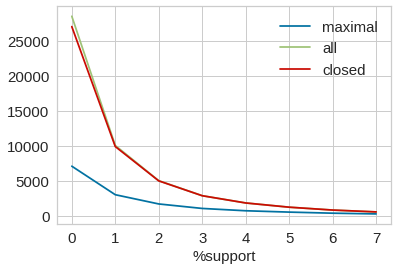

In [ ]:
len_max_it = []
len_cl_it = []
len_all_it = []
for i in range(1, 8+1):
    max_itemsets = apriori(X, target='m', supp=i, zmin=3)
    cl_itemsets = apriori(X, target='c', supp=i, zmin=3)
    all_itemsets = apriori(X, target='s', supp=i, zmin=3)
    len_max_it.append( len(max_itemsets)  )
    len_cl_it.append( len(cl_itemsets) )
    len_all_it.append( len(all_itemsets) )
    
plt.plot(len_max_it, label='maximal')
plt.plot(len_all_it, label='all')
plt.plot(len_cl_it, label='closed')
plt.legend(fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('%support', fontsize=15)

plt.show()

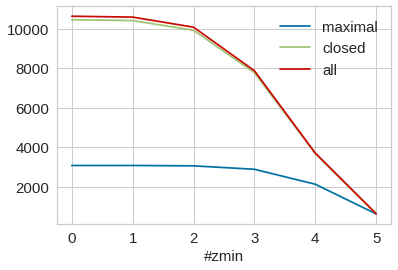

In [ ]:
len_max_it = []
len_cl_it = []
len_all_it = []
for i in range(1, 6+1):
    max_itemsets = apriori(X, target='m', supp=2, zmin=i)
    cl_itemsets = apriori(X, target='c', supp=2, zmin=i)
    all_itemsets = apriori(X, target='s', supp=2, zmin=i)
    len_max_it.append( len(max_itemsets)  )
    len_cl_it.append( len(cl_itemsets) )
    len_all_it.append( len(all_itemsets) )
    
plt.plot(len_max_it, label='maximal')
plt.plot(len_cl_it, label='closed')
plt.plot(len_all_it, label='all')
plt.legend(fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('#zmin', fontsize=15)

plt.show()

In [ ]:
df_no_pol=df_pm.drop('polysemy',axis=1)

In [ ]:
df_pm.head()

,length,arousal,valence,dominance,familiarity,aoa,semsize,masculinity,web_corpus_freq,perceivability
0,8_Lenght,4.0_Arousal,2.0_Valence,4.0_Dominance,1.0_Familiarity,10.0_Age_of_Aquisition,6.0_SemSize,7.0_Masculinity,5.0_Web_Corpus_Freq,6.0_Perceivability
1,5_Lenght,2.0_Arousal,6.0_Valence,4.0_Dominance,3.0_Familiarity,7.0_Age_of_Aquisition,7.0_SemSize,4.0_Masculinity,6.0_Web_Corpus_Freq,7.0_Perceivability
2,10_Lenght,2.0_Arousal,6.0_Valence,5.0_Dominance,7.0_Familiarity,8.0_Age_of_Aquisition,2.0_SemSize,5.0_Masculinity,5.0_Web_Corpus_Freq,3.0_Perceivability
3,8_Lenght,3.0_Arousal,4.0_Valence,4.0_Dominance,4.0_Familiarity,9.0_Age_of_Aquisition,6.0_SemSize,7.0_Masculinity,5.0_Web_Corpus_Freq,2.0_Perceivability
4,10_Lenght,3.0_Arousal,4.0_Valence,4.0_Dominance,3.0_Familiarity,9.0_Age_of_Aquisition,7.0_SemSize,6.0_Masculinity,5.0_Web_Corpus_Freq,2.0_Perceivability


In [ ]:
X_no_pol = df_no_pol.values.tolist()

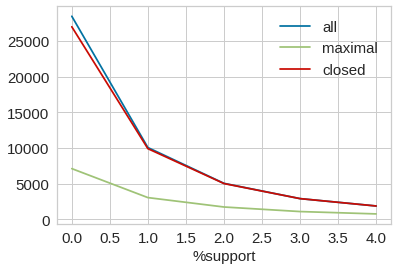

In [ ]:
len_max_it = []
len_cl_it = []
len_all_it = []
for i in range(1, 5+1):
    max_itemsets = apriori(X, target='m', supp=i, zmin=3)
    cl_itemsets = apriori(X, target='c', supp=i, zmin=3)
    all_itemsets = apriori(X, target='s', supp=i, zmin=3)
    len_max_it.append( len(max_itemsets)  )
    len_cl_it.append( len(cl_itemsets) )
    len_all_it.append( len(all_itemsets) )
    
plt.plot(len_all_it, label='all')
plt.plot(len_max_it, label='maximal')
plt.plot(len_cl_it, label='closed')
plt.legend(fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('%support', fontsize=15)

plt.show()

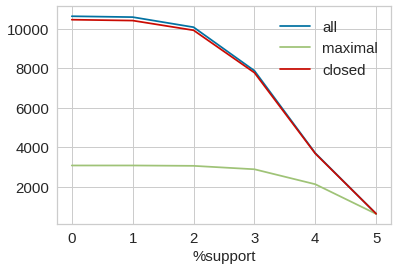

In [ ]:
len_max_it = []
len_cl_it = []
len_all_it = []
for i in range(1, 6+1):
    max_itemsets = apriori(X, target='m', supp=2, zmin=i)
    cl_itemsets = apriori(X, target='c', supp=2, zmin=i)
    all_itemsets = apriori(X, target='s', supp=2, zmin=i)
    len_max_it.append( len(max_itemsets)  )
    len_cl_it.append( len(cl_itemsets) )
    len_all_it.append( len(all_itemsets) )

plt.plot(len_all_it, label='all')
plt.plot(len_max_it, label='maximal')
plt.plot(len_cl_it, label='closed')
plt.legend(fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('%support', fontsize=15)

plt.show()

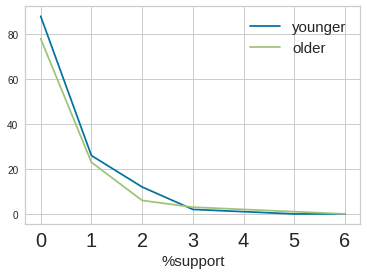

In [ ]:
filter_0 = []
filter_1 = []


for i in range(2, 8+1):
    max_itemsets = apriori(X, target='a', supp=i, zmin=3)
    
    len_filter_0=0

    len_filter_0+=len([item for item in max_itemsets if '0.0_Age_of_Aquisition' in item[0]])
    len_filter_0+=len([item for item in max_itemsets if '1.0_Age_of_Aquisition' in item[0]])
    len_filter_0+=len([item for item in max_itemsets if '2.0_Age_of_Aquisition' in item[0]])
    len_filter_0+=len([item for item in max_itemsets if '3.0_Age_of_Aquisition' in item[0]])
    len_filter_0+=len([item for item in max_itemsets if '4.0_Age_of_Aquisition' in item[0]])
    len_filter_0+=len([item for item in max_itemsets if '5.0_Age_of_Aquisition' in item[0]])

    filter_0.append( len_filter_0 )

    len_filter_1=0
    len_filter_1+=len([item for item in max_itemsets if '6.0_Age_of_Aquisition' in item[0]])
    len_filter_1+=len([item for item in max_itemsets if '7.0_Age_of_Aquisition' in item[0]])
    len_filter_1+=len([item for item in max_itemsets if '8.0_Age_of_Aquisition' in item[0]])
    len_filter_1+=len([item for item in max_itemsets if '9.0_Age_of_Aquisition' in item[0]])
    len_filter_1+=len([item for item in max_itemsets if '10.0_Age_of_Aquisition' in item[0]])

    filter_1.append( len_filter_1 )

    
plt.plot(filter_0, label='younger')
plt.plot(filter_1, label='older')



plt.legend(fontsize=15)
plt.xticks(fontsize=20)
plt.xlabel('%support', fontsize=15)

plt.show()

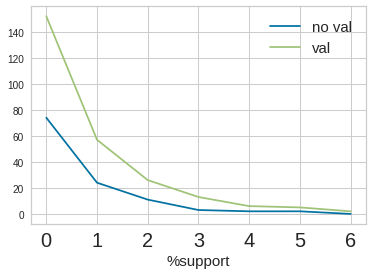

In [ ]:
filter_0 = []
filter_1 = []


for i in range(2, 8+1):
    max_itemsets = apriori(X, target='a', supp=i, zmin=3)
    
    len_filter_0=0

    len_filter_0+=len([item for item in max_itemsets if '0.0_Valence' in item[0]])
    len_filter_0+=len([item for item in max_itemsets if '1.0_Valence' in item[0]])
    len_filter_0+=len([item for item in max_itemsets if '2.0_Valence' in item[0]])
    len_filter_0+=len([item for item in max_itemsets if '3.0_Valence' in item[0]])
    len_filter_0+=len([item for item in max_itemsets if '4.0_Valence' in item[0]])
    len_filter_0+=len([item for item in max_itemsets if '5.0_Valence' in item[0]])

    filter_0.append( len_filter_0 )

    len_filter_1=0
    len_filter_1+=len([item for item in max_itemsets if '6.0_Valence' in item[0]])
    len_filter_1+=len([item for item in max_itemsets if '7.0_Valence' in item[0]])
    len_filter_1+=len([item for item in max_itemsets if '8.0_Valence' in item[0]])
    len_filter_1+=len([item for item in max_itemsets if '9.0_Valence' in item[0]])
    len_filter_1+=len([item for item in max_itemsets if '10.0_Valence' in item[0]])

    filter_1.append( len_filter_1 )

    
plt.plot(filter_0, label='no val')
plt.plot(filter_1, label='val')



plt.legend(fontsize=15)
plt.xticks(fontsize=20)
plt.xlabel('%support', fontsize=15)

plt.show()

### Association Rules

In [ ]:
rules = apriori(X_no_pol, target='r', supp=7, zmin=1, conf=75, report='aScl')
len(rules)

51

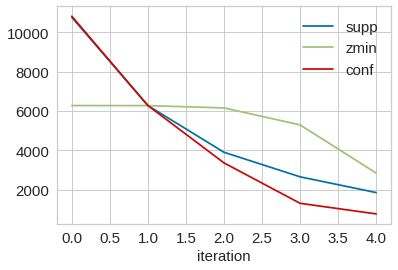

In [ ]:
rules_supp = []
rules_zmin = []
rules_conf = []

supp_range=[6,8,10,12,14]

zmin_range=[1,2,3,4,5]

conf_range=[50,60,70,80,90]

for i,j,k in zip(supp_range,zmin_range,conf_range):
    suppp = apriori(X, target='r', supp=i,conf=60)
    zminn = apriori(X, target='r', zmin=j,conf=60,supp=8)
    confi = apriori(X, target='r', conf=k,supp=8)
    rules_supp.append( len(suppp)  )
    rules_zmin.append( len(zminn) )
    rules_conf.append( len(confi) )
    
plt.plot(rules_supp, label='supp')
plt.plot(rules_zmin, label='zmin')
plt.plot(rules_conf, label='conf')
plt.legend(fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('iteration', fontsize=15)

plt.show()

In [ ]:
count=0
for i in range(len(rules)):
  if rules[i][5]>1.6:
    count+=1
    print(rules[i][1], rules[i][0], rules[i][5])
    print("\n")
print(count)

('0.0_Age_of_Aquisition', '3.0_Perceivability') 3.0_Familiarity 2.0291812958222906


('0.0_Age_of_Aquisition', '0.0_Lenght') 3.0_Familiarity 2.092629715676513


('0.0_Age_of_Aquisition', '2.0_Dominance') 3.0_Familiarity 2.15094549757535


('0.0_Age_of_Aquisition', '2.0_Valence') 3.0_Familiarity 2.0607110927721615


('0.0_Age_of_Aquisition',) 3.0_Familiarity 2.0683135425501837


('3.0_Valence', '2.0_Arousal') 2.0_Dominance 1.6851493862268596


('3.0_Valence', '2.0_SemSize') 2.0_Dominance 1.6761757612300272


('3.0_Perceivability', '7.0_Web_Corpus_Freq', '2.0_Valence') 3.0_Familiarity 1.7993229600606484


('3.0_Perceivability', '1.0_Age_of_Aquisition', '2.0_Dominance') 2.0_Valence 1.6206524147097918


('3.0_Perceivability', '0.0_Lenght', '2.0_Dominance') 2.0_Valence 1.6045936704181385


('3.0_Perceivability', '1.0_Masculinity') 2.0_Valence 1.6422164675005584


('3.0_Perceivability', '1.0_SemSize', '2.0_Dominance') 2.0_Valence 1.6413434838948537


('3.0_Perceivability', '1.0_SemSize', '1.

In [ ]:
dom1=[r for r in rules if r[0] == '1.0_Dominance']

In [ ]:
val2=[r for r in rules if r[0] == '2.0_Valence']

In [ ]:
print(dom1)

[('1.0_Dominance', ('1.0_Valence', '1.0_Perceivability', '1.0_Lenght'), 401, 8.56471593336181, 0.8285123966942148, 1.6865630614444844), ('1.0_Dominance', ('1.0_Valence', '1.0_Perceivability'), 528, 11.277231952157198, 0.822429906542056, 1.6741812271434375), ('1.0_Dominance', ('1.0_Valence', '1.0_SemSize', '1.0_Arousal'), 435, 9.29090132422042, 0.8285714285714286, 1.6866832298136647), ('1.0_Dominance', ('1.0_Valence', '1.0_SemSize', '1.0_Lenght'), 411, 8.778299871849637, 0.8187250996015937, 1.666639528841157), ('1.0_Dominance', ('1.0_Valence', '1.0_SemSize'), 555, 11.853908586074327, 0.8149779735682819, 1.65901168358552), ('1.0_Dominance', ('1.0_Valence', '2.0_Masculinity', '1.0_Arousal', '1.0_Lenght'), 405, 8.650149508756941, 0.805168986083499, 1.6390439968882358), ('1.0_Dominance', ('1.0_Valence', '2.0_Masculinity', '1.0_Arousal'), 552, 11.78983340452798, 0.8165680473372781, 1.6622485207100592), ('1.0_Dominance', ('1.0_Valence', '1.0_Arousal', '2.0_Familiarity'), 459, 9.8035027765912,

In [ ]:
for el in range(len(dom1)):
  print( 'to_predict:', [r for r in rules if r[0] == '1.0_Dominance'][el][0])
  print( 'how?', [r for r in rules if r[0] == '1.0_Dominance'][el][1])

to_predict: 1.0_Dominance
how? ('1.0_Valence', '1.0_Perceivability', '1.0_Lenght')
to_predict: 1.0_Dominance
how? ('1.0_Valence', '1.0_Perceivability')
to_predict: 1.0_Dominance
how? ('1.0_Valence', '1.0_SemSize', '1.0_Arousal')
to_predict: 1.0_Dominance
how? ('1.0_Valence', '1.0_SemSize', '1.0_Lenght')
to_predict: 1.0_Dominance
how? ('1.0_Valence', '1.0_SemSize')
to_predict: 1.0_Dominance
how? ('1.0_Valence', '2.0_Masculinity', '1.0_Arousal', '1.0_Lenght')
to_predict: 1.0_Dominance
how? ('1.0_Valence', '2.0_Masculinity', '1.0_Arousal')
to_predict: 1.0_Dominance
how? ('1.0_Valence', '1.0_Arousal', '2.0_Familiarity')
to_predict: 1.0_Dominance
how? ('1.0_Valence', '1.0_Arousal', '1.0_Lenght')
to_predict: 1.0_Dominance
how? ('1.0_Valence', '1.0_Arousal')


In [ ]:
for el in range(len(val2)):
  print( 'to_predict:', [r for r in rules if r[0] == '2.0_Valence'][el][0])
  print( 'how?', [r for r in rules if r[0] == '2.0_Valence'][el][1])

to_predict: 2.0_Valence
how? ('3.0_Perceivability', '1.0_Age_of_Aquisition', '1.0_Arousal')
to_predict: 2.0_Valence
how? ('3.0_Perceivability', '1.0_Age_of_Aquisition', '1.0_Lenght')
to_predict: 2.0_Valence
how? ('3.0_Perceivability', '1.0_Age_of_Aquisition')
to_predict: 2.0_Valence
how? ('3.0_Perceivability', '1.0_SemSize')
to_predict: 2.0_Valence
how? ('3.0_Perceivability', '2.0_Dominance')
to_predict: 2.0_Valence
how? ('3.0_Perceivability', '1.0_Arousal', '1.0_Lenght')
to_predict: 2.0_Valence
how? ('3.0_Perceivability', '1.0_Arousal')
to_predict: 2.0_Valence
how? ('3.0_Perceivability', '1.0_Lenght')
to_predict: 2.0_Valence
how? ('3.0_Perceivability',)
to_predict: 2.0_Valence
how? ('1.0_Age_of_Aquisition', '1.0_SemSize', '2.0_Dominance')
to_predict: 2.0_Valence
how? ('1.0_Age_of_Aquisition', '2.0_Dominance', '1.0_Arousal')
to_predict: 2.0_Valence
how? ('1.0_SemSize', '2.0_Dominance', '1.0_Arousal')
to_predict: 2.0_Valence
how? ('1.0_SemSize', '2.0_Dominance', '2.0_Familiarity')
to_pr

In [ ]:
# <--
rules[0][0], rules[0][1]

('Not Polysemy', ('8_Lenght',))

In [ ]:
# asbolute support
rules[0][2]

484

In [ ]:
# support as percentage
rules[0][3]

10.337462622810763

In [ ]:
# confidence
rules[0][4]

0.983739837398374

In [ ]:
# lift
rules[0][5]

1.0703857584706453